**Importing Dataset from Kaggle**


In [ ]:
import kagglehub


path = kagglehub.dataset_download("aastha2807/denoising")

print("Path to dataset files:", path)

100%|██████████| 746M/746M [00:37<00:00, 21.1MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1


In [ ]:
# Install PyTorch/Torchvision (check pytorch.org for specific command for your system/CUDA)
!pip install torch torchvision torchaudio

# Install other necessary libraries
!pip install numpy matplotlib Pillow tqdm scikit-image pandas
!pip install scikit-image tqdm pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvji

**Project Setup - Paths and Parameters**

In [ ]:
# === CELL: Project Setup - Paths and Parameters ===

import os
import random
import numpy as np

# --- 1. Define Base Paths ---

# Path where the original CLEAN images were downloaded and extracted
CLEAN_DATA_BASE_PATH = '/root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1'

# Path where the generated NOISY image subsets are stored
# (This points to the dataset with G=50, S&P=0.15, Sp=0.1)
NOISY_DATA_BASE_PATH = '/content/denoising_dataset_noisy_subset_single_g50'

# --- 2. Define Specific Clean Data Directories ---
CLEAN_TRAIN_DIR = os.path.join(CLEAN_DATA_BASE_PATH, 'train', 'twenty_fivek_hr')
CLEAN_TEST_DIR = os.path.join(CLEAN_DATA_BASE_PATH, 'test', 'twenty_fivek_hr')

# --- 3. Define Subset Sizes ---
NUM_TRAIN_IMAGES = 5000
NUM_TEST_IMAGES = 1250

# --- 4. Set Random Seeds for Reproducibility ---
# (Using the same seed ensures consistency if data generation or sampling is re-run)
SEED = 42
random.seed(SEED)
np.random.seed(SEED)


# --- 5. Print Setup Confirmation ---
print("--- Project Setup Parameters ---")
print(f"Clean Data Base Path : {CLEAN_DATA_BASE_PATH}")
print(f"  Clean Train Dir    : {CLEAN_TRAIN_DIR}")
print(f"  Clean Test Dir     : {CLEAN_TEST_DIR}")
print(f"Noisy Data Base Path : {NOISY_DATA_BASE_PATH}")
print(f"Subset Size - Train  : {NUM_TRAIN_IMAGES}")
print(f"Subset Size - Test   : {NUM_TEST_IMAGES}")
print(f"Random Seed Set To   : {SEED}")
print("-" * 30)

# --- Optional: Check if paths exist ---
# if not os.path.isdir(CLEAN_TRAIN_DIR): print(f"WARNING: Clean train directory not found: {CLEAN_TRAIN_DIR}")
# if not os.path.isdir(CLEAN_TEST_DIR): print(f"WARNING: Clean test directory not found: {CLEAN_TEST_DIR}")
# if not os.path.isdir(NOISY_DATA_BASE_PATH): print(f"WARNING: Noisy data directory not found: {NOISY_DATA_BASE_PATH}")

--- Project Setup Parameters ---
Clean Data Base Path : /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1
  Clean Train Dir    : /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1/train/twenty_fivek_hr
  Clean Test Dir     : /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1/test/twenty_fivek_hr
Noisy Data Base Path : /content/denoising_dataset_noisy_subset_single_g50
Subset Size - Train  : 5000
Subset Size - Test   : 1250
Random Seed Set To   : 42
------------------------------


In [ ]:
# === CELL: Data Generation ===

import os
import cv2 # Using OpenCV for reading/writing images
import numpy as np
from tqdm.notebook import tqdm # Use tqdm.notebook for Colab/Jupyter progress bars
import random


print("--- Starting Noisy Data Generation ---")

# --- 1. Define Paths and Noise Configurations ---

try:
    if not isinstance(CLEAN_DATA_BASE_PATH, str): raise NameError
    train_clean_path = os.path.join(CLEAN_DATA_BASE_PATH, 'train', 'twenty_fivek_hr')
    test_clean_path = os.path.join(CLEAN_DATA_BASE_PATH, 'test', 'twenty_fivek_hr')
    print(f"Using Clean Train Dir : {train_clean_path}")
    print(f"Using Clean Test Dir  : {test_clean_path}")
except NameError:
    print("ERROR: CLEAN_DATA_BASE_PATH not defined. Please run the Setup cell first.")
    raise

try:
    if not isinstance(NOISY_DATA_BASE_PATH, str): raise NameError
    output_base_path = NOISY_DATA_BASE_PATH # e.g., '/content/denoising_dataset_noisy_subset_single_g50'
    print(f"Output Noisy Data Path: {output_base_path}")
except NameError:
    print("ERROR: NOISY_DATA_BASE_PATH not defined. Please run the Setup cell first.")
    raise

# Subset sizes - Check these from your Setup cell
try:
    if not isinstance(NUM_TRAIN_IMAGES, int): raise NameError
    if not isinstance(NUM_TEST_IMAGES, int): raise NameError
    print(f"Subset Sizes: Train={NUM_TRAIN_IMAGES}, Test={NUM_TEST_IMAGES}")
except NameError:
     print("ERROR: NUM_TRAIN_IMAGES or NUM_TEST_IMAGES not defined. Please run the Setup cell first.")
     raise

# Random Seed - Ensure it's set from your Setup cell
try:
    if not isinstance(SEED, int): raise NameError
    random.seed(SEED)
    np.random.seed(SEED)
    print(f"Using Random Seed: {SEED}")
except NameError:
    print("ERROR: SEED not defined. Please run the Setup cell first.")
    raise


# Noise configurations for this dataset (G=50, S&P=0.15, Sp=0.1)
noise_configs = {
    'gaussian': [50],
    'saltpepper': [0.15],
    'speckle': [0.1]
}
print(f"Noise configurations: {noise_configs}")

# --- 2. Create Output Directories ---

print(f"\nCreating output directories under: {output_base_path}")
for split in ['train', 'test']:
    for noise_type, levels in noise_configs.items():
        level = levels[0] # Single level per type
        # Construct folder name, e.g., gaussian_50, saltpepper_015
        folder_name = f"{noise_type}_{str(level).replace('.', '')}"
        dir_path = os.path.join(output_base_path, split, folder_name)
        try:
            os.makedirs(dir_path, exist_ok=True)
        except OSError as e:
            print(f"Error creating directory {dir_path}: {e}")
            # Decide how to handle error - maybe stop execution?
            raise

print("Output directory structure creation initiated.")

# --- 3. Noise Generation Functions ---
# (These functions add noise to NumPy arrays read by cv2)

def add_gaussian_noise(image, sigma):
    row, col, ch = image.shape
    mean = 0
    # Generate noise with same dimensions as image
    gauss = np.random.normal(mean, sigma, (row, col, ch)).astype(np.float32)
    # Add noise and clip to valid range [0, 255]
    noisy_image = np.clip(image.astype(np.float32) + gauss, 0, 255)
    return noisy_image.astype(np.uint8)

def add_salt_pepper_noise(image, density):
    output = np.copy(image)
    row, col, ch = image.shape
    if row == 0 or col == 0: return output # Handle empty images
    num_pixels = row * col # Number of pixels per channel

    # Calculate number of salt/pepper pixels based on density
    num_salt = int(np.ceil(density * num_pixels * 0.5))
    num_pepper = int(np.ceil(density * num_pixels * 0.5))

    # Add Salt (set pixels to 255)
    salt_coords_rows = np.random.randint(0, row, num_salt)
    salt_coords_cols = np.random.randint(0, col, num_salt)
    output[salt_coords_rows, salt_coords_cols, :] = 255

    # Add Pepper (set pixels to 0)
    pepper_coords_rows = np.random.randint(0, row, num_pepper)
    pepper_coords_cols = np.random.randint(0, col, num_pepper)
    output[pepper_coords_rows, pepper_coords_cols, :] = 0
    return output.astype(np.uint8)

def add_speckle_noise(image, variance):
    row, col, ch = image.shape
    # Generate noise N(0, variance), std dev is sqrt(variance)
    gauss = np.random.normal(0, variance**0.5, (row, col, ch)).astype(np.float32)
    # Add multiplicative noise: Image + Image * Noise
    noisy_image = np.clip(image.astype(np.float32) + image.astype(np.float32) * gauss, 0, 255)
    return noisy_image.astype(np.uint8)


# --- 4. Process Images and Save Noisy Versions ---

def process_and_save_images(clean_dir, output_dir_base, split_name, num_images_to_select):
    print(f"\nProcessing images in: {clean_dir} for {split_name} split...")
    # Ensure clean directory exists before listing
    if not os.path.isdir(clean_dir):
         print(f"ERROR: Clean directory not found: {clean_dir}. Cannot process images.")
         return

    all_image_files = [f for f in os.listdir(clean_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if not all_image_files:
        print(f"Warning: No image files found in {clean_dir}. Skipping.")
        return

    # Select the random subset using the fixed seed (set earlier)
    if len(all_image_files) >= num_images_to_select:
        print(f"Selecting {num_images_to_select} random images from {len(all_image_files)}...")
        image_files_subset = random.sample(all_image_files, num_images_to_select)
    else:
        print(f"Warning: Requested {num_images_to_select}, found {len(all_image_files)}. Using all.")
        image_files_subset = all_image_files

    print(f"Will process {len(image_files_subset)} images for {split_name} split.")

    # Loop through the selected subset of image files
    for filename in tqdm(image_files_subset, desc=f"Generating {split_name} noisy images"):
        clean_image_path = os.path.join(clean_dir, filename)
        try:
            # Read the clean image using OpenCV (reads as BGR)
            img = cv2.imread(clean_image_path)
            # Basic check if image loading failed
            if img is None:
                print(f"Warning: Failed to read image {clean_image_path}. Skipping.")
                continue
            # Check if image has valid dimensions
            if img.shape[0] == 0 or img.shape[1] == 0:
                print(f"Warning: Image {clean_image_path} has zero dimension. Skipping.")
                continue

            # Generate and save noisy images for ALL defined noise types
            for noise_type, levels in noise_configs.items():
                level = levels[0] # Single level per type
                noisy_img = None
                # Call the appropriate noise function
                if noise_type == 'gaussian': noisy_img = add_gaussian_noise(img, sigma=level)
                elif noise_type == 'saltpepper': noisy_img = add_salt_pepper_noise(img, density=level)
                elif noise_type == 'speckle': noisy_img = add_speckle_noise(img, variance=level)

                # If noise generation was successful, save the image
                if noisy_img is not None:
                    folder_name = f"{noise_type}_{str(level).replace('.', '')}"
                    output_path = os.path.join(output_dir_base, split_name, folder_name, filename)
                    # Save the noisy image using OpenCV
                    success = cv2.imwrite(output_path, noisy_img)
                    if not success:
                        print(f"Warning: Failed to write noisy image to {output_path}")

        except Exception as e:
            # Print error message if processing a file fails
            print(f"ERROR processing file {filename}: {e}")

# --- Execute the processing for Train and Test sets ---
# Ensure the clean directories exist before calling the function
if os.path.isdir(train_clean_path):
    process_and_save_images(train_clean_path, output_base_path, 'train', NUM_TRAIN_IMAGES)
else:
    print(f"SKIPPING training set processing - Directory not found: {train_clean_path}")

if os.path.isdir(test_clean_path):
    process_and_save_images(test_clean_path, output_base_path, 'test', NUM_TEST_IMAGES)
else:
    print(f"SKIPPING test set processing - Directory not found: {test_clean_path}")


print(f"\n--- Finished Data Generation Attempt ---")
print(f"Noisy data should now be available in: {output_base_path}")
print("Please verify the folders and image counts.")

--- Starting Noisy Data Generation ---
Using Clean Train Dir : /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1/train/twenty_fivek_hr
Using Clean Test Dir  : /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1/test/twenty_fivek_hr
Output Noisy Data Path: /content/denoising_dataset_noisy_subset_single_g50
Subset Sizes: Train=5000, Test=1250
Using Random Seed: 42
Noise configurations: {'gaussian': [50], 'saltpepper': [0.15], 'speckle': [0.1]}

Creating output directories under: /content/denoising_dataset_noisy_subset_single_g50
Output directory structure creation initiated.

Processing images in: /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1/train/twenty_fivek_hr for train split...
Selecting 5000 random images from 20000...
Will process 5000 images for train split.


Generating train noisy images:   0%|          | 0/5000 [00:00<?, ?it/s]


Processing images in: /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1/test/twenty_fivek_hr for test split...
Selecting 1250 random images from 5000...
Will process 1250 images for test split.


Generating test noisy images:   0%|          | 0/1250 [00:00<?, ?it/s]


--- Finished Data Generation Attempt ---
Noisy data should now be available in: /content/denoising_dataset_noisy_subset_single_g50
Please verify the folders and image counts.


Dataset and DataLoader Setup

In [ ]:
# === CELL 3: Dataset and DataLoader Setup (CORRECTED for High Noise: G50, S&P 0.15, Sp 0.1) ===

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

print("--- Defining Dataset Class, Transforms, and DataLoader Helper ---")

# --- 1. DenoisingDataset Class Definition ---

class DenoisingDataset(Dataset):
    def __init__(self, noisy_dir, clean_dir, transform=None):
        self.noisy_dir = noisy_dir; self.clean_dir = clean_dir; self.transform = transform
        if not os.path.isdir(noisy_dir): raise FileNotFoundError(f"Noisy dir not found: {noisy_dir}")
        if not os.path.isdir(clean_dir): raise FileNotFoundError(f"Clean dir not found: {clean_dir}")
        self.image_filenames = [f for f in os.listdir(noisy_dir) if os.path.isfile(os.path.join(noisy_dir, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not self.image_filenames: print(f"Warning: No image files found in {noisy_dir}")
    def __len__(self): return len(self.image_filenames)
    def __getitem__(self, idx):
        if torch.is_tensor(idx): idx = idx.tolist()
        img_name = self.image_filenames[idx]
        noisy_img_path = os.path.join(self.noisy_dir, img_name); clean_img_path = os.path.join(self.clean_dir, img_name)
        try:
            noisy_image = Image.open(noisy_img_path).convert('RGB'); clean_image = Image.open(clean_img_path).convert('RGB')
        except FileNotFoundError as e: raise FileNotFoundError(f"Could not find: {e.filename} (Idx: {idx})") from e
        except Exception as e: raise IOError(f"Error processing: {img_name} (Idx: {idx})") from e
        if self.transform: noisy_image = self.transform(noisy_image); clean_image = self.transform(clean_image)
        return noisy_image, clean_image


# --- 2. Define Transformations ---
# image_transform = transforms.Compose([
#     transforms.Resize((128, 128)),
#     transforms.ToTensor() # Scales images to [0.0, 1.0]
# ])
# # print("Defined: image_transform (Resize -> ToTensor)") # Optional print

# In Cell 3 (or wherever transform is defined)
image_transform = transforms.Compose([
    transforms.Resize((224, 224)), # <-- Change to 224
    transforms.ToTensor()
])


# --- 3. DataLoader Helper Function Definition ---

def create_denoising_loaders(noise_type, noise_level, base_noisy_path, base_clean_path, batch_size, transform):
    level_str = str(noise_level).replace('.', '')
    folder_name = f"{noise_type}_{level_str}" # e.g., gaussian_50, saltpepper_015, speckle_01
    noisy_train_dir = os.path.join(base_noisy_path, 'train', folder_name)
    noisy_test_dir = os.path.join(base_noisy_path, 'test', folder_name)
    # Assuming CLEAN_DATA_BASE_PATH is defined from Cell 1
    clean_train_dir = os.path.join(base_clean_path, 'train', 'twenty_fivek_hr')
    clean_test_dir = os.path.join(base_clean_path, 'test', 'twenty_fivek_hr')
    print(f"\n--- Setting up DataLoaders for Noise: {noise_type} (Level: {noise_level}) ---")
    print(f"Using Noisy Train Path: {noisy_train_dir}"); print(f"Using Noisy Test Path: {noisy_test_dir}")
    train_loader, test_loader = None, None
    try: # Train Loader
        train_dataset = DenoisingDataset(noisy_dir=noisy_train_dir, clean_dir=clean_train_dir, transform=transform)
        print(f"  Training dataset size: {len(train_dataset)}")
        if len(train_dataset) > 0: train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
        else: print("  Skipping Training DataLoader (dataset empty/path error).")
    except Exception as e: print(f"  Error creating training dataset/loader: {e}")
    try: # Test Loader
        test_dataset = DenoisingDataset(noisy_dir=noisy_test_dir, clean_dir=clean_test_dir, transform=transform)
        print(f"  Test dataset size: {len(test_dataset)}")
        if len(test_dataset) > 0: test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
        else: print("  Skipping Test DataLoader (dataset empty/path error).")
    except Exception as e: print(f"  Error creating test dataset/loader: {e}")
    if train_loader: print(f"  Created Training DataLoader (Batch Size: {batch_size}).")
    if test_loader: print(f"  Created Test DataLoader (Batch Size: {batch_size}).")
    return train_loader, test_loader
# print("Defined: create_denoising_loaders") # Optional print


# --- 4. Define Paths and Parameters for HIGH Noise Loaders ---

# === Path where HIGH noise images (G50, S&P 0.15, Sp 0.1) should exist ===
noisy_data_base = '/content/denoising_dataset_noisy_subset_single_g50' # CORRECT HIGH NOISE PATH

# Ensure CLEAN_DATA_BASE_PATH is defined from Cell 1
try:
     if not isinstance(CLEAN_DATA_BASE_PATH, str): raise NameError("CLEAN_DATA_BASE_PATH not defined")
     clean_data_base = CLEAN_DATA_BASE_PATH
except NameError as e:
     print(f"ERROR: {e}. Please run the Setup cell (Cell 1) first.")
     raise

# Batch size for loaders
BATCH_SIZE = 32
print(f"\nTarget Noisy Base Path : {noisy_data_base}")
print(f"Target Clean Base Path : {clean_data_base}")
print(f"Target Batch Size      : {BATCH_SIZE}")

# --- 5. Create Loaders for Each HIGH Noise Type ---

# Gaussian (Sigma=50)
gaussian_50_train_loader, gaussian_50_test_loader = create_denoising_loaders(
    noise_type='gaussian', noise_level=50,
    base_noisy_path=noisy_data_base, base_clean_path=clean_data_base,
    batch_size=BATCH_SIZE, transform=image_transform
)

# Salt & Pepper (Density=0.15)
saltpepper_015_train_loader, saltpepper_015_test_loader = create_denoising_loaders(
    noise_type='saltpepper', noise_level=0.15, # High level
    base_noisy_path=noisy_data_base, base_clean_path=clean_data_base,
    batch_size=BATCH_SIZE, transform=image_transform
)

# Speckle (Variance=0.1)
speckle_01_train_loader, speckle_01_test_loader = create_denoising_loaders(
    noise_type='speckle', noise_level=0.1, # High level
    base_noisy_path=noisy_data_base, base_clean_path=clean_data_base,
    batch_size=BATCH_SIZE, transform=image_transform
)

print("\n--- Attempted creation of all DataLoaders for High Noise levels ---")
# Optional: Verification check for one loader
if saltpepper_015_train_loader: # Check one of the high noise loaders
    print("\nVerifying one batch from sp_015_train_loader...")
    try:
        noisy_batch, clean_batch = next(iter(saltpepper_015_train_loader))
        print(f"  Sample Batch Shapes - Noisy: {noisy_batch.shape}, Clean: {clean_batch.shape}")
    except StopIteration: print("  Could not load batch: DataLoader is empty.")
    except Exception as e: print(f"  Error loading batch: {e}")

--- Defining Dataset Class, Transforms, and DataLoader Helper ---

Target Noisy Base Path : /content/denoising_dataset_noisy_subset_single_g50
Target Clean Base Path : /root/.cache/kagglehub/datasets/aastha2807/denoising/versions/1
Target Batch Size      : 32

--- Setting up DataLoaders for Noise: gaussian (Level: 50) ---
Using Noisy Train Path: /content/denoising_dataset_noisy_subset_single_g50/train/gaussian_50
Using Noisy Test Path: /content/denoising_dataset_noisy_subset_single_g50/test/gaussian_50
  Training dataset size: 5000
  Test dataset size: 1250
  Created Training DataLoader (Batch Size: 32).
  Created Test DataLoader (Batch Size: 32).

--- Setting up DataLoaders for Noise: saltpepper (Level: 0.15) ---
Using Noisy Train Path: /content/denoising_dataset_noisy_subset_single_g50/train/saltpepper_015
Using Noisy Test Path: /content/denoising_dataset_noisy_subset_single_g50/test/saltpepper_015
  Training dataset size: 5000
  Test dataset size: 1250
  Created Training DataLoader 

** Definitions (Models, Metrics, Train/Eval, Visualize Functions)**

In [ ]:
# === CELL 4: Definitions (Models, Metrics, Train/Eval, Visualize Functions) ===

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time
import math
import torch.nn.functional as F # For padding in UNet Up block

# Ensure scikit-image is installed (`pip install scikit-image`)
try:
    from skimage.metrics import peak_signal_noise_ratio as psnr
    from skimage.metrics import structural_similarity as ssim
    from skimage.metrics import mean_squared_error as mse
except ImportError:
    print("ERROR: scikit-image not found. Please install it: pip install scikit-image")
    raise

print("--- Defining Models and Helper Functions ---")

# --- 1. Model Definitions ---

# == ConvAutoencoder ==
class ConvAutoencoder(nn.Module):
    def __init__(self, input_channels=3):
        super(ConvAutoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, 32, kernel_size=3, stride=1, padding=1), nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1), nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), nn.ReLU(True),
            nn.MaxPool2d(kernel_size=2, stride=2) # Output: B x 128 x H/8 x W/8
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2), nn.ReLU(True), # H/4
            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2), nn.ReLU(True),  # H/2
            nn.ConvTranspose2d(32, input_channels, kernel_size=2, stride=2), # H
            nn.Sigmoid() # Output range [0, 1]
        )
    def forward(self, x):
        x = self.encoder(x); x = self.decoder(x); return x
print("Defined: ConvAutoencoder")

# == UNet (and its helper blocks) ==
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__();
        if not mid_channels: mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(mid_channels), nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True)
        );
    def forward(self, x): return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__(); self.maxpool_conv = nn.Sequential(nn.MaxPool2d(2), DoubleConv(in_channels, out_channels));
    def forward(self, x): return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__();
        # Input channels for the DoubleConv is the sum of channels from skip connection + channels from upsampled path
        conv_in_channels = out_channels + out_channels # Default assuming skip connection has same channels as desired output 'out_channels'
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            # After upsample, channels from below are `in_channels`. Skip connection channels are `out_channels`.
            conv_in_channels = in_channels + out_channels
        else:
            # ConvTranspose handles both upsampling and channel changing
            self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
            # After ConvTranspose, channels are `out_channels`. Skip connection channels are also `out_channels`.
            conv_in_channels = out_channels + out_channels

        self.conv = DoubleConv(conv_in_channels, out_channels) # Use calculated input channels

    def forward(self, x1, x2): # x1=from below (higher channels), x2=skip connection (target out channels)
        x1 = self.up(x1)
        # Pad x1 (upsampled) to match x2 (skip connection) size
        diffY = x2.size()[2] - x1.size()[2]; diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        # Concatenate skip connection (x2) and upsampled features (x1)
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__(); self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1);
    def forward(self, x): return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=3, bilinear=True):
        super(UNet, self).__init__();
        self.n_channels, self.n_classes, self.bilinear = n_channels, n_classes, bilinear
        # Define channel hierarchy
        c1, c2, c3, c4, c5 = 64, 128, 256, 512, 512 # Last one is bottleneck
        self.inc = DoubleConv(n_channels, c1)
        self.down1 = Down(c1, c2); self.down2 = Down(c2, c3); self.down3 = Down(c3, c4)
        self.down4 = Down(c4, c5) # Bottleneck layer
        # Decoder path: `in_channels` for Up block is from layer below, `out_channels` is target for this level (matches skip)
        self.up1 = Up(c5, c4, bilinear)   # Below: c5, Skip: c4 -> Output: c4
        self.up2 = Up(c4, c3, bilinear)   # Below: c4, Skip: c3 -> Output: c3
        self.up3 = Up(c3, c2, bilinear)   # Below: c3, Skip: c2 -> Output: c2
        self.up4 = Up(c2, c1, bilinear)   # Below: c2, Skip: c1 -> Output: c1
        self.outc = OutConv(c1, n_classes)
        self.final_activation = nn.Sigmoid()
    def forward(self, x):
        x1=self.inc(x); x2=self.down1(x1); x3=self.down2(x2); x4=self.down3(x3); x5=self.down4(x4)
        x=self.up1(x5, x4); x=self.up2(x, x3); x=self.up3(x, x2); x=self.up4(x, x1)
        logits=self.outc(x); output=self.final_activation(logits); return output
print("Defined: UNet (and helper blocks)")

# === Add these GAN Component definitions to CELL 4: Definitions ===

# --- Weight Initialization Function ---
# Often helpful for GAN stability
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        try: # Use standard initialization if possible
             nn.init.normal_(m.weight.data, 0.0, 0.02)
             if hasattr(m, 'bias') and m.bias is not None:
                 nn.init.constant_(m.bias.data, 0.0)
        except AttributeError: # Fallback for layers without weights/bias
             pass # Or print a warning
    elif classname.find('BatchNorm') != -1:
        try:
             nn.init.normal_(m.weight.data, 1.0, 0.02)
             nn.init.constant_(m.bias.data, 0.0)
        except AttributeError:
             pass
print("Defined: weights_init_normal") # Optional print

# --- PatchGAN Discriminator Definition ---
class PatchGANDiscriminator(nn.Module):
    """
    Defines a PatchGAN discriminator network.
    Takes concatenated (Noisy Image, Real/Fake Clean Image) as input.
    Input channels = input_nc = 3 (noisy) + 3 (clean/fake) = 6
    Outputs a map of patch classifications (B x 1 x H_patch x W_patch).
    """
    def __init__(self, input_nc=6, ndf=64, n_layers=3, norm_layer=nn.BatchNorm2d):
        """
        Args:
            input_nc (int): Number of input channels (noisy_ch + clean_ch).
            ndf (int): Number of filters in the first conv layer.
            n_layers (int): Number of intermediate conv layers in the discriminator.
            norm_layer (nn.Module): Normalization layer type.
        """
        super(PatchGANDiscriminator, self).__init__()

        # BatchNorm has bias, InstanceNorm might not depending on affine=True/False
        use_bias = norm_layer == nn.InstanceNorm2d

        kw = 4 # Kernel size
        padw = 1 # Padding
        sequence = [
            # Initial layer: Conv -> LeakyReLU
            nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw),
            nn.LeakyReLU(0.2, True)
        ]

        # Intermediate layers: Conv -> Norm -> LeakyReLU
        nf_mult = 1
        for n in range(1, n_layers):
            nf_mult_prev = nf_mult
            nf_mult = min(2**n, 8) # Double features, cap at ndf*8
            sequence += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=use_bias),
                norm_layer(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        # Final convolutional layer before output layer (stride 1)
        nf_mult_prev = nf_mult
        nf_mult = min(2**n_layers, 8)
        sequence += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=use_bias),
            norm_layer(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]

        # Output layer: 1 channel prediction map (PatchGAN output)
        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw)]

        # No final Sigmoid activation here if using BCEWithLogitsLoss or LSGAN loss later

        self.model = nn.Sequential(*sequence)

    def forward(self, input):
        """Standard forward."""
        return self.model(input)

# print("Defined: PatchGANDiscriminator") # Optional print


# print("Generator Model: Using existing UNet class definition.")
# --- 3. Metrics Calculation Function ---
def calculate_metrics(clean_img_np, denoised_img_np):
    clean_img_np = np.clip(clean_img_np, 0, 1); denoised_img_np = np.clip(denoised_img_np, 0, 1)
    mse_val = mse(clean_img_np, denoised_img_np); rmse_val = math.sqrt(mse_val)
    psnr_val = psnr(clean_img_np, denoised_img_np, data_range=1.0)
    ssim_val = ssim(clean_img_np, denoised_img_np, channel_axis=-1, data_range=1.0)
    return mse_val, rmse_val, psnr_val, ssim_val
print("Defined: calculate_metrics")

# --- 4. Visualization Function ---
def visualize_denoising(model, dataloader, device, num_images=5, title_prefix=""):
    model.eval(); num_images_found = 0; rows_plotted = 0; batch_num = 0; max_batches_to_check = 5
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 2.5 * num_images)); fig.subplots_adjust(hspace=0.4, wspace=0.1)
    if num_images == 1: axes = [axes]
    print(f"\n--- {title_prefix} Visualization & Sample Metrics ---")
    with torch.no_grad():
        for noisy_images, clean_images in dataloader:
            batch_num += 1;
            if num_images_found >= num_images or batch_num > max_batches_to_check: break
            outputs = model(noisy_images.to(device)).cpu()
            noisy_plot = noisy_images.cpu().numpy(); clean_plot = clean_images.numpy(); recon_plot = outputs.numpy()
            for i in range(noisy_images.size(0)):
                if num_images_found >= num_images: break
                clean_img_np = np.clip(np.transpose(clean_plot[i], (1, 2, 0)), 0, 1)
                noisy_img_np = np.clip(np.transpose(noisy_plot[i], (1, 2, 0)), 0, 1)
                recon_img_np = np.clip(np.transpose(recon_plot[i], (1, 2, 0)), 0, 1)
                ax_row = axes[num_images_found]
                ax_row[0].imshow(clean_img_np); ax_row[0].set_title(f"GT ({num_images_found+1})"); ax_row[0].axis('off')
                ax_row[1].imshow(noisy_img_np); ax_row[1].set_title(f"Noisy ({num_images_found+1})"); ax_row[1].axis('off')
                ax_row[2].imshow(recon_img_np); ax_row[2].set_title(f"Recon ({num_images_found+1})"); ax_row[2].axis('off')
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_img_np, recon_img_np); print(f"  Img {num_images_found+1}: MSE={mse_val:.4f}, RMSE={rmse_val:.4f}, PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")
                except Exception as e: print(f"  Img {num_images_found+1}: Metrics Error - {e}")
                num_images_found += 1
    for i in range(num_images_found, num_images): fig.delaxes(axes[i][0]); fig.delaxes(axes[i][1]); fig.delaxes(axes[i][2])
    fig.suptitle(f"{title_prefix} Denoising Comparison", fontsize=16, y=1.02 if num_images>1 else 1.08); plt.show()
print("Defined: visualize_denoising")

# --- 5. Training and Evaluation Function (for AE/UNet) ---
def train_and_evaluate_model(model, model_name, noise_type_str, train_loader, test_loader, device, num_epochs=20, learning_rate=1e-3):
    print(f"\n=== Training {model_name} on {noise_type_str} ===")
    model.to(device); criterion = nn.L1Loss().to(device); optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    start_time = time.time(); train_loss_history, test_loss_history = [], []
    if not train_loader or not test_loader: print("ERROR: Invalid dataloaders."); return model, [], [], None
    for epoch in range(num_epochs):
        epoch_start_time = time.time(); print(f"\n--- Epoch {epoch+1}/{num_epochs} ---"); model.train(); running_train_loss = 0.0
        train_progress_bar = tqdm(train_loader, desc=f"E{epoch+1} Train", leave=False)
        for noisy_imgs, clean_imgs in train_progress_bar:
            noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = model(noisy_imgs); loss = criterion(outputs, clean_imgs)
            optimizer.zero_grad(); loss.backward(); optimizer.step(); running_train_loss += loss.item() * noisy_imgs.size(0)
            train_progress_bar.set_postfix({'L1': f'{loss.item():.6f}'}) # Using L1
        epoch_train_loss = running_train_loss / len(train_loader.dataset); train_loss_history.append(epoch_train_loss); print(f"Train Loss ({criterion.__class__.__name__}): {epoch_train_loss:.6f}")
        model.eval(); running_test_loss = 0.0
        with torch.no_grad():
            for noisy_imgs, clean_imgs in test_loader:
                noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = model(noisy_imgs); loss = criterion(outputs, clean_imgs)
                running_test_loss += loss.item() * noisy_imgs.size(0)
        epoch_test_loss = running_test_loss / len(test_loader.dataset); test_loss_history.append(epoch_test_loss); print(f"Test Loss  ({criterion.__class__.__name__}): {epoch_test_loss:.6f}")
        print(f"Epoch completed in {time.time() - epoch_start_time:.2f}s")
    print(f"\nTraining Finished! Total Time: {(time.time() - start_time) / 60:.2f} min.")
    print(f"\n--- Calculating Final Test Metrics ({noise_type_str}) ---"); model.eval()
    total_mse, total_rmse, total_psnr, total_ssim = 0.0, 0.0, 0.0, 0.0; num_samples = 0
    eval_progress_bar = tqdm(test_loader, desc="Final Eval", leave=False)
    with torch.no_grad():
        for noisy_imgs, clean_imgs in eval_progress_bar:
            batch_size = clean_imgs.size(0); outputs = model(noisy_imgs.to(device)).cpu()
            clean_np = clean_imgs.numpy(); outputs_np = outputs.numpy(); actual_processed = 0
            for i in range(batch_size):
                clean_single = np.clip(np.transpose(clean_np[i], (1, 2, 0)), 0, 1); output_single = np.clip(np.transpose(outputs_np[i], (1, 2, 0)), 0, 1)
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_single, output_single); total_mse += mse_val; total_rmse += rmse_val; total_psnr += psnr_val; total_ssim += ssim_val; actual_processed += 1
                except Exception as metric_e: print(f"Warn: Metric calc error: {metric_e}")
            num_samples += actual_processed # Only count successful calculations
    avg_metrics = {};
    if num_samples > 0:
        avg_metrics["MSE"] = total_mse / num_samples; avg_metrics["RMSE"] = math.sqrt(avg_metrics["MSE"]) # Calculate RMSE from avg MSE
        avg_metrics["PSNR"] = total_psnr / num_samples; avg_metrics["SSIM"] = total_ssim / num_samples
    else: avg_metrics = {"MSE": float('nan'),"RMSE": float('nan'),"PSNR": float('nan'),"SSIM": float('nan')}
    plt.figure(figsize=(10, 5)); plt.plot(range(1, num_epochs + 1), train_loss_history, marker='o', label='Training Loss'); plt.plot(range(1, num_epochs + 1), test_loss_history, marker='o', label='Test Loss'); plt.xlabel('Epoch'); plt.ylabel(f'Loss ({criterion.__class__.__name__})');
    plt.title(f'{model_name} - Training & Test Loss ({noise_type_str})'); plt.legend(); plt.grid(True); plt.xticks(range(1, num_epochs + 1)); plt.show()
    return model, train_loss_history, test_loss_history, avg_metrics
print("Defined: train_and_evaluate_model")

print("\n--- All Definitions Complete ---")
print("Ready to run the main experiment orchestration cell (Cell 5).")

--- Defining Models and Helper Functions ---
Defined: ConvAutoencoder
Defined: UNet (and helper blocks)
Defined: weights_init_normal
Defined: calculate_metrics
Defined: visualize_denoising
Defined: train_and_evaluate_model

--- All Definitions Complete ---
Ready to run the main experiment orchestration cell (Cell 5).


Target noisy dataset path: /content/denoising_dataset_noisy_subset_single_g50
Noise configurations to run: {'gaussian': {'level': 50, 'label': 'Gaussian (Sigma=50)'}, 'saltpepper': {'level': 0.15, 'label': 'Salt & Pepper (Density=0.15)'}, 'speckle': {'level': 0.1, 'label': 'Speckle (Variance=0.1)'}}
Models to run: ['ConvAutoencoder', 'UNet']
Device for training: cuda

===== STARTING EXPERIMENTS (HIGH NOISE) =====

===== Testing Model: ConvAutoencoder =====

----------------------------------------
--- Task: ConvAutoencoder on Gaussian (Sigma=50) ---
Using loaders: gaussian_50_train_loader, gaussian_50_test_loader
  Train loader: 5000 samples. Test loader: 1250 samples.
Initializing fresh ConvAutoencoder model...
Initialized ConvAutoencoder successfully.
Using Learning Rate: 0.001, Epochs: 30

=== Training ConvAutoencoder on Gaussian (Sigma=50) ===

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.135855
Test Loss  (L1Loss): 0.093496
Epoch completed in 12.45s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.071844
Test Loss  (L1Loss): 0.067815
Epoch completed in 12.51s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.063803
Test Loss  (L1Loss): 0.068538
Epoch completed in 12.47s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.060572
Test Loss  (L1Loss): 0.059382
Epoch completed in 12.35s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.057790
Test Loss  (L1Loss): 0.057929
Epoch completed in 12.24s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.057362
Test Loss  (L1Loss): 0.056789
Epoch completed in 12.23s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055057
Test Loss  (L1Loss): 0.055490
Epoch completed in 12.44s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055203
Test Loss  (L1Loss): 0.054883
Epoch completed in 12.31s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.053386
Test Loss  (L1Loss): 0.054354
Epoch completed in 12.65s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.052016
Test Loss  (L1Loss): 0.051846
Epoch completed in 12.45s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.050467
Test Loss  (L1Loss): 0.049647
Epoch completed in 12.42s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048693
Test Loss  (L1Loss): 0.055141
Epoch completed in 12.72s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047923
Test Loss  (L1Loss): 0.046888
Epoch completed in 12.59s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046222
Test Loss  (L1Loss): 0.046436
Epoch completed in 12.65s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046326
Test Loss  (L1Loss): 0.048079
Epoch completed in 12.70s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045604
Test Loss  (L1Loss): 0.045579
Epoch completed in 12.32s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045102
Test Loss  (L1Loss): 0.044976
Epoch completed in 13.07s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044169
Test Loss  (L1Loss): 0.044330
Epoch completed in 12.36s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045218
Test Loss  (L1Loss): 0.045651
Epoch completed in 12.63s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043628
Test Loss  (L1Loss): 0.045217
Epoch completed in 12.41s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043197
Test Loss  (L1Loss): 0.048715
Epoch completed in 12.44s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.042854
Test Loss  (L1Loss): 0.042635
Epoch completed in 12.47s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.042635
Test Loss  (L1Loss): 0.047440
Epoch completed in 12.29s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.042373
Test Loss  (L1Loss): 0.041917
Epoch completed in 12.66s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041881
Test Loss  (L1Loss): 0.042224
Epoch completed in 12.41s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.042240
Test Loss  (L1Loss): 0.041706
Epoch completed in 12.59s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.040988
Test Loss  (L1Loss): 0.042365
Epoch completed in 12.44s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041585
Test Loss  (L1Loss): 0.042840
Epoch completed in 12.57s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041382
Test Loss  (L1Loss): 0.041042
Epoch completed in 12.40s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041517
Test Loss  (L1Loss): 0.041234
Epoch completed in 12.73s

Training Finished! Total Time: 6.25 min.

--- Calculating Final Test Metrics (Gaussian (Sigma=50)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

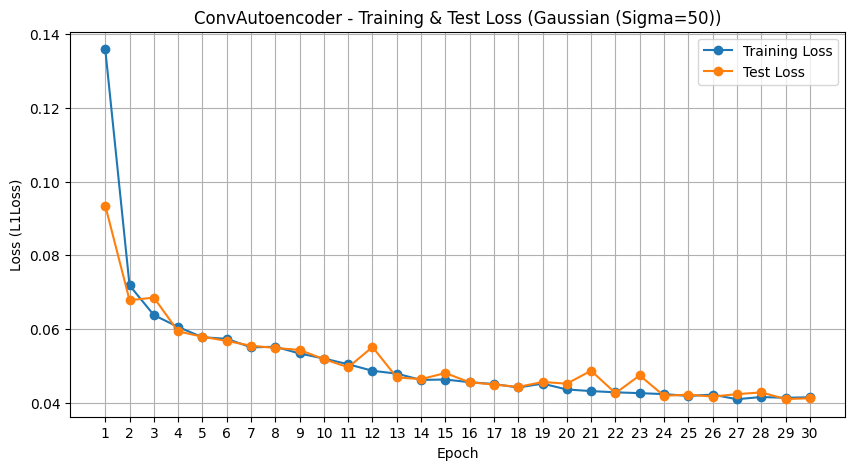


--- Visualizing Results for ConvAutoencoder on Gaussian (Sigma=50) ---

--- ConvAutoencoder - Gaussian (Sigma=50) Visualization & Sample Metrics ---
  Img 1: MSE=0.0067, RMSE=0.0820, PSNR=21.73 dB, SSIM=0.6527
  Img 2: MSE=0.0039, RMSE=0.0623, PSNR=24.11 dB, SSIM=0.6570
  Img 3: MSE=0.0035, RMSE=0.0593, PSNR=24.54 dB, SSIM=0.7029
  Img 4: MSE=0.0029, RMSE=0.0536, PSNR=25.42 dB, SSIM=0.6910
  Img 5: MSE=0.0062, RMSE=0.0789, PSNR=22.06 dB, SSIM=0.6498


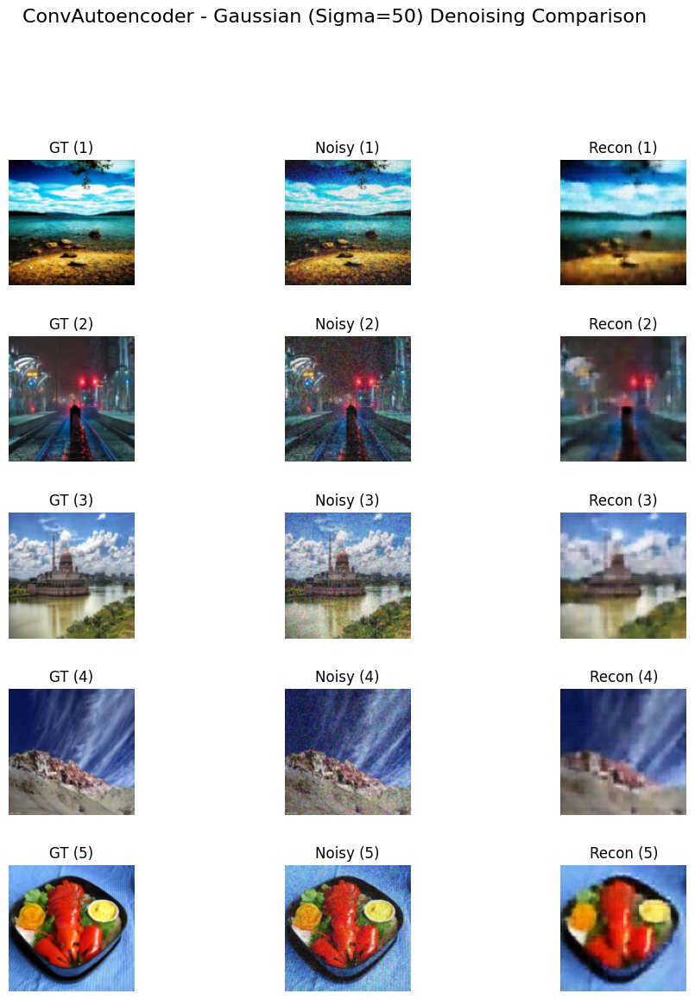


----------------------------------------
--- Task: ConvAutoencoder on Salt & Pepper (Density=0.15) ---
Using loaders: saltpepper_015_train_loader, saltpepper_015_test_loader
  Train loader: 5000 samples. Test loader: 1250 samples.
Initializing fresh ConvAutoencoder model...
Initialized ConvAutoencoder successfully.
Using Learning Rate: 0.001, Epochs: 30

=== Training ConvAutoencoder on Salt & Pepper (Density=0.15) ===

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.129099
Test Loss  (L1Loss): 0.096304
Epoch completed in 12.35s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.088536
Test Loss  (L1Loss): 0.077343
Epoch completed in 12.30s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.068499
Test Loss  (L1Loss): 0.065463
Epoch completed in 12.34s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.063546
Test Loss  (L1Loss): 0.063054
Epoch completed in 12.35s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.061542
Test Loss  (L1Loss): 0.063318
Epoch completed in 12.41s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.059981
Test Loss  (L1Loss): 0.060638
Epoch completed in 12.52s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.059273
Test Loss  (L1Loss): 0.060446
Epoch completed in 12.31s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.058351
Test Loss  (L1Loss): 0.058945
Epoch completed in 12.49s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.057291
Test Loss  (L1Loss): 0.058187
Epoch completed in 12.57s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.056476
Test Loss  (L1Loss): 0.057454
Epoch completed in 12.33s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055830
Test Loss  (L1Loss): 0.058855
Epoch completed in 12.29s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055708
Test Loss  (L1Loss): 0.057257
Epoch completed in 12.30s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055185
Test Loss  (L1Loss): 0.055844
Epoch completed in 12.34s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.054019
Test Loss  (L1Loss): 0.054425
Epoch completed in 12.35s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051494
Test Loss  (L1Loss): 0.056692
Epoch completed in 12.51s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.050540
Test Loss  (L1Loss): 0.049128
Epoch completed in 12.45s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048701
Test Loss  (L1Loss): 0.048790
Epoch completed in 12.51s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048128
Test Loss  (L1Loss): 0.048291
Epoch completed in 12.40s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047850
Test Loss  (L1Loss): 0.048506
Epoch completed in 12.47s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047362
Test Loss  (L1Loss): 0.048717
Epoch completed in 12.38s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046753
Test Loss  (L1Loss): 0.046830
Epoch completed in 12.35s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046601
Test Loss  (L1Loss): 0.048710
Epoch completed in 12.35s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046422
Test Loss  (L1Loss): 0.046435
Epoch completed in 12.31s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045717
Test Loss  (L1Loss): 0.045644
Epoch completed in 12.23s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045209
Test Loss  (L1Loss): 0.045793
Epoch completed in 12.51s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045995
Test Loss  (L1Loss): 0.044964
Epoch completed in 12.27s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045256
Test Loss  (L1Loss): 0.045273
Epoch completed in 12.43s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044493
Test Loss  (L1Loss): 0.044704
Epoch completed in 12.27s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044310
Test Loss  (L1Loss): 0.045958
Epoch completed in 12.20s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044848
Test Loss  (L1Loss): 0.044127
Epoch completed in 12.40s

Training Finished! Total Time: 6.19 min.

--- Calculating Final Test Metrics (Salt & Pepper (Density=0.15)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

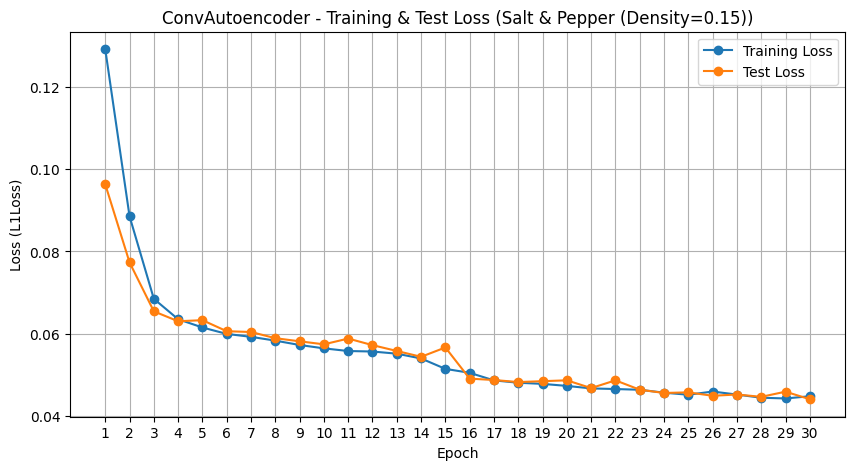


--- Visualizing Results for ConvAutoencoder on Salt & Pepper (Density=0.15) ---

--- ConvAutoencoder - Salt & Pepper (Density=0.15) Visualization & Sample Metrics ---
  Img 1: MSE=0.0076, RMSE=0.0872, PSNR=21.19 dB, SSIM=0.6261
  Img 2: MSE=0.0044, RMSE=0.0663, PSNR=23.57 dB, SSIM=0.6161
  Img 3: MSE=0.0040, RMSE=0.0629, PSNR=24.02 dB, SSIM=0.6672
  Img 4: MSE=0.0032, RMSE=0.0565, PSNR=24.96 dB, SSIM=0.6666
  Img 5: MSE=0.0072, RMSE=0.0851, PSNR=21.40 dB, SSIM=0.6221


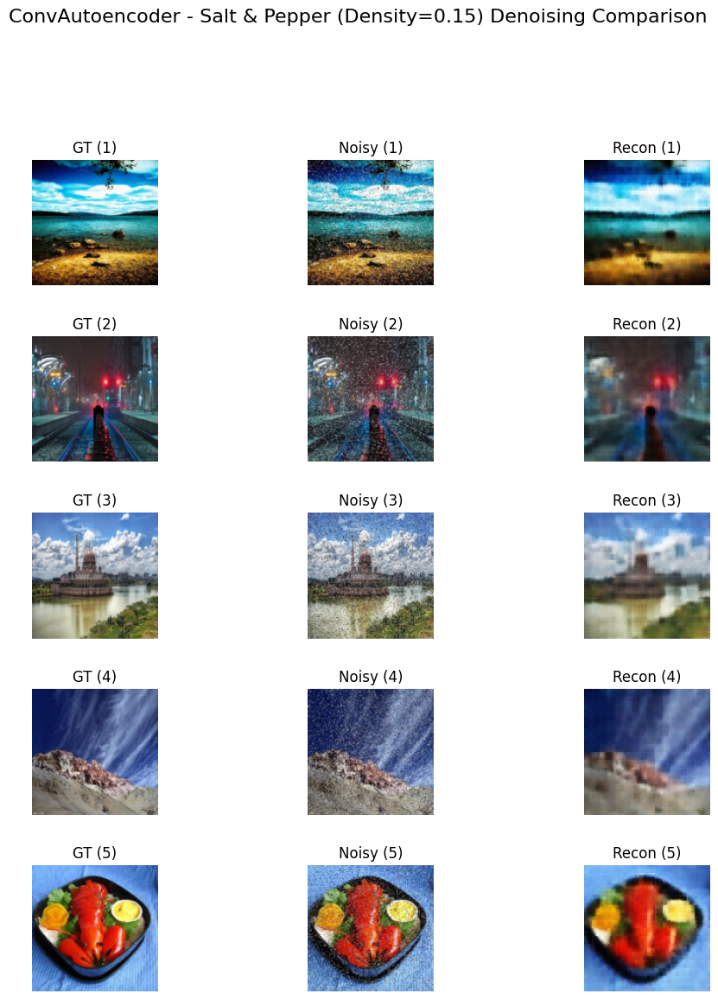


----------------------------------------
--- Task: ConvAutoencoder on Speckle (Variance=0.1) ---
Using loaders: speckle_01_train_loader, speckle_01_test_loader
  Train loader: 5000 samples. Test loader: 1250 samples.
Initializing fresh ConvAutoencoder model...
Initialized ConvAutoencoder successfully.
Using Learning Rate: 0.001, Epochs: 30

=== Training ConvAutoencoder on Speckle (Variance=0.1) ===

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.133606
Test Loss  (L1Loss): 0.093575
Epoch completed in 12.28s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.075832
Test Loss  (L1Loss): 0.077569
Epoch completed in 12.38s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.065585
Test Loss  (L1Loss): 0.065079
Epoch completed in 12.29s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.061531
Test Loss  (L1Loss): 0.068863
Epoch completed in 12.52s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.059615
Test Loss  (L1Loss): 0.057622
Epoch completed in 12.49s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.054782
Test Loss  (L1Loss): 0.052701
Epoch completed in 12.25s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051610
Test Loss  (L1Loss): 0.051779
Epoch completed in 12.45s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.050387
Test Loss  (L1Loss): 0.049658
Epoch completed in 12.27s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048915
Test Loss  (L1Loss): 0.048983
Epoch completed in 12.33s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048395
Test Loss  (L1Loss): 0.047562
Epoch completed in 12.49s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047996
Test Loss  (L1Loss): 0.050923
Epoch completed in 12.26s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046946
Test Loss  (L1Loss): 0.046969
Epoch completed in 12.39s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045908
Test Loss  (L1Loss): 0.045415
Epoch completed in 12.32s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045346
Test Loss  (L1Loss): 0.045083
Epoch completed in 12.53s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045795
Test Loss  (L1Loss): 0.044593
Epoch completed in 12.39s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044502
Test Loss  (L1Loss): 0.048702
Epoch completed in 12.33s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044308
Test Loss  (L1Loss): 0.044441
Epoch completed in 12.39s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043665
Test Loss  (L1Loss): 0.043820
Epoch completed in 12.49s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043851
Test Loss  (L1Loss): 0.044395
Epoch completed in 12.51s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043002
Test Loss  (L1Loss): 0.043711
Epoch completed in 12.30s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043565
Test Loss  (L1Loss): 0.042836
Epoch completed in 12.41s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.042510
Test Loss  (L1Loss): 0.045350
Epoch completed in 12.28s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.042520
Test Loss  (L1Loss): 0.043271
Epoch completed in 12.35s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041756
Test Loss  (L1Loss): 0.041728
Epoch completed in 12.35s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041802
Test Loss  (L1Loss): 0.042396
Epoch completed in 12.32s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041510
Test Loss  (L1Loss): 0.044779
Epoch completed in 12.29s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.042030
Test Loss  (L1Loss): 0.046633
Epoch completed in 12.28s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041040
Test Loss  (L1Loss): 0.041460
Epoch completed in 12.25s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.040690
Test Loss  (L1Loss): 0.042348
Epoch completed in 12.35s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.040663
Test Loss  (L1Loss): 0.043625
Epoch completed in 12.37s

Training Finished! Total Time: 6.18 min.

--- Calculating Final Test Metrics (Speckle (Variance=0.1)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

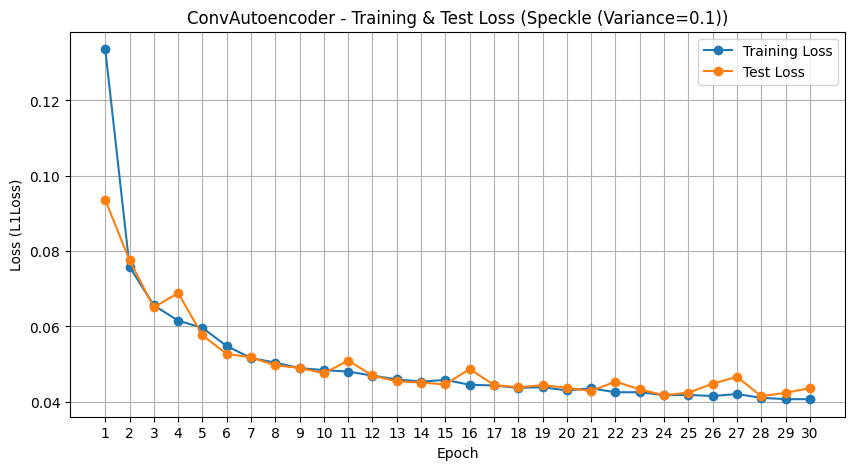


--- Visualizing Results for ConvAutoencoder on Speckle (Variance=0.1) ---

--- ConvAutoencoder - Speckle (Variance=0.1) Visualization & Sample Metrics ---
  Img 1: MSE=0.0069, RMSE=0.0833, PSNR=21.59 dB, SSIM=0.6597
  Img 2: MSE=0.0038, RMSE=0.0615, PSNR=24.23 dB, SSIM=0.6813
  Img 3: MSE=0.0040, RMSE=0.0631, PSNR=24.01 dB, SSIM=0.6991
  Img 4: MSE=0.0029, RMSE=0.0542, PSNR=25.33 dB, SSIM=0.7219
  Img 5: MSE=0.0061, RMSE=0.0784, PSNR=22.12 dB, SSIM=0.6646


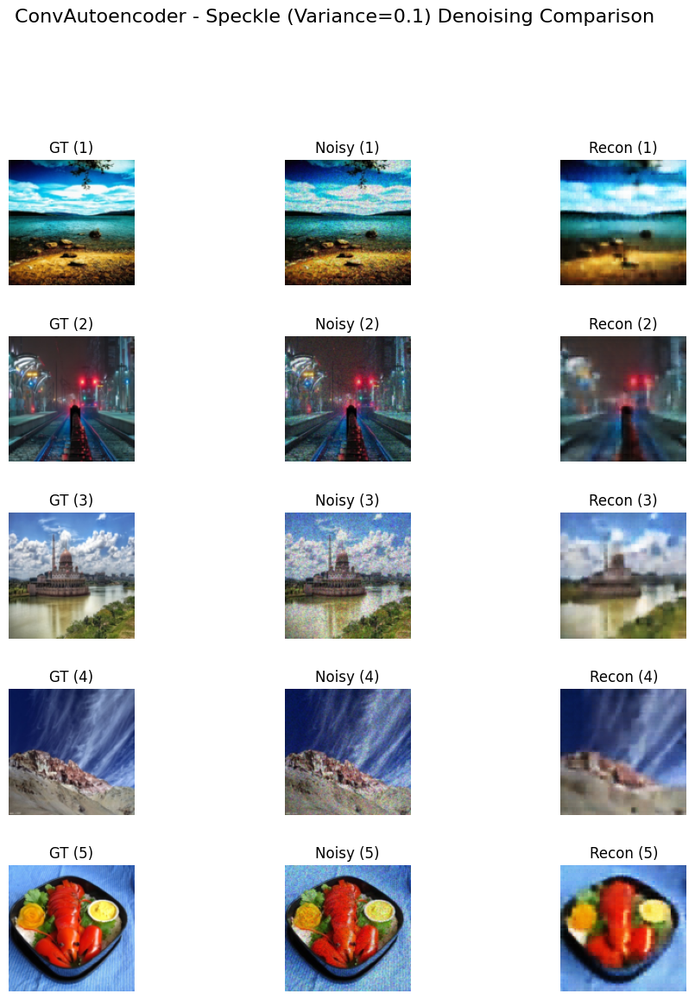


===== Finished All High Noise Types for Model: ConvAutoencoder =====

===== Testing Model: UNet =====

----------------------------------------
--- Task: UNet on Gaussian (Sigma=50) ---
Using loaders: gaussian_50_train_loader, gaussian_50_test_loader
  Train loader: 5000 samples. Test loader: 1250 samples.
Initializing fresh UNet model...
Initialized UNet successfully.
Using Learning Rate: 0.0001, Epochs: 30

=== Training UNet on Gaussian (Sigma=50) ===

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.079768
Test Loss  (L1Loss): 0.045881
Epoch completed in 15.97s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045131
Test Loss  (L1Loss): 0.046612
Epoch completed in 15.91s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.038289
Test Loss  (L1Loss): 0.033392
Epoch completed in 15.93s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.033765
Test Loss  (L1Loss): 0.030436
Epoch completed in 15.95s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.030243
Test Loss  (L1Loss): 0.026381
Epoch completed in 15.88s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.030206
Test Loss  (L1Loss): 0.026174
Epoch completed in 15.94s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028474
Test Loss  (L1Loss): 0.024347
Epoch completed in 15.93s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028013
Test Loss  (L1Loss): 0.028040
Epoch completed in 15.92s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027382
Test Loss  (L1Loss): 0.024596
Epoch completed in 15.94s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026526
Test Loss  (L1Loss): 0.024400
Epoch completed in 15.91s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026266
Test Loss  (L1Loss): 0.023455
Epoch completed in 15.90s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025568
Test Loss  (L1Loss): 0.023974
Epoch completed in 15.98s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025649
Test Loss  (L1Loss): 0.023501
Epoch completed in 15.95s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025365
Test Loss  (L1Loss): 0.022647
Epoch completed in 15.86s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025314
Test Loss  (L1Loss): 0.023361
Epoch completed in 16.00s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.024693
Test Loss  (L1Loss): 0.022646
Epoch completed in 15.93s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.024518
Test Loss  (L1Loss): 0.022127
Epoch completed in 15.92s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.024279
Test Loss  (L1Loss): 0.022608
Epoch completed in 15.90s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023908
Test Loss  (L1Loss): 0.022265
Epoch completed in 15.91s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023559
Test Loss  (L1Loss): 0.021965
Epoch completed in 15.90s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023405
Test Loss  (L1Loss): 0.022230
Epoch completed in 15.88s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023237
Test Loss  (L1Loss): 0.022053
Epoch completed in 15.94s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023399
Test Loss  (L1Loss): 0.021755
Epoch completed in 15.93s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023041
Test Loss  (L1Loss): 0.021963
Epoch completed in 15.92s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023382
Test Loss  (L1Loss): 0.021500
Epoch completed in 15.91s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023152
Test Loss  (L1Loss): 0.023187
Epoch completed in 15.88s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022820
Test Loss  (L1Loss): 0.021569
Epoch completed in 15.92s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022589
Test Loss  (L1Loss): 0.022581
Epoch completed in 15.89s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.023217
Test Loss  (L1Loss): 0.021358
Epoch completed in 15.88s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022707
Test Loss  (L1Loss): 0.021885
Epoch completed in 15.94s

Training Finished! Total Time: 7.96 min.

--- Calculating Final Test Metrics (Gaussian (Sigma=50)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

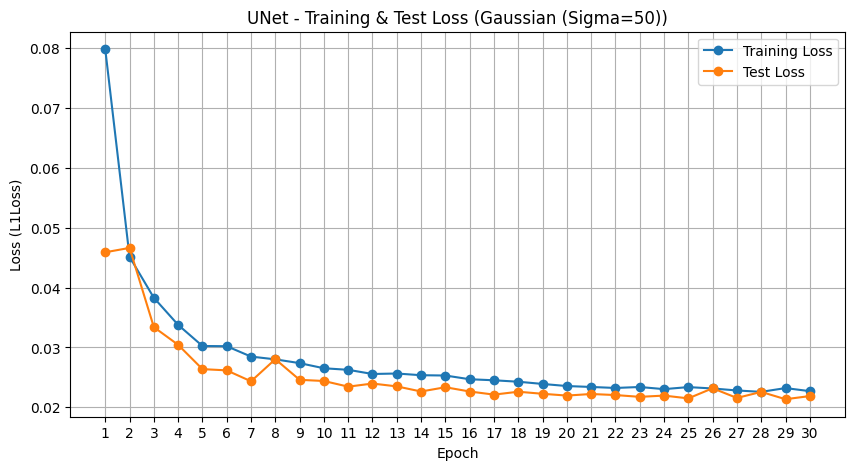


--- Visualizing Results for UNet on Gaussian (Sigma=50) ---

--- UNet - Gaussian (Sigma=50) Visualization & Sample Metrics ---
  Img 1: MSE=0.0015, RMSE=0.0383, PSNR=28.33 dB, SSIM=0.8917
  Img 2: MSE=0.0010, RMSE=0.0318, PSNR=29.96 dB, SSIM=0.8755
  Img 3: MSE=0.0010, RMSE=0.0311, PSNR=30.14 dB, SSIM=0.9115
  Img 4: MSE=0.0008, RMSE=0.0288, PSNR=30.81 dB, SSIM=0.8717
  Img 5: MSE=0.0013, RMSE=0.0367, PSNR=28.70 dB, SSIM=0.8518


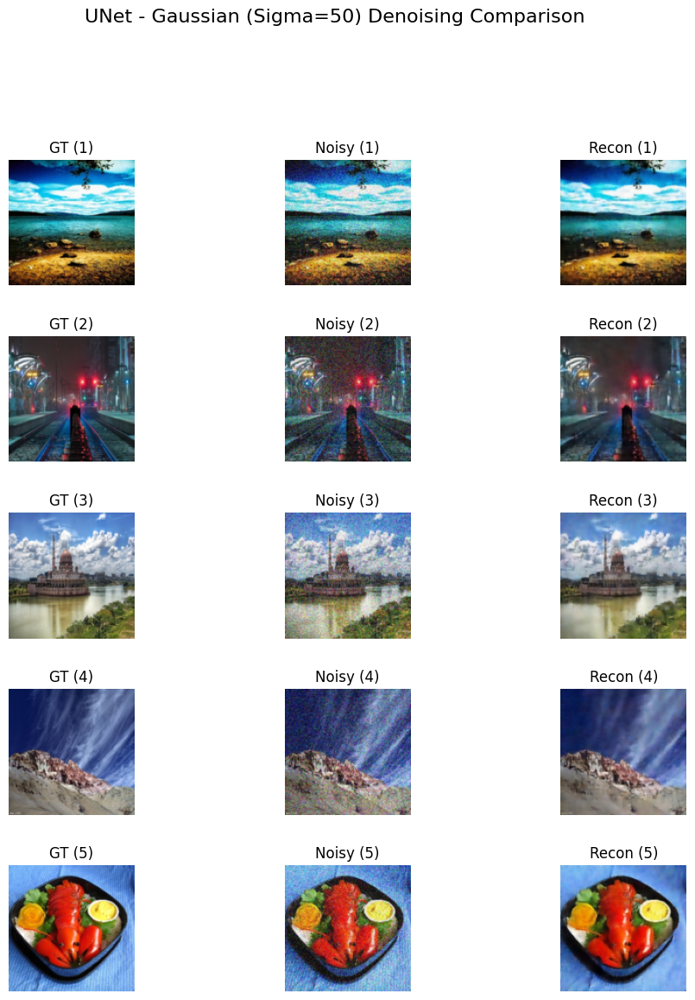


----------------------------------------
--- Task: UNet on Salt & Pepper (Density=0.15) ---
Using loaders: saltpepper_015_train_loader, saltpepper_015_test_loader
  Train loader: 5000 samples. Test loader: 1250 samples.
Initializing fresh UNet model...
Initialized UNet successfully.
Using Learning Rate: 0.0001, Epochs: 30

=== Training UNet on Salt & Pepper (Density=0.15) ===

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.070509
Test Loss  (L1Loss): 0.045926
Epoch completed in 15.94s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044420
Test Loss  (L1Loss): 0.033870
Epoch completed in 15.79s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.039458
Test Loss  (L1Loss): 0.032468
Epoch completed in 15.87s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.037871
Test Loss  (L1Loss): 0.032673
Epoch completed in 15.87s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.036738
Test Loss  (L1Loss): 0.030083
Epoch completed in 15.82s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.036087
Test Loss  (L1Loss): 0.029466
Epoch completed in 15.83s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.034253
Test Loss  (L1Loss): 0.030313
Epoch completed in 15.86s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.033821
Test Loss  (L1Loss): 0.027740
Epoch completed in 15.90s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.032216
Test Loss  (L1Loss): 0.028986
Epoch completed in 15.91s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.032466
Test Loss  (L1Loss): 0.027846
Epoch completed in 15.89s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.031762
Test Loss  (L1Loss): 0.030367
Epoch completed in 15.84s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.030916
Test Loss  (L1Loss): 0.026625
Epoch completed in 15.92s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.030532
Test Loss  (L1Loss): 0.028301
Epoch completed in 15.90s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.029641
Test Loss  (L1Loss): 0.026855
Epoch completed in 15.84s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.029316
Test Loss  (L1Loss): 0.025929
Epoch completed in 15.96s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028203
Test Loss  (L1Loss): 0.025999
Epoch completed in 15.89s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028081
Test Loss  (L1Loss): 0.027353
Epoch completed in 15.85s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028526
Test Loss  (L1Loss): 0.025451
Epoch completed in 15.88s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027748
Test Loss  (L1Loss): 0.025788
Epoch completed in 15.85s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027688
Test Loss  (L1Loss): 0.026929
Epoch completed in 15.93s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027641
Test Loss  (L1Loss): 0.024845
Epoch completed in 15.90s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027763
Test Loss  (L1Loss): 0.025563
Epoch completed in 15.83s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028163
Test Loss  (L1Loss): 0.026084
Epoch completed in 15.92s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026742
Test Loss  (L1Loss): 0.025534
Epoch completed in 15.84s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027115
Test Loss  (L1Loss): 0.025851
Epoch completed in 15.89s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027027
Test Loss  (L1Loss): 0.025586
Epoch completed in 15.92s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026760
Test Loss  (L1Loss): 0.024448
Epoch completed in 15.90s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025890
Test Loss  (L1Loss): 0.024912
Epoch completed in 15.87s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026204
Test Loss  (L1Loss): 0.024672
Epoch completed in 15.85s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026116
Test Loss  (L1Loss): 0.026144
Epoch completed in 15.81s

Training Finished! Total Time: 7.94 min.

--- Calculating Final Test Metrics (Salt & Pepper (Density=0.15)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

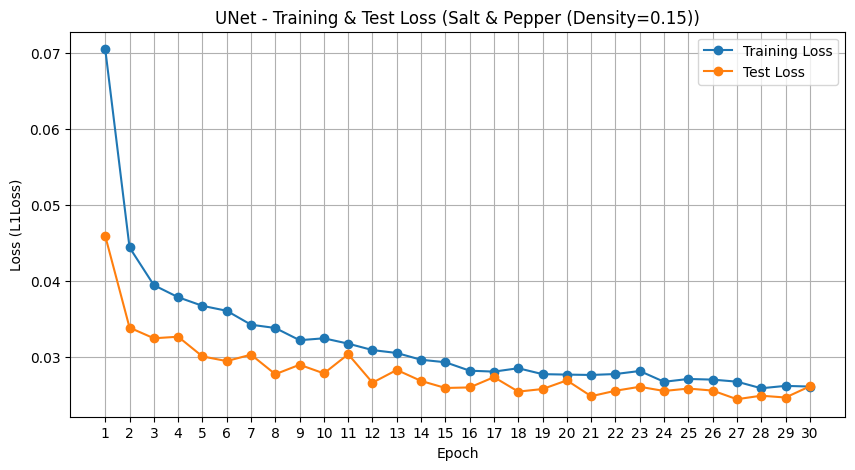


--- Visualizing Results for UNet on Salt & Pepper (Density=0.15) ---

--- UNet - Salt & Pepper (Density=0.15) Visualization & Sample Metrics ---
  Img 1: MSE=0.0020, RMSE=0.0450, PSNR=26.93 dB, SSIM=0.8546
  Img 2: MSE=0.0014, RMSE=0.0375, PSNR=28.51 dB, SSIM=0.8362
  Img 3: MSE=0.0018, RMSE=0.0420, PSNR=27.54 dB, SSIM=0.8601
  Img 4: MSE=0.0015, RMSE=0.0381, PSNR=28.37 dB, SSIM=0.7993
  Img 5: MSE=0.0017, RMSE=0.0415, PSNR=27.64 dB, SSIM=0.8193


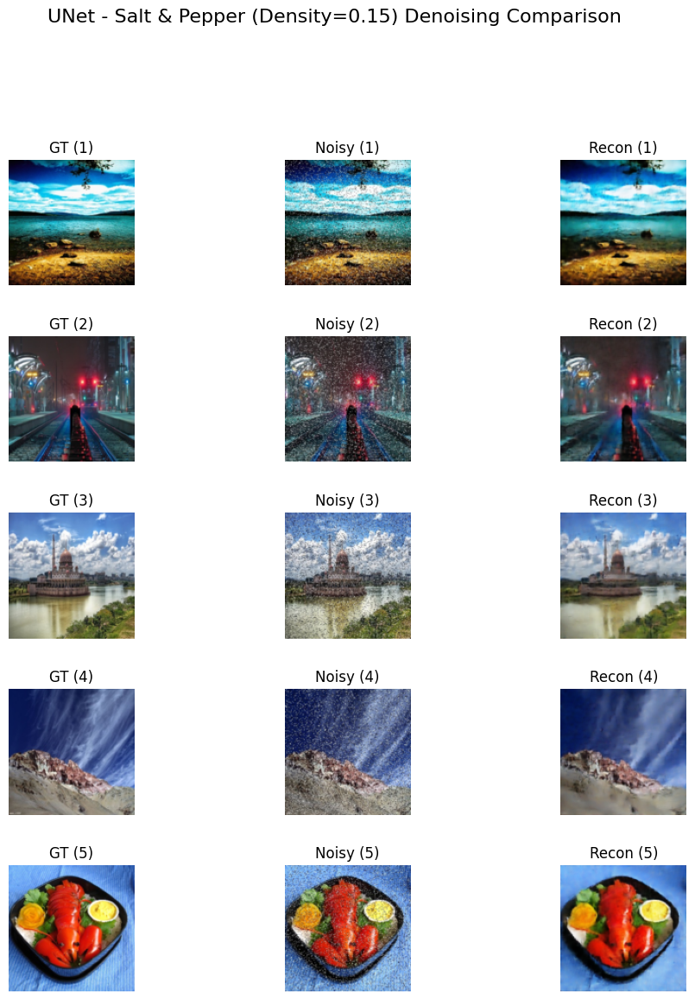


----------------------------------------
--- Task: UNet on Speckle (Variance=0.1) ---
Using loaders: speckle_01_train_loader, speckle_01_test_loader
  Train loader: 5000 samples. Test loader: 1250 samples.
Initializing fresh UNet model...
Initialized UNet successfully.
Using Learning Rate: 0.0001, Epochs: 30

=== Training UNet on Speckle (Variance=0.1) ===

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.068944
Test Loss  (L1Loss): 0.044361
Epoch completed in 15.91s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.040569
Test Loss  (L1Loss): 0.033215
Epoch completed in 15.97s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.033672
Test Loss  (L1Loss): 0.023824
Epoch completed in 15.91s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.031748
Test Loss  (L1Loss): 0.023069
Epoch completed in 15.95s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028046
Test Loss  (L1Loss): 0.023204
Epoch completed in 15.94s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026928
Test Loss  (L1Loss): 0.021658
Epoch completed in 15.98s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027179
Test Loss  (L1Loss): 0.025074
Epoch completed in 15.93s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025235
Test Loss  (L1Loss): 0.021000
Epoch completed in 15.92s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.024131
Test Loss  (L1Loss): 0.024818
Epoch completed in 15.85s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.024396
Test Loss  (L1Loss): 0.020056
Epoch completed in 15.94s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022820
Test Loss  (L1Loss): 0.019435
Epoch completed in 15.99s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022475
Test Loss  (L1Loss): 0.019647
Epoch completed in 16.00s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022052
Test Loss  (L1Loss): 0.022033
Epoch completed in 15.87s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022421
Test Loss  (L1Loss): 0.020024
Epoch completed in 15.88s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.021269
Test Loss  (L1Loss): 0.018489
Epoch completed in 15.90s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.022958
Test Loss  (L1Loss): 0.020562
Epoch completed in 15.87s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.021372
Test Loss  (L1Loss): 0.019012
Epoch completed in 15.96s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.021194
Test Loss  (L1Loss): 0.020351
Epoch completed in 15.93s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.020957
Test Loss  (L1Loss): 0.019101
Epoch completed in 16.00s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.020450
Test Loss  (L1Loss): 0.020640
Epoch completed in 15.96s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.020451
Test Loss  (L1Loss): 0.018898
Epoch completed in 15.87s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.019714
Test Loss  (L1Loss): 0.018666
Epoch completed in 15.92s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.020465
Test Loss  (L1Loss): 0.019008
Epoch completed in 15.88s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.019711
Test Loss  (L1Loss): 0.017946
Epoch completed in 15.97s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.019718
Test Loss  (L1Loss): 0.018148
Epoch completed in 15.91s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.019419
Test Loss  (L1Loss): 0.018368
Epoch completed in 16.00s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.019551
Test Loss  (L1Loss): 0.018855
Epoch completed in 15.89s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.019335
Test Loss  (L1Loss): 0.017652
Epoch completed in 15.87s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.020029
Test Loss  (L1Loss): 0.019533
Epoch completed in 15.92s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.019773
Test Loss  (L1Loss): 0.022580
Epoch completed in 15.90s

Training Finished! Total Time: 7.96 min.

--- Calculating Final Test Metrics (Speckle (Variance=0.1)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

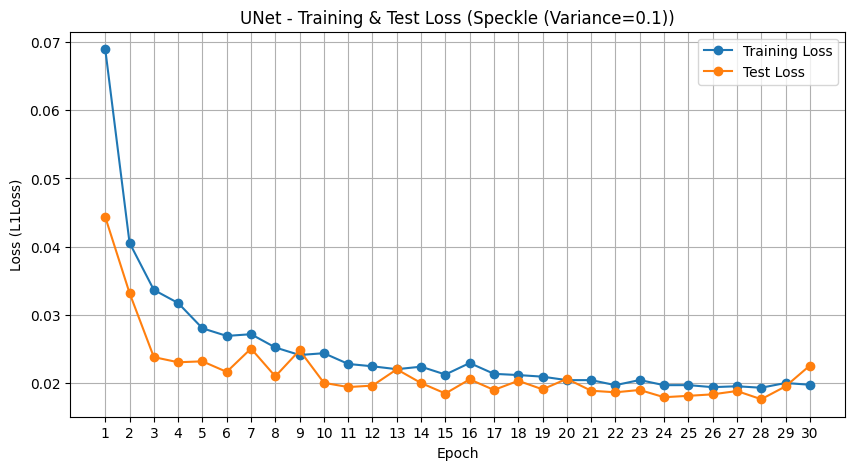


--- Visualizing Results for UNet on Speckle (Variance=0.1) ---

--- UNet - Speckle (Variance=0.1) Visualization & Sample Metrics ---
  Img 1: MSE=0.0018, RMSE=0.0424, PSNR=27.45 dB, SSIM=0.9171
  Img 2: MSE=0.0006, RMSE=0.0243, PSNR=32.28 dB, SSIM=0.9397
  Img 3: MSE=0.0014, RMSE=0.0369, PSNR=28.65 dB, SSIM=0.9156
  Img 4: MSE=0.0008, RMSE=0.0277, PSNR=31.14 dB, SSIM=0.9102
  Img 5: MSE=0.0015, RMSE=0.0388, PSNR=28.23 dB, SSIM=0.8805


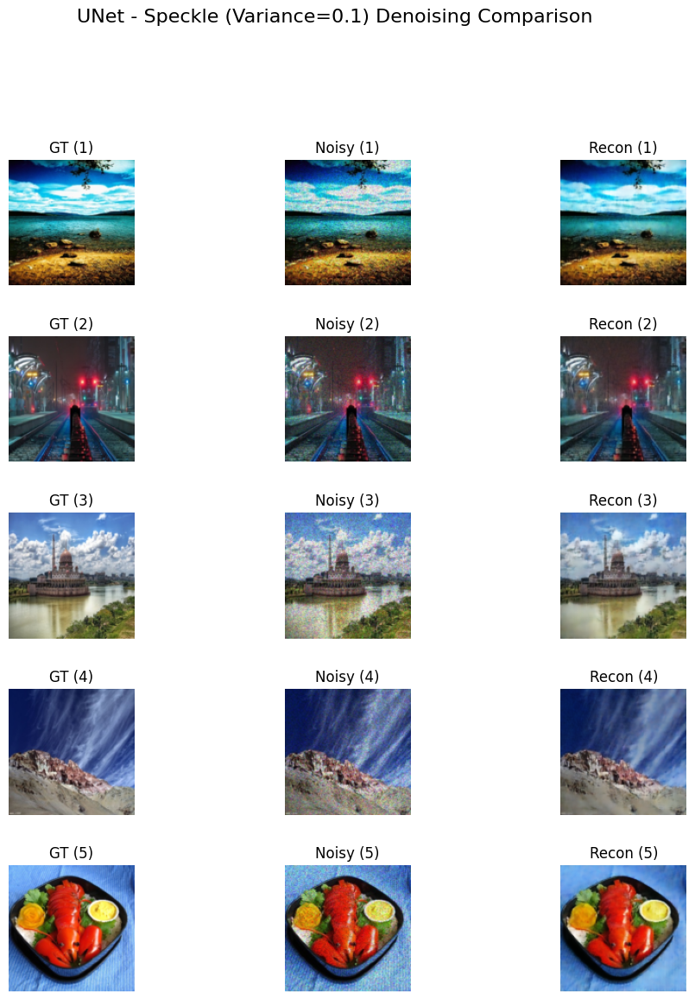


===== Finished All High Noise Types for Model: UNet =====

===== EXPERIMENT SUMMARY (HIGH NOISE) =====
          Model                   Noise Type     MSE   RMSE  PSNR   SSIM
ConvAutoencoder          Gaussian (Sigma=50) 0.00439 0.0662 24.48 0.7213
ConvAutoencoder Salt & Pepper (Density=0.15) 0.00516 0.0718 23.78 0.6870
ConvAutoencoder       Speckle (Variance=0.1) 0.00479 0.0692 24.04 0.7291
           UNet          Gaussian (Sigma=50) 0.00087 0.0295 30.94 0.8955
           UNet Salt & Pepper (Density=0.15) 0.00138 0.0372 29.00 0.8715
           UNet       Speckle (Variance=0.1) 0.00103 0.0321 30.47 0.9261

===== End of All Experiments =====


In [ ]:
# === CELL 5: Main Experiment Orchestration (High Noise: G50, S&P 0.15, Sp 0.1) ===

import torch
import pandas as pd
import gc # Garbage collector for potentially clearing memory
import matplotlib.pyplot as plt
import time # Ensure time is available
import json # For printing results if pandas fails

# --- 1. Experiment Parameters ---



NOISY_DATA_BASE_PATH = '/content/denoising_dataset_noisy_subset_single_g50' # HIGH NOISE PATH



# === Noise configurations to run (HIGH levels) ===
noise_configs_to_run = {
    'gaussian': {'level': 50, 'label': 'Gaussian (Sigma=50)'},
    'saltpepper': {'level': 0.15, 'label': 'Salt & Pepper (Density=0.15)'},
    'speckle': {'level': 0.1, 'label': 'Speckle (Variance=0.1)'}
}
print(f"Target noisy dataset path: {NOISY_DATA_BASE_PATH}")
print(f"Noise configurations to run: {noise_configs_to_run}")


# === Models to run ===
# Add/remove models as needed
models_to_run = {
    "ConvAutoencoder": ConvAutoencoder,
    "UNet": UNet,
    # "GAN_Pix2Pix": (UNet, PatchGANDiscriminator) # Keep GAN commented out - requires separate train func
}
print(f"Models to run: {list(models_to_run.keys())}")


# --- Common training parameters ---
COMMON_NUM_EPOCHS = 30 # Number of epochs for each training run
COMMON_LEARNING_RATE = 1e-3 # Base LR
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device for training: {device}")


# --- Dictionary to store results ---
results = {}

# --- 2. Run Experiment Loop ---

print(f"\n{'='*60}\n===== STARTING EXPERIMENTS (HIGH NOISE) =====\n{'='*60}")

for model_name, model_info in models_to_run.items(): # Use model_info
    print(f"\n{'='*50}\n===== Testing Model: {model_name} =====\n{'='*50}")
    results[model_name] = {} # Initialize results for this model

    # --- Loop through noise types ---
    for noise_type, config in noise_configs_to_run.items():
        noise_level = config['level']
        noise_label = config['label']
        print(f"\n{'-'*40}\n--- Task: {model_name} on {noise_label} ---")

        # 1. Select the correct DataLoaders for this high noise type
        train_loader, test_loader = None, None
        level_str = str(noise_level).replace('.', '')
        loader_suffix = f"{noise_type}_{level_str}" # e.g., gaussian_50, saltpepper_015, speckle_01

        # Construct expected variable names
        train_loader_var_name = f"{loader_suffix}_train_loader" # e.g., sp_015_train_loader
        test_loader_var_name = f"{loader_suffix}_test_loader"   # e.g., sp_015_test_loader

        try: # Check if the required loader variables exist from Cell 3
            train_loader = globals()[train_loader_var_name]
            test_loader = globals()[test_loader_var_name]
            if train_loader is None or test_loader is None:
                 raise ValueError(f"Loaders '{train_loader_var_name}/{test_loader_var_name}' are None.")
            print(f"Using loaders: {train_loader_var_name}, {test_loader_var_name}")
            print(f"  Train loader: {len(train_loader.dataset)} samples. Test loader: {len(test_loader.dataset)} samples.")
        except KeyError:
             print(f"ERROR: DataLoader variables '{train_loader_var_name}' or '{test_loader_var_name}' not found.")
             print(f"--> Ensure Cell 3 created these loaders for the high noise dataset. Skipping this task.")
             results[model_name][noise_label] = {"Status": "DataLoader Missing"}
             continue # Skip to the next noise type
        except ValueError as e:
            print(f"ERROR: {e}. Skipping this task.")
            results[model_name][noise_label] = {"Status": "DataLoader None"}
            continue # Skip to the next noise type
        except Exception as e:
             print(f"An unexpected error occurred selecting DataLoaders: {e}. Skipping task.")
             results[model_name][noise_label] = {"Status": "DataLoader Selection Error"}
             continue # Skip to the next noise type


        # 2. Initialize a FRESH model instance for this specific task
        print(f"Initializing fresh {model_name} model...")
        model_instance = None
        try: # Wrap instantiation in try-except
            if model_name == "UNet": model_instance = model_info(n_channels=3, n_classes=3).to(device)
            elif model_name == "ConvAutoencoder": model_instance = model_info(input_channels=3).to(device)
            # Add elif for other models here if their __init__ differs
            else: print(f"WARNING: Default instantiation for {model_name}. Verify __init__ args."); model_instance = model_info().to(device) # Basic fallback
            print(f"Initialized {model_name} successfully.")
        except Exception as e: print(f"ERROR initializing {model_name}: {e}. Skipping task."); results[model_name][noise_label] = {"Status": "Model Init Error"}; continue


        # 3. Train and Evaluate
        trained_model = None
        avg_metrics = None
        # Use standard training function for AE/UNet
        lr = 1e-4 if model_name == "UNet" else COMMON_LEARNING_RATE # Example LR adjustment
        print(f"Using Learning Rate: {lr}, Epochs: {COMMON_NUM_EPOCHS}")
        try: # Wrap training call
             trained_model, _, _, avg_metrics = train_and_evaluate_model(
                 model=model_instance, model_name=model_name, noise_type_str=noise_label,
                 train_loader=train_loader, test_loader=test_loader, device=device,
                 num_epochs=COMMON_NUM_EPOCHS, learning_rate=lr
             )
        except NameError: print("ERROR: train_and_evaluate_model func not defined!"); raise # Stop if critical func missing
        except Exception as e: print(f"ERROR during training/evaluation: {e}"); trained_model = None; avg_metrics = {"Status": f"Runtime Error: {e}"}


        # 4. Store results
        if avg_metrics: results[model_name][noise_label] = avg_metrics
        elif "Status" not in results[model_name].get(noise_label, {}): results[model_name][noise_label] = {"Status": "Metrics Error"}

        # 5. Visualize Results
        if trained_model and 'visualize_denoising' in locals() and test_loader:
             print(f"\n--- Visualizing Results for {model_name} on {noise_label} ---")
             try: visualize_denoising(trained_model, test_loader, device, num_images=5, title_prefix=f"{model_name} - {noise_label}")
             except NameError: print("ERROR: visualize_denoising func not defined.")
             except Exception as e: print(f"An error during visualization: {e}")
        elif not trained_model: print("Skipping visualization due to training error.")
        else: print("Skipping visualization.")

        # 6. Clean up memory
        del model_instance, trained_model, train_loader, test_loader
        gc.collect();
        if torch.cuda.is_available(): torch.cuda.empty_cache()
        # --- End of noise type loop ---

    print(f"\n{'='*50}\n===== Finished All High Noise Types for Model: {model_name} =====\n{'='*50}")
    # --- End of model loop ---


print(f"\n{'='*60}\n===== EXPERIMENT SUMMARY (HIGH NOISE) =====\n{'='*60}")

# --- Print Results Table ---

try:
    df_results = []; sorted_models = sorted(results.keys()); sorted_noise_labels = sorted(noise_configs_to_run[key]['label'] for key in noise_configs_to_run)
    for model_name in sorted_models:
        for noise_label in sorted_noise_labels:
            metrics = results.get(model_name, {}).get(noise_label, {"Status": "Not Run"})
            if isinstance(metrics, dict) and "Status" not in metrics: row = {'Model': model_name, 'Noise Type': noise_label, **metrics}; df_results.append(row)
            else: status = metrics.get('Status', 'Unknown Error') if isinstance(metrics, dict) else 'Unknown Error'; row = {'Model': model_name, 'Noise Type': noise_label, 'MSE': status, 'RMSE': status, 'PSNR': status, 'SSIM': status}; df_results.append(row)
    if df_results:
         results_df = pd.DataFrame(df_results); float_format_map = {"MSE": "{:.5f}", "RMSE": "{:.4f}", "PSNR": "{:.2f}", "SSIM": "{:.4f}"}
         for col, fmt in float_format_map.items():
             if col in results_df.columns: results_df[col] = results_df[col].apply(lambda x: fmt.format(x) if isinstance(x, (int, float)) and pd.notna(x) else x)
         print(results_df.to_string(index=False))
    else: print("No results were successfully collected.")
except ImportError: print("Pandas not found. Raw results:\n", json.dumps(results, indent=2))
except Exception as e: print(f"Error formatting table: {e}\nRaw results:\n", json.dumps(results, indent=2))

print(f"\n{'='*60}\n===== End of All Experiments =====\n{'='*60}")

PyTorch Version: 2.6.0+cu124
Using device: cuda
Defined: train_gan_denoiser

Selected loaders for gaussian (Level=50)

Instantiating GAN Models (G=UNet, D=PatchGAN)...
Applied weight initialization.

Starting GAN Training...

=== Training GAN (Pix2Pix Style) on gaussian (Level=50) ===
Epochs: 10, G LR: 0.0001, D LR: 0.0001, Lambda L1: 100.0

--- Epoch 1/10 ---


E1 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 17.315563 (GAN: 0.963010, L1: 0.163526)
Train D Loss: 0.310308
Test L1 Loss : 0.121272
Epoch completed in 22.66 seconds

--- Epoch 2/10 ---


E2 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 11.040545 (GAN: 0.943793, L1: 0.100968)
Train D Loss: 0.074113
Test L1 Loss : 0.069343
Epoch completed in 22.63 seconds

--- Epoch 3/10 ---


E3 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 7.462725 (GAN: 0.868552, L1: 0.065942)
Train D Loss: 0.094204
Test L1 Loss : 0.052143
Epoch completed in 22.58 seconds

--- Epoch 4/10 ---


E4 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 5.453167 (GAN: 0.731011, L1: 0.047222)
Train D Loss: 0.142096
Test L1 Loss : 0.043366
Epoch completed in 22.56 seconds

--- Epoch 5/10 ---


E5 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.574361 (GAN: 0.578001, L1: 0.039964)
Train D Loss: 0.189778
Test L1 Loss : 0.034060
Epoch completed in 22.59 seconds

--- Epoch 6/10 ---


E6 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.076425 (GAN: 0.533907, L1: 0.035425)
Train D Loss: 0.203938
Test L1 Loss : 0.028133
Epoch completed in 22.64 seconds

--- Epoch 7/10 ---


E7 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.066250 (GAN: 0.517388, L1: 0.035489)
Train D Loss: 0.217437
Test L1 Loss : 0.035368
Epoch completed in 22.56 seconds

--- Epoch 8/10 ---


E8 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.991769 (GAN: 0.598402, L1: 0.033934)
Train D Loss: 0.172935
Test L1 Loss : 0.029704
Epoch completed in 22.62 seconds

--- Epoch 9/10 ---


E9 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.886700 (GAN: 0.657264, L1: 0.032294)
Train D Loss: 0.167004
Test L1 Loss : 0.032228
Epoch completed in 22.62 seconds

--- Epoch 10/10 ---


E10 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.804048 (GAN: 0.659921, L1: 0.031441)
Train D Loss: 0.163371
Test L1 Loss : 0.043295
Epoch completed in 22.62 seconds

GAN Training Finished! Total Time: 3.77 min.

--- Calculating Final Metrics on Test Set (gaussian (Level=50)) ---


GAN Final Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

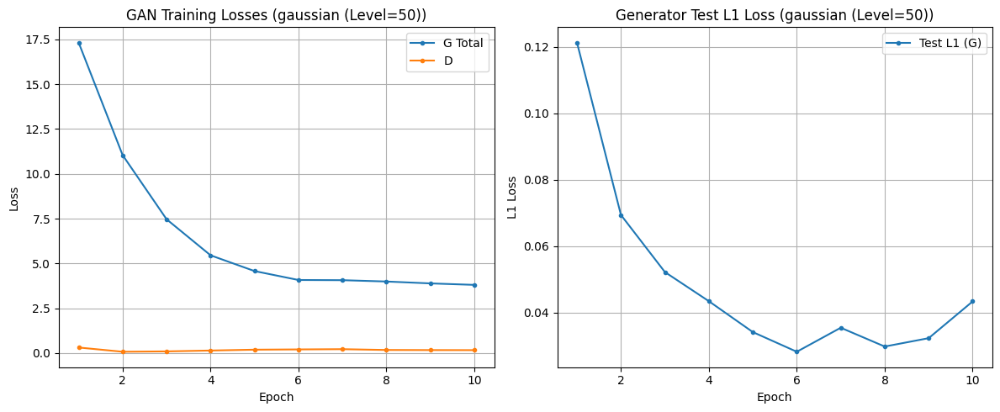


--- Final Test Set Metrics for GAN on gaussian (Level=50) ---
  Average MSE: 0.0031
  Average RMSE: 0.0556
  Average PSNR: 25.4305 dB
  Average SSIM: 0.8173
--------------------------------------------------

--- Visualizing GAN Results on gaussian (Level=50) ---

--- GAN_Pix2Pix - gaussian (Level=50) Visualization & Sample Metrics ---
  Img 1: MSE=0.0031, RMSE=0.0557, PSNR=25.08 dB, SSIM=0.6072
  Img 2: MSE=0.0035, RMSE=0.0593, PSNR=24.54 dB, SSIM=0.7730
  Img 3: MSE=0.0033, RMSE=0.0570, PSNR=24.88 dB, SSIM=0.8675
  Img 4: MSE=0.0019, RMSE=0.0435, PSNR=27.23 dB, SSIM=0.8676
  Img 5: MSE=0.0023, RMSE=0.0475, PSNR=26.47 dB, SSIM=0.8215


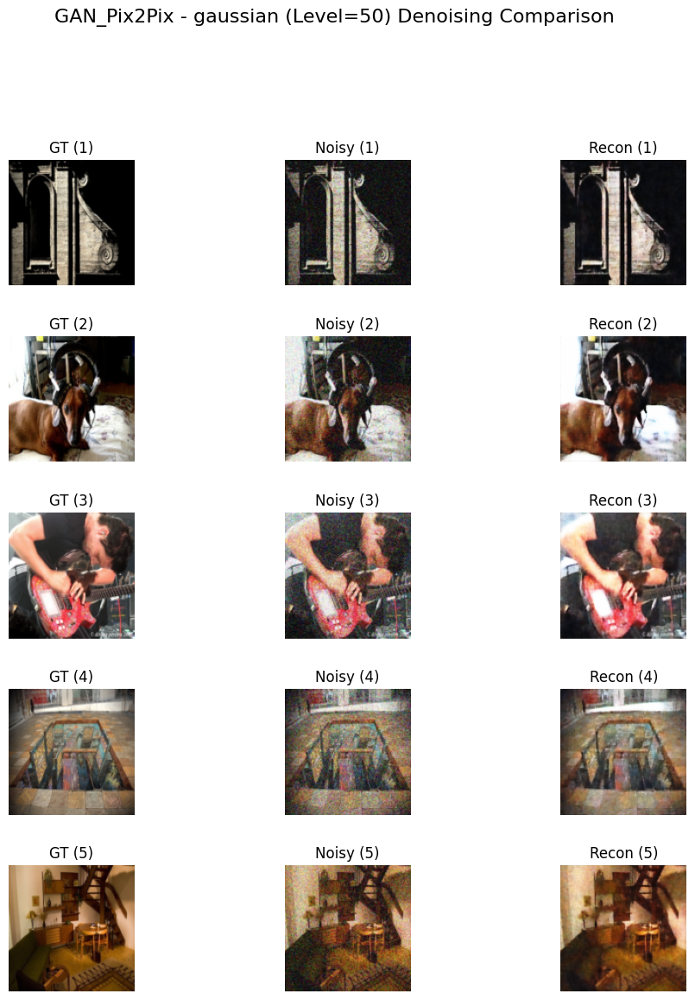


--- GAN Training and Evaluation Complete ---


In [ ]:
# === CELL: GAN (Pix2Pix) Definition, Training, Evaluation ===

import torch
import torch.nn as nn
import torch.optim as optim
import time
import math
import gc

# Ensure scikit-image is installed (`pip install scikit-image`)
try:
    from skimage.metrics import peak_signal_noise_ratio as psnr
    from skimage.metrics import structural_similarity as ssim
    from skimage.metrics import mean_squared_error as mse
except ImportError:
    print("ERROR: scikit-image not found. Please install it: pip install scikit-image")
    raise

print(f"PyTorch Version: {torch.__version__}")
# --- 1. Device Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


# --- 2. Weight Initialization Function ---
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        try: nn.init.normal_(m.weight.data, 0.0, 0.02);
        except AttributeError: pass # Skip layers without weights
        if hasattr(m, 'bias') and m.bias is not None: nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('BatchNorm') != -1:
        try: nn.init.normal_(m.weight.data, 1.0, 0.02); nn.init.constant_(m.bias.data, 0.0)
        except AttributeError: pass
# print("Defined: weights_init_normal")

# --- 3. Model Definitions ---

# == PatchGAN Discriminator ==
class PatchGANDiscriminator(nn.Module):
    def __init__(self, input_nc=6, ndf=64, n_layers=3, norm_layer=nn.BatchNorm2d):
        super(PatchGANDiscriminator, self).__init__(); use_bias = norm_layer == nn.InstanceNorm2d
        kw = 4; padw = 1; sequence = [nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw), nn.LeakyReLU(0.2, True)]
        nf_mult = 1; nf_mult_prev = 1
        for n in range(1, n_layers): nf_mult_prev = nf_mult; nf_mult = min(2**n, 8); sequence += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=use_bias), norm_layer(ndf * nf_mult), nn.LeakyReLU(0.2, True)]
        nf_mult_prev = nf_mult; nf_mult = min(2**n_layers, 8); sequence += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=use_bias), norm_layer(ndf * nf_mult), nn.LeakyReLU(0.2, True)]
        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw)]; self.model = nn.Sequential(*sequence)
    def forward(self, input): return self.model(input)
# print("Defined: PatchGANDiscriminator")

# == UNet Generator (includes DoubleConv, Down, Up, OutConv) ==
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__();
        if not mid_channels: mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(mid_channels), nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True)
        );
    def forward(self, x): return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__(); self.maxpool_conv = nn.Sequential(nn.MaxPool2d(2), DoubleConv(in_channels, out_channels));
    def forward(self, x): return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__();
        conv_in_channels = out_channels + out_channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            # After upsample, channels from below are `in_channels`. Skip connection channels are `out_channels`.
            conv_in_channels = in_channels + out_channels
        else:
            self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2) # Halve channels here via out_channels
            conv_in_channels = out_channels + out_channels # Concat doubles channels
        self.conv = DoubleConv(conv_in_channels, out_channels) # Use calculated input channels

    def forward(self, x1, x2):
        x1 = self.up(x1); diffY = x2.size()[2] - x1.size()[2]; diffX = x2.size()[3] - x1.size()[3]
        x1 = nn.functional.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1); return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__(); self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1);
    def forward(self, x): return self.conv(x)

class UNet(nn.Module): # Used as Generator
    def __init__(self, n_channels=3, n_classes=3, bilinear=True):
        super(UNet, self).__init__();
        self.n_channels, self.n_classes, self.bilinear = n_channels, n_classes, bilinear
        c1, c2, c3, c4, c5 = 64, 128, 256, 512, 512
        self.inc = DoubleConv(n_channels, c1)
        self.down1 = Down(c1, c2); self.down2 = Down(c2, c3); self.down3 = Down(c3, c4); self.down4 = Down(c4, c5)
        self.up1 = Up(c5, c4, bilinear); self.up2 = Up(c4, c3, bilinear); self.up3 = Up(c3, c2, bilinear); self.up4 = Up(c2, c1, bilinear)
        self.outc = OutConv(c1, n_classes); self.final_activation = nn.Sigmoid()
    def forward(self, x):
        x1=self.inc(x); x2=self.down1(x1); x3=self.down2(x2); x4=self.down3(x3); x5=self.down4(x4)
        x=self.up1(x5, x4); x=self.up2(x, x3); x=self.up3(x, x2); x=self.up4(x, x1)
        logits=self.outc(x); output=self.final_activation(logits); return output
# print("Defined: UNet (Generator)")

# --- 4. Metrics Calculation Function ---
def calculate_metrics(clean_img_np, denoised_img_np):
    clean_img_np = np.clip(clean_img_np, 0, 1); denoised_img_np = np.clip(denoised_img_np, 0, 1)
    mse_val = mse(clean_img_np, denoised_img_np); rmse_val = math.sqrt(mse_val)
    psnr_val = psnr(clean_img_np, denoised_img_np, data_range=1.0)
    ssim_val = ssim(clean_img_np, denoised_img_np, channel_axis=-1, data_range=1.0)
    return mse_val, rmse_val, psnr_val, ssim_val
# print("Defined: calculate_metrics")

# --- 5. Visualization Function ---
def visualize_denoising(model, dataloader, device, num_images=5, title_prefix=""):
    model.eval(); num_images_found = 0; rows_plotted = 0; batch_num = 0; max_batches_to_check = 5
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 2.5 * num_images)); fig.subplots_adjust(hspace=0.4, wspace=0.1)
    if num_images == 1: axes = [axes]
    print(f"\n--- {title_prefix} Visualization & Sample Metrics ---")
    with torch.no_grad():
        for noisy_images, clean_images in dataloader:
            batch_num += 1;
            if num_images_found >= num_images or batch_num > max_batches_to_check: break
            outputs = model(noisy_images.to(device)).cpu()
            noisy_plot = noisy_images.cpu().numpy(); clean_plot = clean_images.numpy(); recon_plot = outputs.numpy()
            for i in range(noisy_images.size(0)):
                if num_images_found >= num_images: break
                clean_img_np = np.clip(np.transpose(clean_plot[i], (1, 2, 0)), 0, 1)
                noisy_img_np = np.clip(np.transpose(noisy_plot[i], (1, 2, 0)), 0, 1)
                recon_img_np = np.clip(np.transpose(recon_plot[i], (1, 2, 0)), 0, 1)
                ax_row = axes[num_images_found]
                ax_row[0].imshow(clean_img_np); ax_row[0].set_title(f"GT ({num_images_found+1})"); ax_row[0].axis('off')
                ax_row[1].imshow(noisy_img_np); ax_row[1].set_title(f"Noisy ({num_images_found+1})"); ax_row[1].axis('off')
                ax_row[2].imshow(recon_img_np); ax_row[2].set_title(f"Recon ({num_images_found+1})"); ax_row[2].axis('off')
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_img_np, recon_img_np); print(f"  Img {num_images_found+1}: MSE={mse_val:.4f}, RMSE={rmse_val:.4f}, PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")
                except Exception as e: print(f"  Img {num_images_found+1}: Metrics Error - {e}")
                num_images_found += 1
    for i in range(num_images_found, num_images): fig.delaxes(axes[i][0]); fig.delaxes(axes[i][1]); fig.delaxes(axes[i][2])
    fig.suptitle(f"{title_prefix} Denoising Comparison", fontsize=16, y=1.02 if num_images>1 else 1.08); plt.show()
# print("Defined: visualize_denoising")

# --- 6. GAN Training Function ---
def train_gan_denoiser(netG, netD, train_loader, test_loader, device, noise_type_str, # Added noise_type_str
                       num_epochs=30, g_lr=1e-4, d_lr=1e-4, lambda_l1=100.0):
    print(f"\n=== Training GAN (Pix2Pix Style) on {noise_type_str} ===")
    print(f"Epochs: {num_epochs}, G LR: {g_lr}, D LR: {d_lr}, Lambda L1: {lambda_l1}")
    netG.to(device); netD.to(device)
    criterion_GAN = nn.MSELoss().to(device); criterion_L1 = nn.L1Loss().to(device)
    optimizer_G = optim.Adam(netG.parameters(), lr=g_lr, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(netD.parameters(), lr=d_lr, betas=(0.5, 0.999))
    g_loss_hist, d_loss_hist, test_l1_hist = [], [], []
    start_time = time.time()
    if not train_loader or not test_loader: print("ERROR: Invalid dataloaders."); return netG, netD, [], [], [], None

    for epoch in range(num_epochs):
        epoch_start_time = time.time(); print(f"\n--- Epoch {epoch+1}/{num_epochs} ---")
        netG.train(); netD.train(); running_g_loss, running_d_loss = 0.0, 0.0; running_g_loss_gan, running_g_loss_l1 = 0.0, 0.0
        train_progress_bar = tqdm(train_loader, desc=f"E{epoch+1} GAN Train", leave=False)
        for noisy_imgs, clean_imgs in train_progress_bar:
            noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); batch_size = noisy_imgs.size(0)
            fake_clean_imgs = netG(noisy_imgs)
            # --- Train Discriminator ---
            for param in netD.parameters(): param.requires_grad = True
            optimizer_D.zero_grad(); real_pair = torch.cat((noisy_imgs, clean_imgs), 1); pred_real = netD(real_pair)
            target_real_label = torch.ones_like(pred_real, requires_grad=False).to(device); loss_D_real = criterion_GAN(pred_real, target_real_label)
            fake_pair = torch.cat((noisy_imgs, fake_clean_imgs.detach()), 1); pred_fake = netD(fake_pair)
            target_fake_label = torch.zeros_like(pred_fake, requires_grad=False).to(device); loss_D_fake = criterion_GAN(pred_fake, target_fake_label)
            loss_D = (loss_D_real + loss_D_fake) * 0.5; loss_D.backward(); optimizer_D.step()
            running_d_loss += loss_D.item() * batch_size
            # --- Train Generator ---
            for param in netD.parameters(): param.requires_grad = False
            optimizer_G.zero_grad(); fake_clean_imgs_for_G = netG(noisy_imgs) # Re-run G pass for grads
            fake_pair_for_G = torch.cat((noisy_imgs, fake_clean_imgs_for_G), 1); pred_fake_for_G = netD(fake_pair_for_G)
            loss_G_GAN = criterion_GAN(pred_fake_for_G, target_real_label); loss_G_L1 = criterion_L1(fake_clean_imgs_for_G, clean_imgs)
            loss_G = loss_G_GAN + lambda_l1 * loss_G_L1; loss_G.backward(); optimizer_G.step()
            running_g_loss += loss_G.item() * batch_size; running_g_loss_gan += loss_G_GAN.item() * batch_size; running_g_loss_l1 += loss_G_L1.item() * batch_size
            train_progress_bar.set_postfix({'G_loss': f'{loss_G.item():.4f}', 'D_loss': f'{loss_D.item():.4f}'})
        epoch_g_loss = running_g_loss / len(train_loader.dataset); epoch_d_loss = running_d_loss / len(train_loader.dataset)
        epoch_g_loss_gan = running_g_loss_gan / len(train_loader.dataset); epoch_g_loss_l1 = running_g_loss_l1 / len(train_loader.dataset)
        g_loss_hist.append(epoch_g_loss); d_loss_hist.append(epoch_d_loss); print(f"Train G Loss: {epoch_g_loss:.6f} (GAN: {epoch_g_loss_gan:.6f}, L1: {epoch_g_loss_l1:.6f})"); print(f"Train D Loss: {epoch_d_loss:.6f}")
        # Test Eval (L1 Loss)
        netG.eval(); running_test_l1 = 0.0
        with torch.no_grad():
            for noisy_imgs, clean_imgs in test_loader:
                noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = netG(noisy_imgs); loss_l1 = criterion_L1(outputs, clean_imgs)
                running_test_l1 += loss_l1.item() * noisy_imgs.size(0)
        epoch_test_l1 = running_test_l1 / len(test_loader.dataset); test_l1_hist.append(epoch_test_l1); print(f"Test L1 Loss : {epoch_test_l1:.6f}")
        print(f"Epoch completed in {time.time() - epoch_start_time:.2f} seconds")
    print(f"\nGAN Training Finished! Total Time: {(time.time() - start_time) / 60:.2f} min.")
    print(f"\n--- Calculating Final Metrics on Test Set ({noise_type_str}) ---"); netG.eval()
    total_mse, total_rmse, total_psnr, total_ssim = 0.0, 0.0, 0.0, 0.0; num_samples = 0
    eval_progress_bar = tqdm(test_loader, desc="GAN Final Evaluation", leave=False)
    with torch.no_grad():
        for noisy_imgs, clean_imgs in eval_progress_bar:
            batch_size = clean_imgs.size(0); outputs = netG(noisy_imgs.to(device)).cpu()
            clean_np = clean_imgs.numpy(); outputs_np = outputs.numpy(); actual_processed = 0
            for i in range(batch_size):
                clean_single = np.clip(np.transpose(clean_np[i], (1, 2, 0)), 0, 1); output_single = np.clip(np.transpose(outputs_np[i], (1, 2, 0)), 0, 1)
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_single, output_single); total_mse += mse_val; total_rmse += rmse_val; total_psnr += psnr_val; total_ssim += ssim_val; actual_processed += 1
                except Exception as metric_e: print(f"Warn: Metric calc error: {metric_e}")
            num_samples += actual_processed
    avg_metrics = {};
    if num_samples > 0: avg_metrics["MSE"] = total_mse / num_samples; avg_metrics["RMSE"] = math.sqrt(avg_metrics["MSE"]); avg_metrics["PSNR"] = total_psnr / num_samples; avg_metrics["SSIM"] = total_ssim / num_samples
    else: avg_metrics = {"MSE": float('nan'),"RMSE": float('nan'),"PSNR": float('nan'),"SSIM": float('nan')}
    plt.figure(figsize=(12, 5)); plt.subplot(1, 2, 1); plt.plot(range(1, num_epochs + 1), g_loss_hist, marker='.', linestyle='-', label='G Total'); plt.plot(range(1, num_epochs + 1), d_loss_hist, marker='.', linestyle='-', label='D')
    plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.title(f'GAN Training Losses ({noise_type_str})'); plt.legend(); plt.grid(True)
    plt.subplot(1, 2, 2); plt.plot(range(1, num_epochs + 1), test_l1_hist, marker='.', linestyle='-', label='Test L1 (G)'); plt.xlabel('Epoch'); plt.ylabel('L1 Loss'); plt.title(f'Generator Test L1 Loss ({noise_type_str})'); plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()
    return netG, netD, g_loss_hist, d_loss_hist, test_l1_hist, avg_metrics
print("Defined: train_gan_denoiser")


# --- Main Execution Starts Here ---
# Choose noise type to train GAN on (e.g., Gaussian sigma=50)
noise_type_to_run = 'gaussian'
noise_level_to_run = 50
noise_label_to_run = f"{noise_type_to_run} (Level={noise_level_to_run})"

# Select corresponding DataLoaders (ensure these exist from Cell 3)
try:
    loader_suffix = f"{noise_type_to_run}_{str(noise_level_to_run).replace('.','')}"
    train_loader = globals()[f"{loader_suffix}_train_loader"]
    test_loader = globals()[f"{loader_suffix}_test_loader"]
    if train_loader is None or test_loader is None: raise ValueError("Loaders are None")
    print(f"\nSelected loaders for {noise_label_to_run}")
except Exception as e:
    print(f"ERROR: Could not find or access DataLoaders for {noise_label_to_run}: {e}")
    print("--> Make sure Cell 3 ran successfully and created the correct loader variables.")
    # Stop execution if loaders aren't ready
    raise

# GAN Hyperparameters
GAN_EPOCHS = 10 # GANs might need more epochs
G_LR = 1e-4
D_LR = 1e-4
LAMBDA_L1 = 100.0

# Instantiate GAN Models
print("\nInstantiating GAN Models (G=UNet, D=PatchGAN)...")
netG = UNet(n_channels=3, n_classes=3).to(device)
netD = PatchGANDiscriminator(input_nc=6).to(device)

# Initialize Weights
try:
    netG.apply(weights_init_normal)
    netD.apply(weights_init_normal)
    print("Applied weight initialization.")
except NameError:
    print("Skipping weight initialization (function not found).")

# Train the GAN
print("\nStarting GAN Training...")
trained_G, _, _, _, _, final_metrics = train_gan_denoiser(
    netG, netD, train_loader, test_loader, device, noise_label_to_run,
    num_epochs=GAN_EPOCHS, g_lr=G_LR, d_lr=D_LR, lambda_l1=LAMBDA_L1
)

# Print Final Metrics
if final_metrics:
    print(f"\n--- Final Test Set Metrics for GAN on {noise_label_to_run} ---")
    for metric, value in final_metrics.items():
        print(f"  Average {metric}: {value:.4f}" + (" dB" if metric=="PSNR" else ""))
    print("-" * 50)
else:
    print("Metrics calculation failed during GAN training.")

# Visualize Results using the Trained Generator
if trained_G and test_loader:
    print(f"\n--- Visualizing GAN Results on {noise_label_to_run} ---")
    try:
        visualize_denoising(trained_G, test_loader, device, num_images=5, title_prefix=f"GAN_Pix2Pix - {noise_label_to_run}")
    except NameError:
        print("ERROR: visualize_denoising function not defined.")
    except Exception as e:
        print(f"An error occurred during visualization: {e}")

print("\n--- GAN Training and Evaluation Complete ---")

PyTorch Version: 2.6.0+cu124
Using device: cuda

===== STARTING GAN EXPERIMENTS (HIGH NOISE) =====

----------------------------------------
--- Task: GAN_Pix2Pix on Gaussian (Sigma=50) ---
Using loaders: gaussian_50_train_loader, gaussian_50_test_loader (5000 train, 1250 test)
Initializing fresh Generator and Discriminator models...
Applied weight initialization.
Starting GAN training...

=== Training GAN (Pix2Pix Style) on Gaussian (Sigma=50) ===
Epochs: 30, G LR: 0.0001, D LR: 0.0001, Lambda L1: 100.0

--- Epoch 1/30 ---


E1 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 15.944595 (GAN: 0.982386, L1: 0.149622)
Train D Loss: 0.296847
Test L1 Loss : 0.096704
Epoch completed in 22.66 seconds

--- Epoch 2/30 ---


E2 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 9.485836 (GAN: 0.913312, L1: 0.085725)
Train D Loss: 0.095734
Test L1 Loss : 0.078966
Epoch completed in 22.65 seconds

--- Epoch 3/30 ---


E3 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 6.660144 (GAN: 0.817926, L1: 0.058422)
Train D Loss: 0.108426
Test L1 Loss : 0.045774
Epoch completed in 22.63 seconds

--- Epoch 4/30 ---


E4 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.983612 (GAN: 0.632397, L1: 0.043512)
Train D Loss: 0.162034
Test L1 Loss : 0.039966
Epoch completed in 22.71 seconds

--- Epoch 5/30 ---


E5 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.231069 (GAN: 0.464422, L1: 0.037666)
Train D Loss: 0.220779
Test L1 Loss : 0.030234
Epoch completed in 22.69 seconds

--- Epoch 6/30 ---


E6 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.902660 (GAN: 0.376414, L1: 0.035262)
Train D Loss: 0.249170
Test L1 Loss : 0.027746
Epoch completed in 22.63 seconds

--- Epoch 7/30 ---


E7 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.698863 (GAN: 0.334324, L1: 0.033645)
Train D Loss: 0.249311
Test L1 Loss : 0.032583
Epoch completed in 22.59 seconds

--- Epoch 8/30 ---


E8 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.492948 (GAN: 0.314700, L1: 0.031782)
Train D Loss: 0.253238
Test L1 Loss : 0.031048
Epoch completed in 22.63 seconds

--- Epoch 9/30 ---


E9 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.365871 (GAN: 0.300211, L1: 0.030657)
Train D Loss: 0.250653
Test L1 Loss : 0.029997
Epoch completed in 22.58 seconds

--- Epoch 10/30 ---


E10 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.249683 (GAN: 0.298104, L1: 0.029516)
Train D Loss: 0.254587
Test L1 Loss : 0.025037
Epoch completed in 22.66 seconds

--- Epoch 11/30 ---


E11 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.272867 (GAN: 0.298500, L1: 0.029744)
Train D Loss: 0.254492
Test L1 Loss : 0.040943
Epoch completed in 22.72 seconds

--- Epoch 12/30 ---


E12 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.116492 (GAN: 0.289270, L1: 0.028272)
Train D Loss: 0.253374
Test L1 Loss : 0.028373
Epoch completed in 22.65 seconds

--- Epoch 13/30 ---


E13 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.013321 (GAN: 0.287259, L1: 0.027261)
Train D Loss: 0.252149
Test L1 Loss : 0.026188
Epoch completed in 22.69 seconds

--- Epoch 14/30 ---


E14 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.024594 (GAN: 0.293489, L1: 0.027311)
Train D Loss: 0.253973
Test L1 Loss : 0.025136
Epoch completed in 22.62 seconds

--- Epoch 15/30 ---


E15 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 2.885692 (GAN: 0.290164, L1: 0.025955)
Train D Loss: 0.254747
Test L1 Loss : 0.023878
Epoch completed in 22.68 seconds

--- Epoch 16/30 ---


E16 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 2.953141 (GAN: 0.304371, L1: 0.026488)
Train D Loss: 0.247037
Test L1 Loss : 0.028790
Epoch completed in 22.63 seconds

--- Epoch 17/30 ---


E17 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 2.886500 (GAN: 0.322325, L1: 0.025642)
Train D Loss: 0.246378
Test L1 Loss : 0.025846
Epoch completed in 22.73 seconds

--- Epoch 18/30 ---


E18 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 2.937523 (GAN: 0.337988, L1: 0.025995)
Train D Loss: 0.239768
Test L1 Loss : 0.033078
Epoch completed in 22.68 seconds

--- Epoch 19/30 ---


E19 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 2.925964 (GAN: 0.358286, L1: 0.025677)
Train D Loss: 0.241596
Test L1 Loss : 0.030310
Epoch completed in 22.66 seconds

--- Epoch 20/30 ---


E20 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.030619 (GAN: 0.374876, L1: 0.026557)
Train D Loss: 0.231083
Test L1 Loss : 0.029755
Epoch completed in 22.71 seconds

--- Epoch 21/30 ---


E21 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 2.994428 (GAN: 0.391083, L1: 0.026033)
Train D Loss: 0.234046
Test L1 Loss : 0.028049
Epoch completed in 22.66 seconds

--- Epoch 22/30 ---


E22 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.178236 (GAN: 0.467313, L1: 0.027109)
Train D Loss: 0.214161
Test L1 Loss : 0.027265
Epoch completed in 22.65 seconds

--- Epoch 23/30 ---


E23 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.055420 (GAN: 0.440304, L1: 0.026151)
Train D Loss: 0.232416
Test L1 Loss : 0.024815
Epoch completed in 22.73 seconds

--- Epoch 24/30 ---


E24 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.347248 (GAN: 0.607091, L1: 0.027402)
Train D Loss: 0.179724
Test L1 Loss : 0.025147
Epoch completed in 22.71 seconds

--- Epoch 25/30 ---


E25 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.494836 (GAN: 0.685793, L1: 0.028090)
Train D Loss: 0.167692
Test L1 Loss : 0.029345
Epoch completed in 22.68 seconds

--- Epoch 26/30 ---


E26 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.546227 (GAN: 0.758303, L1: 0.027879)
Train D Loss: 0.152842
Test L1 Loss : 0.032336
Epoch completed in 22.62 seconds

--- Epoch 27/30 ---


E27 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.441729 (GAN: 0.739778, L1: 0.027020)
Train D Loss: 0.142952
Test L1 Loss : 0.030179
Epoch completed in 22.69 seconds

--- Epoch 28/30 ---


E28 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.484896 (GAN: 0.717128, L1: 0.027678)
Train D Loss: 0.148718
Test L1 Loss : 0.027010
Epoch completed in 22.66 seconds

--- Epoch 29/30 ---


E29 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.466950 (GAN: 0.762879, L1: 0.027041)
Train D Loss: 0.143786
Test L1 Loss : 0.023584
Epoch completed in 22.67 seconds

--- Epoch 30/30 ---


E30 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.484852 (GAN: 0.746373, L1: 0.027385)
Train D Loss: 0.150188
Test L1 Loss : 0.024344
Epoch completed in 22.62 seconds

GAN Training Finished! Total Time: 11.33 min.

--- Calculating Final Metrics on Test Set (Gaussian (Sigma=50)) ---


GAN Final Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

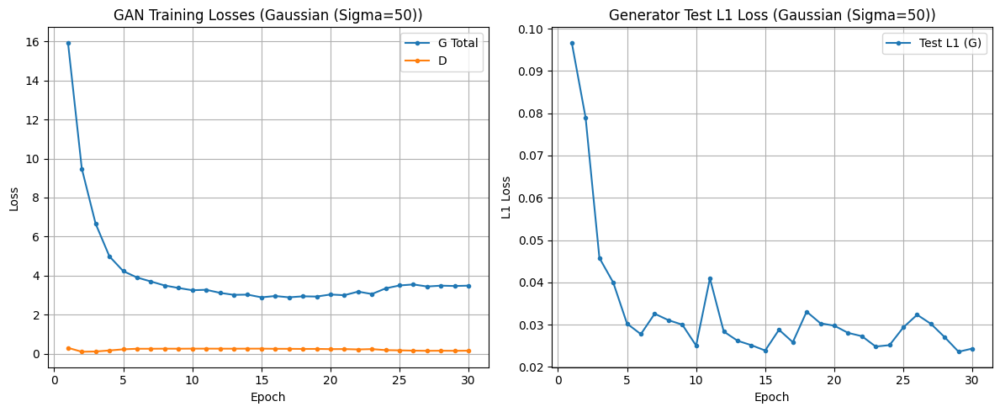


--- Final Test Set Metrics for GAN_Pix2Pix on Gaussian (Sigma=50) ---
  Average MSE: 0.0011
  Average RMSE: 0.0328
  Average PSNR: 29.9676 dB
  Average SSIM: 0.8750
--------------------------------------------------

--- Visualizing GAN Results on Gaussian (Sigma=50) ---

--- GAN_Pix2Pix - Gaussian (Sigma=50) Visualization & Sample Metrics ---
  Img 1: MSE=0.0007, RMSE=0.0272, PSNR=31.30 dB, SSIM=0.8926
  Img 2: MSE=0.0012, RMSE=0.0341, PSNR=29.35 dB, SSIM=0.8911
  Img 3: MSE=0.0013, RMSE=0.0367, PSNR=28.71 dB, SSIM=0.8942
  Img 4: MSE=0.0012, RMSE=0.0344, PSNR=29.28 dB, SSIM=0.8479
  Img 5: MSE=0.0010, RMSE=0.0309, PSNR=30.20 dB, SSIM=0.8814


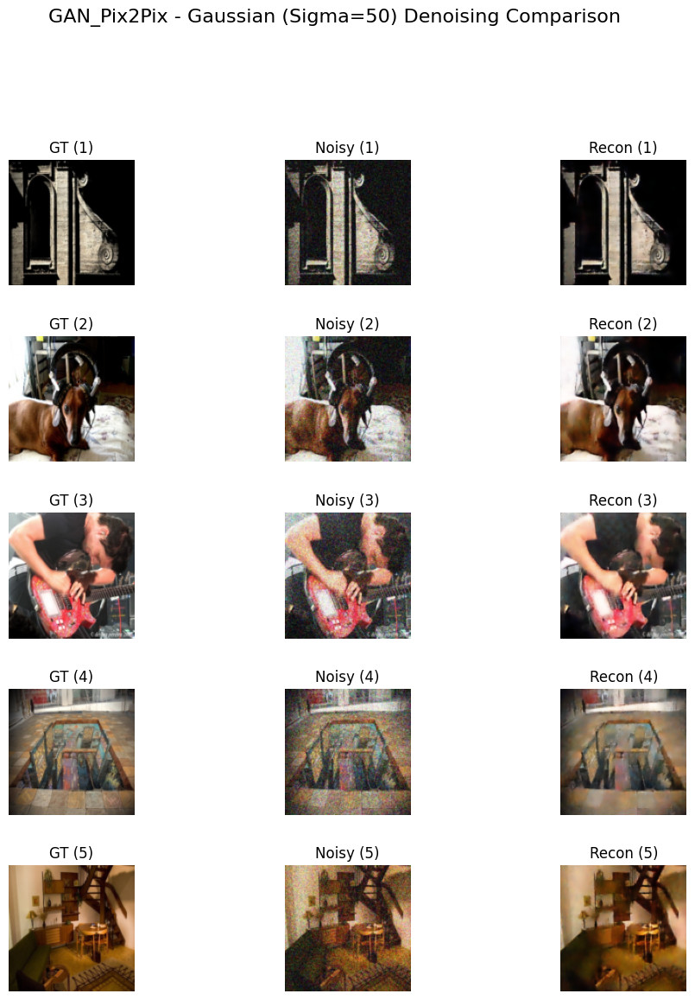


----------------------------------------
--- Task: GAN_Pix2Pix on Salt & Pepper (Density=0.15) ---
Using loaders: saltpepper_015_train_loader, saltpepper_015_test_loader (5000 train, 1250 test)
Initializing fresh Generator and Discriminator models...
Applied weight initialization.
Starting GAN training...

=== Training GAN (Pix2Pix Style) on Salt & Pepper (Density=0.15) ===
Epochs: 30, G LR: 0.0001, D LR: 0.0001, Lambda L1: 100.0

--- Epoch 1/30 ---


E1 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 16.596128 (GAN: 0.965835, L1: 0.156303)
Train D Loss: 0.287852
Test L1 Loss : 0.107623
Epoch completed in 22.69 seconds

--- Epoch 2/30 ---


E2 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 9.823204 (GAN: 0.888199, L1: 0.089350)
Train D Loss: 0.103797
Test L1 Loss : 0.063857
Epoch completed in 22.60 seconds

--- Epoch 3/30 ---


E3 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 6.754899 (GAN: 0.806476, L1: 0.059484)
Train D Loss: 0.115008
Test L1 Loss : 0.047540
Epoch completed in 22.63 seconds

--- Epoch 4/30 ---


E4 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 5.449068 (GAN: 0.708756, L1: 0.047403)
Train D Loss: 0.143092
Test L1 Loss : 0.036044
Epoch completed in 22.62 seconds

--- Epoch 5/30 ---


E5 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.727244 (GAN: 0.563602, L1: 0.041636)
Train D Loss: 0.219213
Test L1 Loss : 0.031487
Epoch completed in 22.59 seconds

--- Epoch 6/30 ---


E6 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.362430 (GAN: 0.441495, L1: 0.039209)
Train D Loss: 0.202099
Test L1 Loss : 0.043128
Epoch completed in 22.64 seconds

--- Epoch 7/30 ---


E7 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.564055 (GAN: 0.683635, L1: 0.038804)
Train D Loss: 0.131347
Test L1 Loss : 0.037700
Epoch completed in 22.58 seconds

--- Epoch 8/30 ---


E8 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.518041 (GAN: 0.735151, L1: 0.037829)
Train D Loss: 0.118127
Test L1 Loss : 0.034630
Epoch completed in 22.64 seconds

--- Epoch 9/30 ---


E9 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.516313 (GAN: 0.805120, L1: 0.037112)
Train D Loss: 0.085139
Test L1 Loss : 0.032777
Epoch completed in 22.62 seconds

--- Epoch 10/30 ---


E10 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.407245 (GAN: 0.812623, L1: 0.035946)
Train D Loss: 0.094262
Test L1 Loss : 0.030816
Epoch completed in 22.68 seconds

--- Epoch 11/30 ---


E11 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.337964 (GAN: 0.790548, L1: 0.035474)
Train D Loss: 0.107464
Test L1 Loss : 0.035114
Epoch completed in 22.62 seconds

--- Epoch 12/30 ---


E12 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.412886 (GAN: 0.805830, L1: 0.036071)
Train D Loss: 0.098080
Test L1 Loss : 0.033015
Epoch completed in 22.61 seconds

--- Epoch 13/30 ---


E13 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.313253 (GAN: 0.824628, L1: 0.034886)
Train D Loss: 0.094580
Test L1 Loss : 0.031215
Epoch completed in 22.67 seconds

--- Epoch 14/30 ---


E14 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.217243 (GAN: 0.775223, L1: 0.034420)
Train D Loss: 0.128564
Test L1 Loss : 0.035128
Epoch completed in 22.67 seconds

--- Epoch 15/30 ---


E15 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.205901 (GAN: 0.810716, L1: 0.033952)
Train D Loss: 0.096286
Test L1 Loss : 0.028518
Epoch completed in 22.66 seconds

--- Epoch 16/30 ---


E16 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.207854 (GAN: 0.817241, L1: 0.033906)
Train D Loss: 0.108752
Test L1 Loss : 0.032014
Epoch completed in 22.58 seconds

--- Epoch 17/30 ---


E17 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.148920 (GAN: 0.813312, L1: 0.033356)
Train D Loss: 0.106766
Test L1 Loss : 0.030373
Epoch completed in 22.67 seconds

--- Epoch 18/30 ---


E18 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.072851 (GAN: 0.804002, L1: 0.032688)
Train D Loss: 0.101797
Test L1 Loss : 0.030878
Epoch completed in 22.62 seconds

--- Epoch 19/30 ---


E19 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.137141 (GAN: 0.848896, L1: 0.032882)
Train D Loss: 0.099347
Test L1 Loss : 0.031467
Epoch completed in 22.61 seconds

--- Epoch 20/30 ---


E20 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.063168 (GAN: 0.807602, L1: 0.032556)
Train D Loss: 0.129609
Test L1 Loss : 0.031147
Epoch completed in 22.66 seconds

--- Epoch 21/30 ---


E21 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.008066 (GAN: 0.817294, L1: 0.031908)
Train D Loss: 0.112510
Test L1 Loss : 0.028915
Epoch completed in 22.64 seconds

--- Epoch 22/30 ---


E22 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.995619 (GAN: 0.797412, L1: 0.031982)
Train D Loss: 0.121364
Test L1 Loss : 0.029358
Epoch completed in 22.65 seconds

--- Epoch 23/30 ---


E23 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.989760 (GAN: 0.816644, L1: 0.031731)
Train D Loss: 0.112512
Test L1 Loss : 0.029002
Epoch completed in 22.66 seconds

--- Epoch 24/30 ---


E24 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.999205 (GAN: 0.797516, L1: 0.032017)
Train D Loss: 0.107844
Test L1 Loss : 0.029903
Epoch completed in 22.63 seconds

--- Epoch 25/30 ---


E25 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.966229 (GAN: 0.826798, L1: 0.031394)
Train D Loss: 0.127212
Test L1 Loss : 0.030378
Epoch completed in 22.67 seconds

--- Epoch 26/30 ---


E26 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.966992 (GAN: 0.809977, L1: 0.031570)
Train D Loss: 0.117045
Test L1 Loss : 0.029393
Epoch completed in 22.66 seconds

--- Epoch 27/30 ---


E27 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.998611 (GAN: 0.803934, L1: 0.031947)
Train D Loss: 0.137001
Test L1 Loss : 0.027820
Epoch completed in 22.64 seconds

--- Epoch 28/30 ---


E28 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.892314 (GAN: 0.768253, L1: 0.031241)
Train D Loss: 0.151712
Test L1 Loss : 0.028865
Epoch completed in 22.60 seconds

--- Epoch 29/30 ---


E29 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.879477 (GAN: 0.778748, L1: 0.031007)
Train D Loss: 0.115513
Test L1 Loss : 0.028814
Epoch completed in 22.63 seconds

--- Epoch 30/30 ---


E30 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.934323 (GAN: 0.805261, L1: 0.031291)
Train D Loss: 0.124101
Test L1 Loss : 0.030502
Epoch completed in 22.64 seconds

GAN Training Finished! Total Time: 11.32 min.

--- Calculating Final Metrics on Test Set (Salt & Pepper (Density=0.15)) ---


GAN Final Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

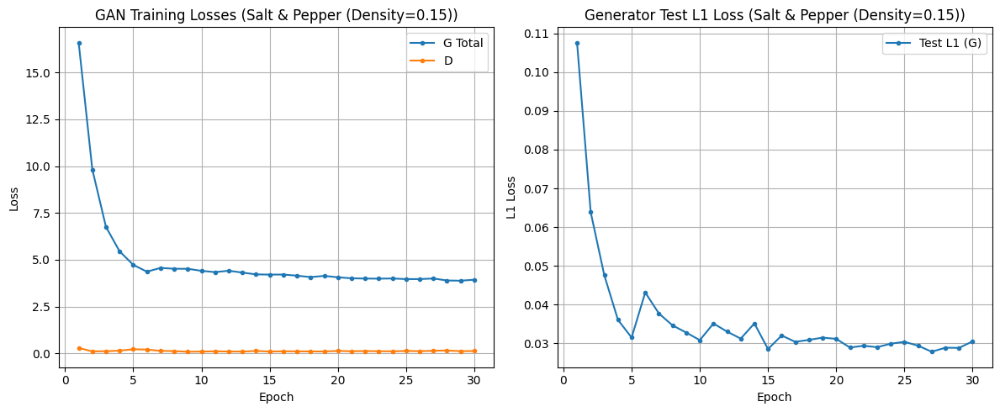


--- Final Test Set Metrics for GAN_Pix2Pix on Salt & Pepper (Density=0.15) ---
  Average MSE: 0.0018
  Average RMSE: 0.0420
  Average PSNR: 27.8802 dB
  Average SSIM: 0.8298
--------------------------------------------------

--- Visualizing GAN Results on Salt & Pepper (Density=0.15) ---

--- GAN_Pix2Pix - Salt & Pepper (Density=0.15) Visualization & Sample Metrics ---
  Img 1: MSE=0.0019, RMSE=0.0431, PSNR=27.32 dB, SSIM=0.8436
  Img 2: MSE=0.0020, RMSE=0.0449, PSNR=26.95 dB, SSIM=0.8665
  Img 3: MSE=0.0020, RMSE=0.0451, PSNR=26.92 dB, SSIM=0.8679
  Img 4: MSE=0.0017, RMSE=0.0414, PSNR=27.65 dB, SSIM=0.7984
  Img 5: MSE=0.0014, RMSE=0.0375, PSNR=28.51 dB, SSIM=0.8518


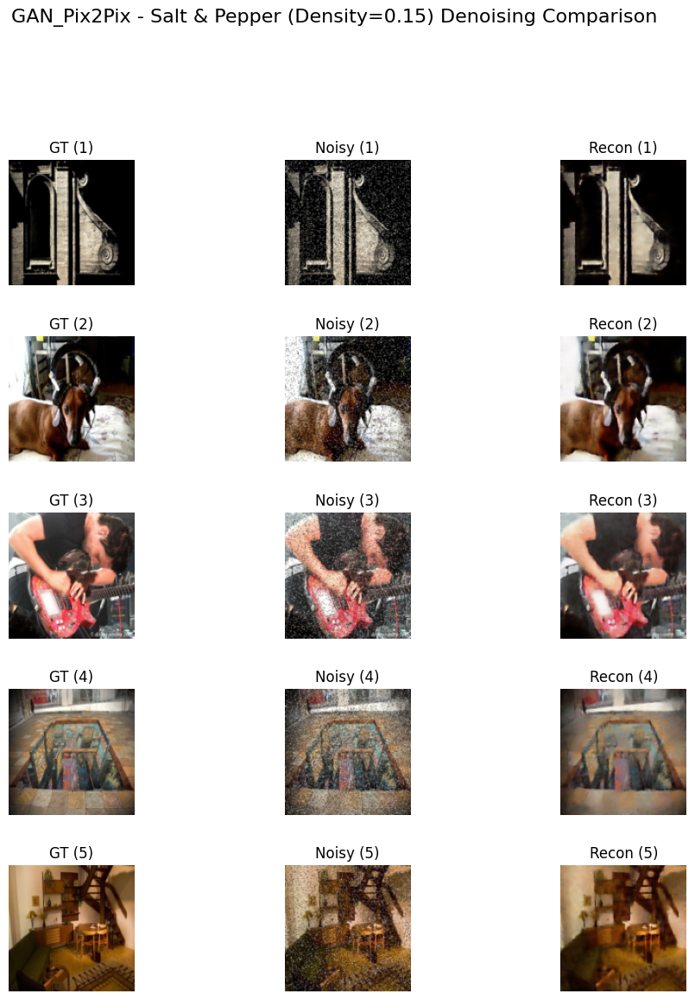


----------------------------------------
--- Task: GAN_Pix2Pix on Speckle (Variance=0.1) ---
Using loaders: speckle_01_train_loader, speckle_01_test_loader (5000 train, 1250 test)
Initializing fresh Generator and Discriminator models...
Applied weight initialization.
Starting GAN training...

=== Training GAN (Pix2Pix Style) on Speckle (Variance=0.1) ===
Epochs: 30, G LR: 0.0001, D LR: 0.0001, Lambda L1: 100.0

--- Epoch 1/30 ---


E1 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 16.217710 (GAN: 1.014078, L1: 0.152036)
Train D Loss: 0.291108
Test L1 Loss : 0.111745
Epoch completed in 22.64 seconds

--- Epoch 2/30 ---


E2 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 9.411102 (GAN: 0.932287, L1: 0.084788)
Train D Loss: 0.098921
Test L1 Loss : 0.071104
Epoch completed in 22.65 seconds

--- Epoch 3/30 ---


E3 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 6.298103 (GAN: 0.831634, L1: 0.054665)
Train D Loss: 0.107137
Test L1 Loss : 0.061130
Epoch completed in 22.66 seconds

--- Epoch 4/30 ---


E4 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.989671 (GAN: 0.785189, L1: 0.042045)
Train D Loss: 0.121748
Test L1 Loss : 0.028910
Epoch completed in 22.65 seconds

--- Epoch 5/30 ---


E5 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.554929 (GAN: 0.835528, L1: 0.037194)
Train D Loss: 0.105862
Test L1 Loss : 0.030568
Epoch completed in 22.68 seconds

--- Epoch 6/30 ---


E6 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.191014 (GAN: 0.861376, L1: 0.033296)
Train D Loss: 0.090783
Test L1 Loss : 0.027770
Epoch completed in 22.66 seconds

--- Epoch 7/30 ---


E7 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 4.079171 (GAN: 0.861333, L1: 0.032178)
Train D Loss: 0.086043
Test L1 Loss : 0.026658
Epoch completed in 22.63 seconds

--- Epoch 8/30 ---


E8 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.817857 (GAN: 0.876518, L1: 0.029413)
Train D Loss: 0.082597
Test L1 Loss : 0.029532
Epoch completed in 22.64 seconds

--- Epoch 9/30 ---


E9 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.902526 (GAN: 0.935971, L1: 0.029666)
Train D Loss: 0.045050
Test L1 Loss : 0.024384
Epoch completed in 22.70 seconds

--- Epoch 10/30 ---


E10 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.670914 (GAN: 0.884973, L1: 0.027859)
Train D Loss: 0.083595
Test L1 Loss : 0.024134
Epoch completed in 22.67 seconds

--- Epoch 11/30 ---


E11 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.675116 (GAN: 0.931753, L1: 0.027434)
Train D Loss: 0.050559
Test L1 Loss : 0.026466
Epoch completed in 22.68 seconds

--- Epoch 12/30 ---


E12 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.590028 (GAN: 0.931526, L1: 0.026585)
Train D Loss: 0.054522
Test L1 Loss : 0.022953
Epoch completed in 22.67 seconds

--- Epoch 13/30 ---


E13 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.532202 (GAN: 0.926829, L1: 0.026054)
Train D Loss: 0.054545
Test L1 Loss : 0.022323
Epoch completed in 22.65 seconds

--- Epoch 14/30 ---


E14 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.546384 (GAN: 0.928628, L1: 0.026178)
Train D Loss: 0.056433
Test L1 Loss : 0.028857
Epoch completed in 22.65 seconds

--- Epoch 15/30 ---


E15 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.422597 (GAN: 0.915032, L1: 0.025076)
Train D Loss: 0.057772
Test L1 Loss : 0.021750
Epoch completed in 22.62 seconds

--- Epoch 16/30 ---


E16 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.394522 (GAN: 0.910776, L1: 0.024837)
Train D Loss: 0.062192
Test L1 Loss : 0.031674
Epoch completed in 22.67 seconds

--- Epoch 17/30 ---


E17 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.417287 (GAN: 0.928525, L1: 0.024888)
Train D Loss: 0.053156
Test L1 Loss : 0.022147
Epoch completed in 22.66 seconds

--- Epoch 18/30 ---


E18 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.401849 (GAN: 0.935596, L1: 0.024663)
Train D Loss: 0.046873
Test L1 Loss : 0.022533
Epoch completed in 22.66 seconds

--- Epoch 19/30 ---


E19 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.445705 (GAN: 0.941155, L1: 0.025045)
Train D Loss: 0.043985
Test L1 Loss : 0.022280
Epoch completed in 22.62 seconds

--- Epoch 20/30 ---


E20 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.351866 (GAN: 0.934820, L1: 0.024170)
Train D Loss: 0.047800
Test L1 Loss : 0.021234
Epoch completed in 22.60 seconds

--- Epoch 21/30 ---


E21 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.312359 (GAN: 0.963817, L1: 0.023485)
Train D Loss: 0.033073
Test L1 Loss : 0.033947
Epoch completed in 22.61 seconds

--- Epoch 22/30 ---


E22 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.382798 (GAN: 0.929810, L1: 0.024530)
Train D Loss: 0.049466
Test L1 Loss : 0.020969
Epoch completed in 22.60 seconds

--- Epoch 23/30 ---


E23 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.286414 (GAN: 0.935360, L1: 0.023511)
Train D Loss: 0.052857
Test L1 Loss : 0.026122
Epoch completed in 22.63 seconds

--- Epoch 24/30 ---


E24 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.288001 (GAN: 0.938083, L1: 0.023499)
Train D Loss: 0.047341
Test L1 Loss : 0.022092
Epoch completed in 22.62 seconds

--- Epoch 25/30 ---


E25 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.317044 (GAN: 0.928175, L1: 0.023889)
Train D Loss: 0.046820
Test L1 Loss : 0.026406
Epoch completed in 22.67 seconds

--- Epoch 26/30 ---


E26 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.279320 (GAN: 0.962050, L1: 0.023173)
Train D Loss: 0.031484
Test L1 Loss : 0.029642
Epoch completed in 22.65 seconds

--- Epoch 27/30 ---


E27 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.220702 (GAN: 0.944078, L1: 0.022766)
Train D Loss: 0.041322
Test L1 Loss : 0.020018
Epoch completed in 22.75 seconds

--- Epoch 28/30 ---


E28 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.255459 (GAN: 0.964741, L1: 0.022907)
Train D Loss: 0.023677
Test L1 Loss : 0.024130
Epoch completed in 22.71 seconds

--- Epoch 29/30 ---


E29 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.260374 (GAN: 0.950322, L1: 0.023101)
Train D Loss: 0.038492
Test L1 Loss : 0.024313
Epoch completed in 22.68 seconds

--- Epoch 30/30 ---


E30 GAN Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train G Loss: 3.269376 (GAN: 0.950377, L1: 0.023190)
Train D Loss: 0.043211
Test L1 Loss : 0.020025
Epoch completed in 22.62 seconds

GAN Training Finished! Total Time: 11.33 min.

--- Calculating Final Metrics on Test Set (Speckle (Variance=0.1)) ---


GAN Final Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

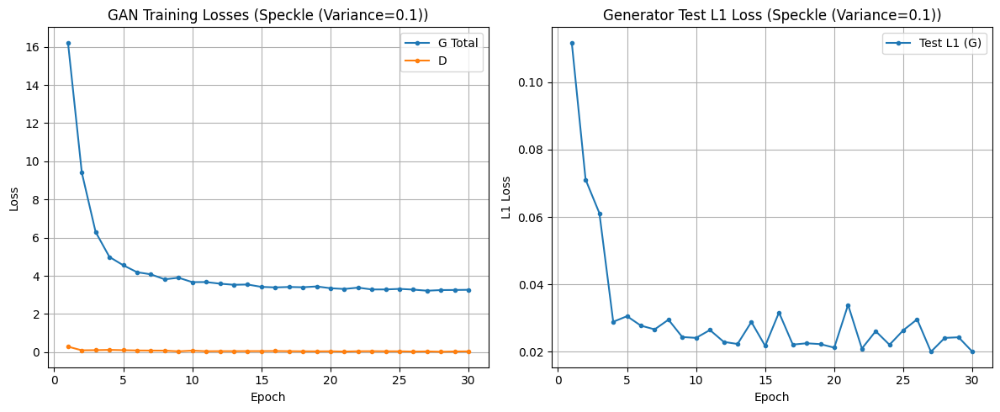


--- Final Test Set Metrics for GAN_Pix2Pix on Speckle (Variance=0.1) ---
  Average MSE: 0.0008
  Average RMSE: 0.0282
  Average PSNR: 31.4321 dB
  Average SSIM: 0.9121
--------------------------------------------------

--- Visualizing GAN Results on Speckle (Variance=0.1) ---

--- GAN_Pix2Pix - Speckle (Variance=0.1) Visualization & Sample Metrics ---
  Img 1: MSE=0.0006, RMSE=0.0245, PSNR=32.20 dB, SSIM=0.9462
  Img 2: MSE=0.0008, RMSE=0.0289, PSNR=30.79 dB, SSIM=0.9335
  Img 3: MSE=0.0009, RMSE=0.0306, PSNR=30.28 dB, SSIM=0.9396
  Img 4: MSE=0.0007, RMSE=0.0271, PSNR=31.33 dB, SSIM=0.9155
  Img 5: MSE=0.0005, RMSE=0.0227, PSNR=32.89 dB, SSIM=0.9343


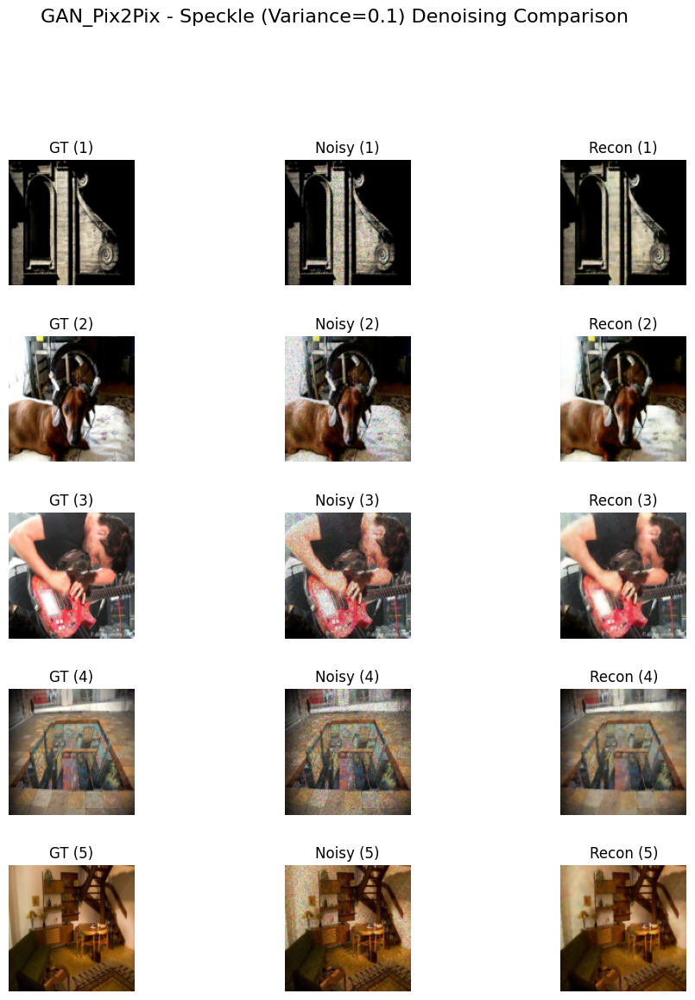


===== EXPERIMENT SUMMARY (GAN Only - HIGH NOISE) =====
      Model                   Noise Type     MSE   RMSE  PSNR   SSIM
GAN_Pix2Pix          Gaussian (Sigma=50) 0.00108 0.0328 29.97 0.8750
GAN_Pix2Pix Salt & Pepper (Density=0.15) 0.00177 0.0420 27.88 0.8298
GAN_Pix2Pix       Speckle (Variance=0.1) 0.00080 0.0282 31.43 0.9121

===== End of GAN Experiments =====


In [ ]:
# === CELL: GAN Training & Evaluation Across All High Noise Types ===

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time
import math
import gc
import pandas as pd # Optional: For table output
import json # For fallback output

# Ensure scikit-image is installed (`pip install scikit-image`)
try:
    from skimage.metrics import peak_signal_noise_ratio as psnr
    from skimage.metrics import structural_similarity as ssim
    from skimage.metrics import mean_squared_error as mse
except ImportError:
    print("ERROR: scikit-image not found. Please install it: pip install scikit-image")
    raise

print(f"PyTorch Version: {torch.__version__}")
# --- 1. Device Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


# --- 2. Weight Initialization Function ---
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        try: nn.init.normal_(m.weight.data, 0.0, 0.02);
        except AttributeError: pass
        if hasattr(m, 'bias') and m.bias is not None: nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('BatchNorm') != -1:
        try: nn.init.normal_(m.weight.data, 1.0, 0.02); nn.init.constant_(m.bias.data, 0.0)
        except AttributeError: pass
# print("Defined: weights_init_normal")

# --- 3. Model Definitions ---

# == PatchGAN Discriminator ==
class PatchGANDiscriminator(nn.Module):
    def __init__(self, input_nc=6, ndf=64, n_layers=3, norm_layer=nn.BatchNorm2d):
        super(PatchGANDiscriminator, self).__init__(); use_bias = norm_layer == nn.InstanceNorm2d
        kw = 4; padw = 1; sequence = [nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw), nn.LeakyReLU(0.2, True)]
        nf_mult = 1; nf_mult_prev = 1
        for n in range(1, n_layers): nf_mult_prev = nf_mult; nf_mult = min(2**n, 8); sequence += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=use_bias), norm_layer(ndf * nf_mult), nn.LeakyReLU(0.2, True)]
        nf_mult_prev = nf_mult; nf_mult = min(2**n_layers, 8); sequence += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=use_bias), norm_layer(ndf * nf_mult), nn.LeakyReLU(0.2, True)]
        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw)]; self.model = nn.Sequential(*sequence)
    def forward(self, input): return self.model(input)
# print("Defined: PatchGANDiscriminator")

# == UNet Generator (includes DoubleConv, Down, Up, OutConv) ==
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__();
        if not mid_channels: mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(mid_channels), nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True)
        );
    def forward(self, x): return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__(); self.maxpool_conv = nn.Sequential(nn.MaxPool2d(2), DoubleConv(in_channels, out_channels));
    def forward(self, x): return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__();
        conv_in_channels = out_channels + out_channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            conv_in_channels = in_channels + out_channels
        else:
            self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
            conv_in_channels = out_channels + out_channels
        self.conv = DoubleConv(conv_in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1); diffY = x2.size()[2] - x1.size()[2]; diffX = x2.size()[3] - x1.size()[3]
        x1 = nn.functional.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1); return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__(); self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1);
    def forward(self, x): return self.conv(x)

class UNet(nn.Module): # Used as Generator
    def __init__(self, n_channels=3, n_classes=3, bilinear=True):
        super(UNet, self).__init__();
        self.n_channels, self.n_classes, self.bilinear = n_channels, n_classes, bilinear
        c1, c2, c3, c4, c5 = 64, 128, 256, 512, 512
        self.inc = DoubleConv(n_channels, c1)
        self.down1 = Down(c1, c2); self.down2 = Down(c2, c3); self.down3 = Down(c3, c4); self.down4 = Down(c4, c5)
        self.up1 = Up(c5, c4, bilinear); self.up2 = Up(c4, c3, bilinear); self.up3 = Up(c3, c2, bilinear); self.up4 = Up(c2, c1, bilinear)
        self.outc = OutConv(c1, n_classes); self.final_activation = nn.Sigmoid()
    def forward(self, x):
        x1=self.inc(x); x2=self.down1(x1); x3=self.down2(x2); x4=self.down3(x3); x5=self.down4(x4)
        x=self.up1(x5, x4); x=self.up2(x, x3); x=self.up3(x, x2); x=self.up4(x, x1)
        logits=self.outc(x); output=self.final_activation(logits); return output
# print("Defined: UNet (Generator)")

# --- 4. Metrics Calculation Function ---
def calculate_metrics(clean_img_np, denoised_img_np):
    clean_img_np = np.clip(clean_img_np, 0, 1); denoised_img_np = np.clip(denoised_img_np, 0, 1)
    mse_val = mse(clean_img_np, denoised_img_np); rmse_val = math.sqrt(mse_val)
    psnr_val = psnr(clean_img_np, denoised_img_np, data_range=1.0)
    ssim_val = ssim(clean_img_np, denoised_img_np, channel_axis=-1, data_range=1.0)
    return mse_val, rmse_val, psnr_val, ssim_val
# print("Defined: calculate_metrics")

# --- 5. Visualization Function ---
def visualize_denoising(model, dataloader, device, num_images=5, title_prefix=""):
    model.eval(); num_images_found = 0; rows_plotted = 0; batch_num = 0; max_batches_to_check = 5
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 2.5 * num_images)); fig.subplots_adjust(hspace=0.4, wspace=0.1)
    if num_images == 1: axes = [axes]
    print(f"\n--- {title_prefix} Visualization & Sample Metrics ---")
    with torch.no_grad():
        for noisy_images, clean_images in dataloader:
            batch_num += 1;
            if num_images_found >= num_images or batch_num > max_batches_to_check: break
            outputs = model(noisy_images.to(device)).cpu()
            noisy_plot = noisy_images.cpu().numpy(); clean_plot = clean_images.numpy(); recon_plot = outputs.numpy()
            for i in range(noisy_images.size(0)):
                if num_images_found >= num_images: break
                clean_img_np = np.clip(np.transpose(clean_plot[i], (1, 2, 0)), 0, 1)
                noisy_img_np = np.clip(np.transpose(noisy_plot[i], (1, 2, 0)), 0, 1)
                recon_img_np = np.clip(np.transpose(recon_plot[i], (1, 2, 0)), 0, 1)
                ax_row = axes[num_images_found]
                ax_row[0].imshow(clean_img_np); ax_row[0].set_title(f"GT ({num_images_found+1})"); ax_row[0].axis('off')
                ax_row[1].imshow(noisy_img_np); ax_row[1].set_title(f"Noisy ({num_images_found+1})"); ax_row[1].axis('off')
                ax_row[2].imshow(recon_img_np); ax_row[2].set_title(f"Recon ({num_images_found+1})"); ax_row[2].axis('off')
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_img_np, recon_img_np); print(f"  Img {num_images_found+1}: MSE={mse_val:.4f}, RMSE={rmse_val:.4f}, PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")
                except Exception as e: print(f"  Img {num_images_found+1}: Metrics Error - {e}")
                num_images_found += 1
    for i in range(num_images_found, num_images): fig.delaxes(axes[i][0]); fig.delaxes(axes[i][1]); fig.delaxes(axes[i][2])
    fig.suptitle(f"{title_prefix} Denoising Comparison", fontsize=16, y=1.02 if num_images>1 else 1.08); plt.show()
# print("Defined: visualize_denoising")

# --- 6. GAN Training Function ---
def train_gan_denoiser(netG, netD, train_loader, test_loader, device, noise_type_str,
                       num_epochs=40, g_lr=1e-4, d_lr=1e-4, lambda_l1=100.0):
    # (Using the train_gan_denoiser function definition provided previously)
    print(f"\n=== Training GAN (Pix2Pix Style) on {noise_type_str} ===")
    print(f"Epochs: {num_epochs}, G LR: {g_lr}, D LR: {d_lr}, Lambda L1: {lambda_l1}")
    netG.to(device); netD.to(device)
    criterion_GAN = nn.MSELoss().to(device); criterion_L1 = nn.L1Loss().to(device)
    optimizer_G = optim.Adam(netG.parameters(), lr=g_lr, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(netD.parameters(), lr=d_lr, betas=(0.5, 0.999))
    g_loss_hist, d_loss_hist, test_l1_hist = [], [], []
    start_time = time.time()
    if not train_loader or not test_loader: print("ERROR: Invalid dataloaders."); return netG, netD, [], [], [], None

    for epoch in range(num_epochs):
        epoch_start_time = time.time(); print(f"\n--- Epoch {epoch+1}/{num_epochs} ---"); netG.train(); netD.train()
        running_g_loss, running_d_loss, running_g_loss_gan, running_g_loss_l1 = 0.0, 0.0, 0.0, 0.0
        train_progress_bar = tqdm(train_loader, desc=f"E{epoch+1} GAN Train", leave=False)
        for noisy_imgs, clean_imgs in train_progress_bar:
            noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); batch_size = noisy_imgs.size(0)
            fake_clean_imgs = netG(noisy_imgs)
            # Train D
            for param in netD.parameters(): param.requires_grad = True
            optimizer_D.zero_grad(); real_pair = torch.cat((noisy_imgs, clean_imgs), 1); pred_real = netD(real_pair)
            target_real_label = torch.ones_like(pred_real, requires_grad=False).to(device); loss_D_real = criterion_GAN(pred_real, target_real_label)
            fake_pair = torch.cat((noisy_imgs, fake_clean_imgs.detach()), 1); pred_fake = netD(fake_pair)
            target_fake_label = torch.zeros_like(pred_fake, requires_grad=False).to(device); loss_D_fake = criterion_GAN(pred_fake, target_fake_label)
            loss_D = (loss_D_real + loss_D_fake) * 0.5; loss_D.backward(); optimizer_D.step(); running_d_loss += loss_D.item() * batch_size
            # Train G
            for param in netD.parameters(): param.requires_grad = False
            optimizer_G.zero_grad(); fake_clean_imgs_for_G = netG(noisy_imgs); fake_pair_for_G = torch.cat((noisy_imgs, fake_clean_imgs_for_G), 1); pred_fake_for_G = netD(fake_pair_for_G)
            loss_G_GAN = criterion_GAN(pred_fake_for_G, target_real_label); loss_G_L1 = criterion_L1(fake_clean_imgs_for_G, clean_imgs)
            loss_G = loss_G_GAN + lambda_l1 * loss_G_L1; loss_G.backward(); optimizer_G.step()
            running_g_loss += loss_G.item() * batch_size; running_g_loss_gan += loss_G_GAN.item() * batch_size; running_g_loss_l1 += loss_G_L1.item() * batch_size
            train_progress_bar.set_postfix({'G_loss': f'{loss_G.item():.4f}', 'D_loss': f'{loss_D.item():.4f}'})
        epoch_g_loss = running_g_loss/len(train_loader.dataset); epoch_d_loss = running_d_loss/len(train_loader.dataset); epoch_g_loss_gan = running_g_loss_gan/len(train_loader.dataset); epoch_g_loss_l1 = running_g_loss_l1/len(train_loader.dataset)
        g_loss_hist.append(epoch_g_loss); d_loss_hist.append(epoch_d_loss); print(f"Train G Loss: {epoch_g_loss:.6f} (GAN: {epoch_g_loss_gan:.6f}, L1: {epoch_g_loss_l1:.6f})"); print(f"Train D Loss: {epoch_d_loss:.6f}")
        # Test Eval (L1 Loss)
        netG.eval(); running_test_l1 = 0.0
        with torch.no_grad():
            for noisy_imgs, clean_imgs in test_loader: noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = netG(noisy_imgs); loss_l1 = criterion_L1(outputs, clean_imgs); running_test_l1 += loss_l1.item() * noisy_imgs.size(0)
        epoch_test_l1 = running_test_l1/len(test_loader.dataset); test_l1_hist.append(epoch_test_l1); print(f"Test L1 Loss : {epoch_test_l1:.6f}")
        print(f"Epoch completed in {time.time() - epoch_start_time:.2f} seconds")
    print(f"\nGAN Training Finished! Total Time: {(time.time() - start_time) / 60:.2f} min.")
    print(f"\n--- Calculating Final Metrics on Test Set ({noise_type_str}) ---"); netG.eval()
    total_mse, total_rmse, total_psnr, total_ssim = 0.0, 0.0, 0.0, 0.0; num_samples = 0
    eval_progress_bar = tqdm(test_loader, desc="GAN Final Evaluation", leave=False)
    with torch.no_grad():
        for noisy_imgs, clean_imgs in eval_progress_bar:
            batch_size = clean_imgs.size(0); outputs = netG(noisy_imgs.to(device)).cpu(); clean_np = clean_imgs.numpy(); outputs_np = outputs.numpy(); actual_processed = 0
            for i in range(batch_size):
                clean_single = np.clip(np.transpose(clean_np[i], (1, 2, 0)), 0, 1); output_single = np.clip(np.transpose(outputs_np[i], (1, 2, 0)), 0, 1)
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_single, output_single); total_mse += mse_val; total_rmse += rmse_val; total_psnr += psnr_val; total_ssim += ssim_val; actual_processed += 1
                except Exception as metric_e: print(f"Warn: Metric calc error: {metric_e}")
            num_samples += actual_processed
    avg_metrics = {};
    if num_samples > 0: avg_metrics["MSE"] = total_mse / num_samples; avg_metrics["RMSE"] = math.sqrt(avg_metrics["MSE"]); avg_metrics["PSNR"] = total_psnr / num_samples; avg_metrics["SSIM"] = total_ssim / num_samples
    else: avg_metrics = {"MSE": float('nan'),"RMSE": float('nan'),"PSNR": float('nan'),"SSIM": float('nan')}
    plt.figure(figsize=(12, 5)); plt.subplot(1, 2, 1); plt.plot(range(1, num_epochs + 1), g_loss_hist, marker='.', linestyle='-', label='G Total'); plt.plot(range(1, num_epochs + 1), d_loss_hist, marker='.', linestyle='-', label='D')
    plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.title(f'GAN Training Losses ({noise_type_str})'); plt.legend(); plt.grid(True)
    plt.subplot(1, 2, 2); plt.plot(range(1, num_epochs + 1), test_l1_hist, marker='.', linestyle='-', label='Test L1 (G)'); plt.xlabel('Epoch'); plt.ylabel('L1 Loss'); plt.title(f'Generator Test L1 Loss ({noise_type_str})'); plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()
    return netG, netD, g_loss_hist, d_loss_hist, test_l1_hist, avg_metrics
# print("Defined: train_gan_denoiser")

# --- 7. Main Execution Logic ---

# === Experiment Parameters ===
# Ensure these are defined from previous cells or set here
# CLEAN_DATA_BASE_PATH = '...'
# NOISY_DATA_BASE_PATH = '/content/denoising_dataset_noisy_subset_single_high' # High noise path

# Noise configurations to run (HIGH levels)
noise_configs_to_run = {
    'gaussian': {'level': 50, 'label': 'Gaussian (Sigma=50)'},
    'saltpepper': {'level': 0.15, 'label': 'Salt & Pepper (Density=0.15)'},
    'speckle': {'level': 0.1, 'label': 'Speckle (Variance=0.1)'}
}

# GAN hyperparameters (can be tuned)
GAN_EPOCHS = 30
GAN_G_LR = 1e-4
GAN_D_LR = 1e-4
GAN_LAMBDA_L1 = 100.0

# Results storage
results = {"GAN_Pix2Pix": {}} # Only running GAN now

print(f"\n{'='*60}\n===== STARTING GAN EXPERIMENTS (HIGH NOISE) =====\n{'='*60}")

# --- Loop through noise types ---
for noise_type, config in noise_configs_to_run.items():
    noise_level = config['level']
    noise_label = config['label']
    model_name = "GAN_Pix2Pix" # Hardcoded for this run
    print(f"\n{'-'*40}\n--- Task: {model_name} on {noise_label} ---")

    # 1. Select the correct DataLoaders for this high noise type
    train_loader, test_loader = None, None
    level_str = str(noise_level).replace('.', '')
    loader_suffix = f"{noise_type}_{level_str}"
    train_loader_var_name = f"{loader_suffix}_train_loader"
    test_loader_var_name = f"{loader_suffix}_test_loader"
    try:
        train_loader = globals()[train_loader_var_name]
        test_loader = globals()[test_loader_var_name]
        if train_loader is None or test_loader is None: raise ValueError("Loaders are None.")
        print(f"Using loaders: {train_loader_var_name}, {test_loader_var_name} ({len(train_loader.dataset)} train, {len(test_loader.dataset)} test)")
    except Exception as e: print(f"ERROR selecting DataLoaders: {e}. Skipping task."); results[model_name][noise_label] = {"Status": "DataLoader Error"}; continue

    # 2. Initialize FRESH GAN models
    print("Initializing fresh Generator and Discriminator models...")
    netG, netD = None, None; trained_model = None; avg_metrics = None
    try:
        GeneratorClass, DiscriminatorClass = UNet, PatchGANDiscriminator # Directly use classes
        netG = GeneratorClass(n_channels=3, n_classes=3).to(device)
        netD = DiscriminatorClass(input_nc=6).to(device)
        try: netG.apply(weights_init_normal); netD.apply(weights_init_normal); print("Applied weight initialization.")
        except NameError: print("Skipping weight initialization.")
    except Exception as e: print(f"ERROR initializing GAN components: {e}. Skipping task."); results[model_name][noise_label] = {"Status": "Model Init Error"}; continue

    # 3. Train the GAN
    print("Starting GAN training...")
    try:
        trained_G, _, _, _, _, avg_metrics = train_gan_denoiser(
             netG, netD, train_loader, test_loader, device, noise_label,
             num_epochs=GAN_EPOCHS, g_lr=GAN_G_LR, d_lr=GAN_D_LR, lambda_l1=GAN_LAMBDA_L1
        )
        trained_model = trained_G # Use Generator for visualization/metrics summary
    except NameError: print("ERROR: train_gan_denoiser func not defined!"); raise
    except Exception as e: print(f"ERROR during GAN training: {e}"); trained_model = None; avg_metrics = {"Status": f"GAN Runtime Error: {e}"}

    # 4. Store results
    if avg_metrics: results[model_name][noise_label] = avg_metrics
    elif "Status" not in results[model_name].get(noise_label, {}): results[model_name][noise_label] = {"Status": "Metrics Error"}
    # Print metrics immediately
    if avg_metrics and "Status" not in avg_metrics:
        print(f"\n--- Final Test Set Metrics for {model_name} on {noise_label} ---")
        for metric, value in avg_metrics.items(): print(f"  Average {metric}: {value:.4f}" + (" dB" if metric=="PSNR" else ""))
        print("-" * 50)

    # 5. Visualize Results using the trained Generator
    if trained_model and test_loader:
         print(f"\n--- Visualizing GAN Results on {noise_label} ---")
         try: visualize_denoising(trained_model, test_loader, device, num_images=5, title_prefix=f"{model_name} - {noise_label}")
         except NameError: print("ERROR: visualize_denoising func not defined.")
         except Exception as e: print(f"An error during visualization: {e}")
    elif not trained_model: print("Skipping visualization due to training error.")
    else: print("Skipping visualization.")

# 6. Clean up memory
        # Delete variables specific to this noise type run
    if 'trained_G' in locals(): del trained_G # Delete if assigned
    # netG and netD (initial instances) and trained_model (holds trained G) are deleted here:
    del netG, netD, trained_model, train_loader, test_loader
    gc.collect(); # Run Python garbage collector
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    # --- End of noise type loop ---

print(f"\n{'='*60}\n===== EXPERIMENT SUMMARY (GAN Only - HIGH NOISE) =====\n{'='*60}")

# --- Print Results Table ---
try:
    df_results = []; sorted_models = sorted(results.keys()); sorted_noise_labels = sorted(noise_configs_to_run[key]['label'] for key in noise_configs_to_run)
    for model_name in sorted_models: # Will only be GAN_Pix2Pix now
        for noise_label in sorted_noise_labels:
            metrics = results.get(model_name, {}).get(noise_label, {"Status": "Not Run"})
            if isinstance(metrics, dict) and "Status" not in metrics: row = {'Model': model_name, 'Noise Type': noise_label, **metrics}; df_results.append(row)
            else: status = metrics.get('Status', 'Unknown Error') if isinstance(metrics, dict) else 'Unknown Error'; row = {'Model': model_name, 'Noise Type': noise_label, 'MSE': status, 'RMSE': status, 'PSNR': status, 'SSIM': status}; df_results.append(row)
    if df_results:
         results_df = pd.DataFrame(df_results); float_format_map = {"MSE": "{:.5f}", "RMSE": "{:.4f}", "PSNR": "{:.2f}", "SSIM": "{:.4f}"}
         for col, fmt in float_format_map.items():
             if col in results_df.columns: results_df[col] = results_df[col].apply(lambda x: fmt.format(x) if isinstance(x, (int, float)) and pd.notna(x) else x)
         print(results_df.to_string(index=False))
    else: print("No results were successfully collected.")
except ImportError: print("Pandas not found. Raw results:\n", json.dumps(results, indent=2))
except Exception as e: print(f"Error formatting table: {e}\nRaw results:\n", json.dumps(results, indent=2))

print(f"\n{'='*60}\n===== End of GAN Experiments =====\n{'='*60}")

In [ ]:
!pip install timm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 134.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 108.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 70.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 51.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvji

timm version: 1.0.15
PyTorch Version: 2.6.0+cu124
Using device: cuda

Defined: CORRECTED SwinDenoiser with Permute

--- Preparing Fine-tuning for SwinDenoiser on gaussian (Level=50) ---
Using loaders: gaussian_50_train_loader, gaussian_50_test_loader

Initializing SwinDenoiser model...
Loaded Swin backbone 'swin_tiny_patch4_window7_224' (pretrained=True)
Swin backbone raw output shape (B,H,W,C expected): torch.Size([2, 7, 7, 768])
Decoder input channels expected (C): 768
Decoder start spatial size (H=W): 7x7
Calculated num_upsample_layers needed: 5
Built CNN decoder with 5 upsampling stages.

=== Fine-tuning/Training SwinDenoiser on gaussian (Level=50) ===
Starting run: Epochs=20, LR=0.0001, Optimizer=AdamW, Loss=L1

--- Epoch 1/20 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.165296
Test Loss  (L1Loss): 0.117071
Epoch completed in 25.75s

--- Epoch 2/20 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.103818
Test Loss  (L1Loss): 0.089035
Epoch completed in 25.72s

--- Epoch 3/20 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.092216
Test Loss  (L1Loss): 0.084629
Epoch completed in 25.72s

--- Epoch 4/20 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.079983
Test Loss  (L1Loss): 0.072981
Epoch completed in 25.72s

--- Epoch 5/20 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.071639
Test Loss  (L1Loss): 0.070749
Epoch completed in 25.72s

--- Epoch 6/20 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.068909
Test Loss  (L1Loss): 0.062982
Epoch completed in 26.42s

--- Epoch 7/20 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.065702
Test Loss  (L1Loss): 0.063573
Epoch completed in 25.80s

--- Epoch 8/20 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.065685
Test Loss  (L1Loss): 0.061320
Epoch completed in 25.92s

--- Epoch 9/20 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.064706
Test Loss  (L1Loss): 0.059203
Epoch completed in 25.88s

--- Epoch 10/20 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.063229
Test Loss  (L1Loss): 0.061578
Epoch completed in 25.85s

--- Epoch 11/20 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.061114
Test Loss  (L1Loss): 0.054376
Epoch completed in 25.84s

--- Epoch 12/20 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.059589
Test Loss  (L1Loss): 0.056528
Epoch completed in 25.85s

--- Epoch 13/20 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.057264
Test Loss  (L1Loss): 0.052222
Epoch completed in 25.86s

--- Epoch 14/20 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.057434
Test Loss  (L1Loss): 0.055025
Epoch completed in 25.82s

--- Epoch 15/20 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.056711
Test Loss  (L1Loss): 0.056174
Epoch completed in 25.76s

--- Epoch 16/20 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055459
Test Loss  (L1Loss): 0.052215
Epoch completed in 25.87s

--- Epoch 17/20 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055632
Test Loss  (L1Loss): 0.051091
Epoch completed in 25.95s

--- Epoch 18/20 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.053241
Test Loss  (L1Loss): 0.048120
Epoch completed in 25.94s

--- Epoch 19/20 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051872
Test Loss  (L1Loss): 0.049926
Epoch completed in 25.92s

--- Epoch 20/20 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051140
Test Loss  (L1Loss): 0.046222
Epoch completed in 25.81s

Training Finished! Total Time: 8.62 min.

--- Calculating Final Metrics on Test Set (gaussian (Level=50)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

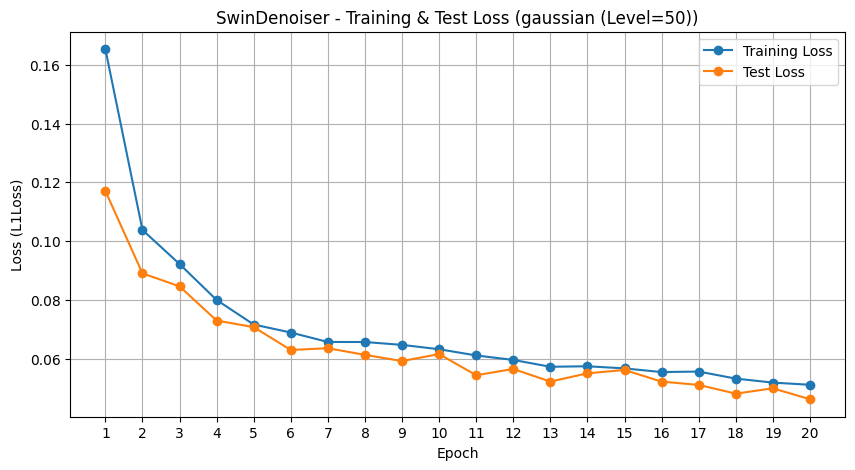


--- Final Test Set Metrics for SwinDenoiser on gaussian (Level=50) ---
  Average MSE: 0.0053
  Average RMSE: 0.0731
  Average PSNR: 23.5963 dB
  Average SSIM: 0.6495
--------------------------------------------------

--- Visualizing SwinDenoiser Results on gaussian (Level=50) ---

--- SwinDenoiser - gaussian (Level=50) Visualization & Sample Metrics ---
  Img 1: MSE=0.0085, RMSE=0.0923, PSNR=20.70 dB, SSIM=0.6614
  Img 2: MSE=0.0064, RMSE=0.0802, PSNR=21.91 dB, SSIM=0.6562
  Img 3: MSE=0.0064, RMSE=0.0800, PSNR=21.94 dB, SSIM=0.6360
  Img 4: MSE=0.0040, RMSE=0.0631, PSNR=24.00 dB, SSIM=0.5770
  Img 5: MSE=0.0035, RMSE=0.0594, PSNR=24.52 dB, SSIM=0.6400


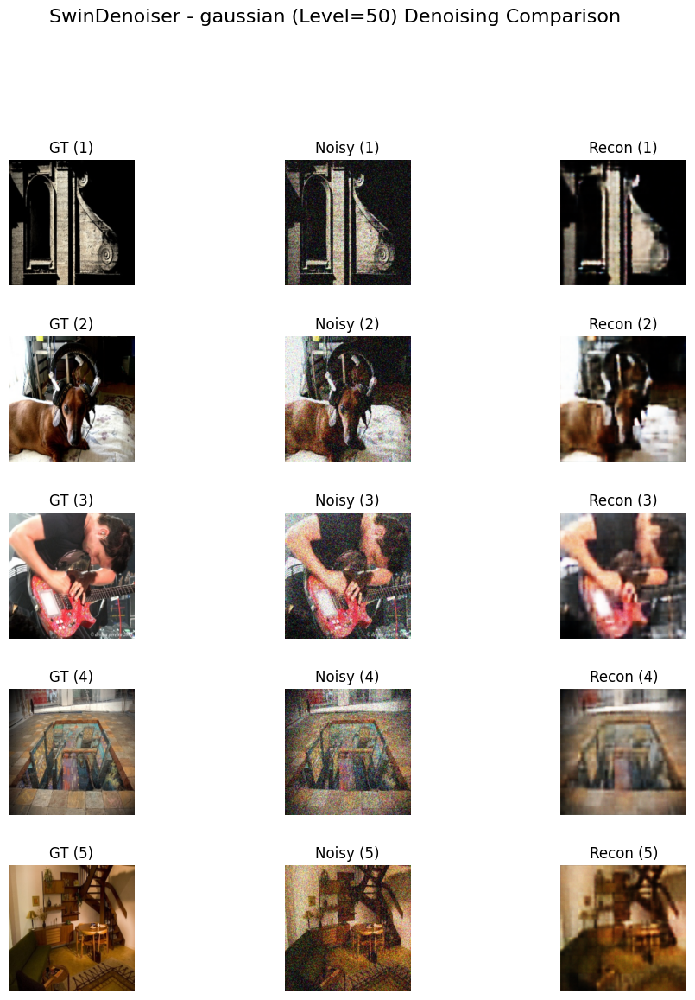


--- SwinDenoiser Fine-tuning and Evaluation Complete for gaussian (Level=50) ---


In [ ]:
# === CELL: Standalone SwinDenoiser Fine-tuning & Evaluation ===

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader # If needed
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time
import math
import gc
import os # If needed for path checks
import torch.nn.functional as F # If needed by models

# 1. Install and import timm
try:
    import timm
    print(f"timm version: {timm.__version__}")
except ImportError:
    print("Installing timm...")
    !pip install -q timm # Use -q for quieter install
    import timm
    print(f"timm version: {timm.__version__} installed.")

# Ensure scikit-image is installed (`pip install scikit-image`)
try:
    from skimage.metrics import peak_signal_noise_ratio as psnr
    from skimage.metrics import structural_similarity as ssim
    from skimage.metrics import mean_squared_error as mse
except ImportError:
    print("ERROR: scikit-image not found. Please install it: pip install scikit-image")
    raise

print(f"PyTorch Version: {torch.__version__}")
# --- Device Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


# --- 2. Model Definition ---



import timm # Ensure timm is imported
import math
import torch
import torch.nn as nn
import torch.nn.functional as F # Might be needed by helper blocks if defined here


class SwinDenoiser(nn.Module):
    """
    Uses pre-trained Swin Transformer + CNN Decoder.
    Includes permutation for Swin output.
    Configured for 224x224 input size.
    """
    def __init__(self, model_name='swin_tiny_patch4_window7_224', pretrained=True,
                 input_img_size=224,
                 decoder_channels=[512, 256, 128, 64, 32], # Channels for decoder stages
                 output_channels=3):
        super().__init__()
        self.input_img_size = input_img_size

        # Load Swin Backbone
        try:
            self.swin_backbone = timm.create_model(
                model_name, pretrained=pretrained, features_only=True,
                out_indices=(-1,), drop_path_rate=0.1
                # Note: Keep img_size removed here to use default 224
            )
            print(f"Loaded Swin backbone '{model_name}' (pretrained={pretrained})")

            # Determine output shape using 224x224 dummy input
            dummy_input = torch.randn(2, 3, input_img_size, input_img_size)
            with torch.no_grad():
                dummy_features = self.swin_backbone(dummy_input)

            swin_output_tensor = dummy_features[0]
            # === Store output channels and spatial dim ===
            self.swin_out_channels = swin_output_tensor.shape[-1] # CHANNELS ARE LAST in Timm Swin features_only output usually
            self.decoder_start_spatial_dim = swin_output_tensor.shape[1] # H is dim 1 (B, H, W, C)
            print(f"Swin backbone raw output shape (B,H,W,C expected): {swin_output_tensor.shape}")
            print(f"Decoder input channels expected (C): {self.swin_out_channels}")
            print(f"Decoder start spatial size (H=W): {self.decoder_start_spatial_dim}x{self.decoder_start_spatial_dim}")

        except Exception as e: print(f"ERROR loading timm model '{model_name}': {e}"); raise

        # Define CNN Decoder (expecting B, C, H, W input)
        # Input channels = self.swin_out_channels
        # Input spatial = self.decoder_start_spatial_dim
        num_upsample_layers = int(math.log2(input_img_size / self.decoder_start_spatial_dim))
        print(f"Calculated num_upsample_layers needed: {num_upsample_layers}")

        decoder_layers = []; in_ch = self.swin_out_channels # Start with Swin output channels
        for i in range(num_upsample_layers):
            out_ch = decoder_channels[i] if i < len(decoder_channels) else decoder_channels[-1]
            decoder_layers.append(nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2))
            decoder_layers.append(nn.BatchNorm2d(out_ch))
            decoder_layers.append(nn.ReLU(True))
            in_ch = out_ch
        decoder_layers.append(nn.Conv2d(in_ch, output_channels, kernel_size=3, padding=1))
        decoder_layers.append(nn.Sigmoid())
        self.decoder = nn.Sequential(*decoder_layers)
        print(f"Built CNN decoder with {num_upsample_layers} upsampling stages.")

    def forward(self, x):
        # Input x shape: B, C, H, W (e.g., [32, 3, 224, 224])
        features = self.swin_backbone(x)[-1] # Output shape: B, H, W, C (e.g., [32, 7, 7, 768])
        # print(f"DEBUG SwinDenoiser: Raw Swin output shape: {features.shape}") # Optional debug

        # ===> CORRECTED: Permute dimensions <===
        # Change from B, H, W, C --> B, C, H, W for CNN decoder
        if features.shape[-1] == self.swin_out_channels: # Double check if channel is last
             features = features.permute(0, 3, 1, 2)
             # print(f"DEBUG SwinDenoiser: Permuted shape: {features.shape}") # Optional debug
        else:
             # This case shouldn't happen if timm output is consistent B, H, W, C
             print(f"Warning: Unexpected Swin feature shape {features.shape}, expected channels last. Decoder might fail.")


        # print(f"DEBUG SwinDenoiser: Shape BEFORE decoder (B, C, H, W): {features.shape}") # Optional debug
        reconstructed_image = self.decoder(features) # Input shape: e.g., [32, 768, 7, 7]
        # print(f"DEBUG SwinDenoiser: Shape AFTER decoder: {reconstructed_image.shape}") # Optional debug

        # Expected output shape: B, 3, H, W (e.g., [32, 3, 224, 224])
        return reconstructed_image

print("\nDefined: CORRECTED SwinDenoiser with Permute")

# --- 3. Metrics Calculation Function ---
def calculate_metrics(clean_img_np, denoised_img_np):
    clean_img_np = np.clip(clean_img_np, 0, 1); denoised_img_np = np.clip(denoised_img_np, 0, 1)
    mse_val = mse(clean_img_np, denoised_img_np); rmse_val = math.sqrt(mse_val)
    psnr_val = psnr(clean_img_np, denoised_img_np, data_range=1.0)
    ssim_val = ssim(clean_img_np, denoised_img_np, channel_axis=-1, data_range=1.0)
    return mse_val, rmse_val, psnr_val, ssim_val
# print("Defined: calculate_metrics")


# --- 4. Visualization Function ---
def visualize_denoising(model, dataloader, device, num_images=5, title_prefix=""):
    # (Using the same visualize_denoising function definition as provided before)
    model.eval(); num_images_found = 0; rows_plotted = 0; batch_num = 0; max_batches_to_check = 5
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 2.5 * num_images)); fig.subplots_adjust(hspace=0.4, wspace=0.1)
    if num_images == 1: axes = [axes]
    print(f"\n--- {title_prefix} Visualization & Sample Metrics ---")
    with torch.no_grad():
        for noisy_images, clean_images in dataloader:
            batch_num += 1;
            if num_images_found >= num_images or batch_num > max_batches_to_check: break
            outputs = model(noisy_images.to(device)).cpu()
            noisy_plot = noisy_images.cpu().numpy(); clean_plot = clean_images.numpy(); recon_plot = outputs.numpy()
            for i in range(noisy_images.size(0)):
                if num_images_found >= num_images: break
                clean_img_np = np.clip(np.transpose(clean_plot[i], (1, 2, 0)), 0, 1); noisy_img_np = np.clip(np.transpose(noisy_plot[i], (1, 2, 0)), 0, 1); recon_img_np = np.clip(np.transpose(recon_plot[i], (1, 2, 0)), 0, 1)
                ax_row = axes[num_images_found]
                ax_row[0].imshow(clean_img_np); ax_row[0].set_title(f"GT ({num_images_found+1})"); ax_row[0].axis('off')
                ax_row[1].imshow(noisy_img_np); ax_row[1].set_title(f"Noisy ({num_images_found+1})"); ax_row[1].axis('off')
                ax_row[2].imshow(recon_img_np); ax_row[2].set_title(f"Recon ({num_images_found+1})"); ax_row[2].axis('off')
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_img_np, recon_img_np); print(f"  Img {num_images_found+1}: MSE={mse_val:.4f}, RMSE={rmse_val:.4f}, PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")
                except Exception as e: print(f"  Img {num_images_found+1}: Metrics Error - {e}")
                num_images_found += 1
    for i in range(num_images_found, num_images): fig.delaxes(axes[i][0]); fig.delaxes(axes[i][1]); fig.delaxes(axes[i][2])
    fig.suptitle(f"{title_prefix} Denoising Comparison", fontsize=16, y=1.02 if num_images>1 else 1.08); plt.show()
# print("Defined: visualize_denoising")


# --- 5. Standard Training and Evaluation Function ---
# (Using the same train_and_evaluate_model function definition as provided before)
def train_and_evaluate_model(model, model_name, noise_type_str, train_loader, test_loader, device, num_epochs=20, learning_rate=1e-3):
    print(f"\n=== Fine-tuning/Training {model_name} on {noise_type_str} ===")
    model.to(device); criterion = nn.L1Loss().to(device); optimizer = optim.AdamW(model.parameters(), lr=learning_rate) # Using AdamW
    start_time = time.time(); train_loss_history, test_loss_history = [], []
    if not train_loader or not test_loader: print("ERROR: Invalid dataloaders."); return model, [], [], None
    print(f"Starting run: Epochs={num_epochs}, LR={learning_rate}, Optimizer=AdamW, Loss=L1")
    for epoch in range(num_epochs):
        epoch_start_time = time.time(); print(f"\n--- Epoch {epoch+1}/{num_epochs} ---"); model.train(); running_train_loss = 0.0
        train_progress_bar = tqdm(train_loader, desc=f"E{epoch+1} Train", leave=False)
        for noisy_imgs, clean_imgs in train_progress_bar:
            noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = model(noisy_imgs); loss = criterion(outputs, clean_imgs)
            optimizer.zero_grad(); loss.backward(); optimizer.step(); running_train_loss += loss.item() * noisy_imgs.size(0)
            train_progress_bar.set_postfix({'L1': f'{loss.item():.6f}'})
        epoch_train_loss = running_train_loss / len(train_loader.dataset); train_loss_history.append(epoch_train_loss); print(f"Train Loss ({criterion.__class__.__name__}): {epoch_train_loss:.6f}")
        model.eval(); running_test_loss = 0.0
        with torch.no_grad():
            for noisy_imgs, clean_imgs in test_loader: noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = model(noisy_imgs); loss = criterion(outputs, clean_imgs); running_test_loss += loss.item() * noisy_imgs.size(0)
        epoch_test_loss = running_test_loss / len(test_loader.dataset); test_loss_history.append(epoch_test_loss); print(f"Test Loss  ({criterion.__class__.__name__}): {epoch_test_loss:.6f}")
        print(f"Epoch completed in {time.time() - epoch_start_time:.2f}s")
    print(f"\nTraining Finished! Total Time: {(time.time() - start_time) / 60:.2f} min.")
    print(f"\n--- Calculating Final Metrics on Test Set ({noise_type_str}) ---"); model.eval()
    total_mse, total_rmse, total_psnr, total_ssim = 0.0, 0.0, 0.0, 0.0; num_samples = 0
    eval_progress_bar = tqdm(test_loader, desc="Final Eval", leave=False)
    with torch.no_grad():
        for noisy_imgs, clean_imgs in eval_progress_bar:
            batch_size = clean_imgs.size(0); outputs = model(noisy_imgs.to(device)).cpu(); clean_np = clean_imgs.numpy(); outputs_np = outputs.numpy(); actual_processed = 0
            for i in range(batch_size):
                clean_single = np.clip(np.transpose(clean_np[i], (1, 2, 0)), 0, 1); output_single = np.clip(np.transpose(outputs_np[i], (1, 2, 0)), 0, 1)
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_single, output_single); total_mse += mse_val; total_rmse += rmse_val; total_psnr += psnr_val; total_ssim += ssim_val; actual_processed += 1
                except Exception as metric_e: print(f"Warn: Metric calc error: {metric_e}")
            num_samples += actual_processed
    avg_metrics = {};
    if num_samples > 0: avg_metrics["MSE"] = total_mse / num_samples; avg_metrics["RMSE"] = math.sqrt(avg_metrics["MSE"]); avg_metrics["PSNR"] = total_psnr / num_samples; avg_metrics["SSIM"] = total_ssim / num_samples
    else: avg_metrics = {"MSE": float('nan'),"RMSE": float('nan'),"PSNR": float('nan'),"SSIM": float('nan')}
    plt.figure(figsize=(10, 5)); plt.plot(range(1, num_epochs + 1), train_loss_history, marker='o', label='Training Loss'); plt.plot(range(1, num_epochs + 1), test_loss_history, marker='o', label='Test Loss'); plt.xlabel('Epoch'); plt.ylabel(f'Loss ({criterion.__class__.__name__})');
    plt.title(f'{model_name} - Training & Test Loss ({noise_type_str})'); plt.legend(); plt.grid(True); plt.xticks(range(1, num_epochs + 1)); plt.show()
    return model, train_loss_history, test_loss_history, avg_metrics
# print("Defined: train_and_evaluate_model")


# --- 6. Execution Block for SwinDenoiser Fine-tuning ---

# --- Select Noise Type and Loaders to use for this run ---
# Ensure the loader variables (e.g., gauss_50_train_loader) exist from Cell 3 execution
noise_type_to_run = 'gaussian' # Options: 'gaussian', 'saltpepper', 'speckle'
noise_level_to_run = 50        # Options: 50, 0.15, 0.1 (match noise_type)
noise_label_to_run = f"{noise_type_to_run} (Level={noise_level_to_run})"

try:
    level_str = str(noise_level_to_run).replace('.','')
    loader_suffix = f"{noise_type_to_run}_{level_str}" # e.g., gauss_50, sp_015, speckle_01
    train_loader = globals()[f"{loader_suffix}_train_loader"]
    test_loader = globals()[f"{loader_suffix}_test_loader"]
    if train_loader is None or test_loader is None: raise ValueError("Loaders are None")
    print(f"\n--- Preparing Fine-tuning for SwinDenoiser on {noise_label_to_run} ---")
    print(f"Using loaders: {loader_suffix}_train_loader, {loader_suffix}_test_loader")
except Exception as e:
    print(f"ERROR: Could not find or access DataLoaders for {noise_label_to_run}: {e}")
    print("--> Make sure Cell 3 ran successfully for the HIGH noise dataset and created the correct loader variables.")
    raise # Stop execution if loaders aren't ready

# --- Define Hyperparameters for Fine-tuning SwinDenoiser ---
FINETUNE_EPOCHS = 30  # Fewer epochs usually needed for fine-tuning
FINETUNE_LR = 1e-4    # VERY low learning rate

# --- Instantiate the SwinDenoiser Model (will load pretrained Swin weights) ---
print("\nInitializing SwinDenoiser model...")
swin_denoiser_model = SwinDenoiser(
    model_name='swin_tiny_patch4_window7_224', # You can try other variants like 'swin_small...'
    pretrained=True,
    input_img_size=224 # Our image size
).to(device)

# --- Fine-tune and Evaluate the SwinDenoiser Model ---
# Using the standard train_and_evaluate function, but with fine-tuning hyperparameters
trained_swin_model, _, _, swin_metrics = train_and_evaluate_model(
    model=swin_denoiser_model,
    model_name="SwinDenoiser",
    noise_type_str=noise_label_to_run,
    train_loader=train_loader,
    test_loader=test_loader,
    device=device,
    num_epochs=FINETUNE_EPOCHS, # Use fine-tuning epochs
    learning_rate=FINETUNE_LR  # Use fine-tuning LR
)

# --- Print Final Metrics ---
if swin_metrics and "Status" not in swin_metrics:
    print(f"\n--- Final Test Set Metrics for SwinDenoiser on {noise_label_to_run} ---")
    for metric, value in swin_metrics.items():
        print(f"  Average {metric}: {value:.4f}" + (" dB" if metric=="PSNR" else ""))
    print("-" * 50)
else:
    print("Metrics calculation failed or training did not complete successfully.")

# --- Visualize Results ---
if trained_swin_model and test_loader:
    print(f"\n--- Visualizing SwinDenoiser Results on {noise_label_to_run} ---")
    try:
        visualize_denoising(trained_swin_model, test_loader, device, num_images=5, title_prefix=f"SwinDenoiser - {noise_label_to_run}")
    except NameError: print("ERROR: visualize_denoising function not defined.")
    except Exception as e: print(f"An error occurred during visualization: {e}")

print(f"\n--- SwinDenoiser Fine-tuning and Evaluation Complete for {noise_label_to_run} ---")

Required libraries found.
timm version: 1.0.15
PyTorch Version: 2.6.0+cu124
Using device: cuda
Defined: SwinDenoiser
Defined: calculate_metrics
Defined: visualize_denoising
Defined: train_and_evaluate_model

===== STARTING SWINDENOISER EXPERIMENTS (HIGH NOISE) =====

----------------------------------------
--- Task: SwinDenoiser on Gaussian (Sigma=50) ---
Using loaders: gaussian_50_train_loader, gaussian_50_test_loader (5000 train, 1250 test)
Initializing fresh SwinDenoiser model (loads pretrained Swin)...
  Loaded Swin backbone 'swin_tiny_patch4_window7_224' (pretrained=True) for 224x224
  Swin features: Channels=768, Size=7x7
  Built CNN decoder with 5 upsampling stages.
Using Fine-tuning: Epochs=30, LR=0.0001

=== Fine-tuning/Training SwinDenoiser on Gaussian (Sigma=50) ===
Starting run: Epochs=30, LR=0.0001, Optimizer=AdamW, Loss=L1

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.168398
Test Loss  (L1Loss): 0.118210
Epoch completed in 25.86s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.102372
Test Loss  (L1Loss): 0.091222
Epoch completed in 25.89s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.082760
Test Loss  (L1Loss): 0.094527
Epoch completed in 25.91s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.074635
Test Loss  (L1Loss): 0.081340
Epoch completed in 25.81s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.070241
Test Loss  (L1Loss): 0.071696
Epoch completed in 25.84s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.068618
Test Loss  (L1Loss): 0.066155
Epoch completed in 25.84s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.066520
Test Loss  (L1Loss): 0.062325
Epoch completed in 25.87s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.064678
Test Loss  (L1Loss): 0.061190
Epoch completed in 25.88s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.064790
Test Loss  (L1Loss): 0.060627
Epoch completed in 25.83s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.061349
Test Loss  (L1Loss): 0.058520
Epoch completed in 25.82s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.060824
Test Loss  (L1Loss): 0.055499
Epoch completed in 25.77s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.059349
Test Loss  (L1Loss): 0.056379
Epoch completed in 25.95s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.058472
Test Loss  (L1Loss): 0.053560
Epoch completed in 25.89s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.058485
Test Loss  (L1Loss): 0.053066
Epoch completed in 25.89s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.057914
Test Loss  (L1Loss): 0.065506
Epoch completed in 25.86s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.056611
Test Loss  (L1Loss): 0.058145
Epoch completed in 25.90s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055735
Test Loss  (L1Loss): 0.058466
Epoch completed in 25.82s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055365
Test Loss  (L1Loss): 0.051805
Epoch completed in 25.86s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.053493
Test Loss  (L1Loss): 0.050057
Epoch completed in 25.92s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.053852
Test Loss  (L1Loss): 0.052254
Epoch completed in 25.91s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.053102
Test Loss  (L1Loss): 0.049816
Epoch completed in 25.94s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.052387
Test Loss  (L1Loss): 0.051466
Epoch completed in 25.97s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051590
Test Loss  (L1Loss): 0.050920
Epoch completed in 25.91s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051479
Test Loss  (L1Loss): 0.047749
Epoch completed in 25.84s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051052
Test Loss  (L1Loss): 0.049299
Epoch completed in 25.84s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.050770
Test Loss  (L1Loss): 0.048104
Epoch completed in 25.87s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.049898
Test Loss  (L1Loss): 0.049176
Epoch completed in 25.89s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.049213
Test Loss  (L1Loss): 0.046078
Epoch completed in 25.87s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046527
Test Loss  (L1Loss): 0.044962
Epoch completed in 25.84s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045659
Test Loss  (L1Loss): 0.043328
Epoch completed in 25.90s

Training Finished! Total Time: 12.94 min.

--- Calculating Final Metrics on Test Set (Gaussian (Sigma=50)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

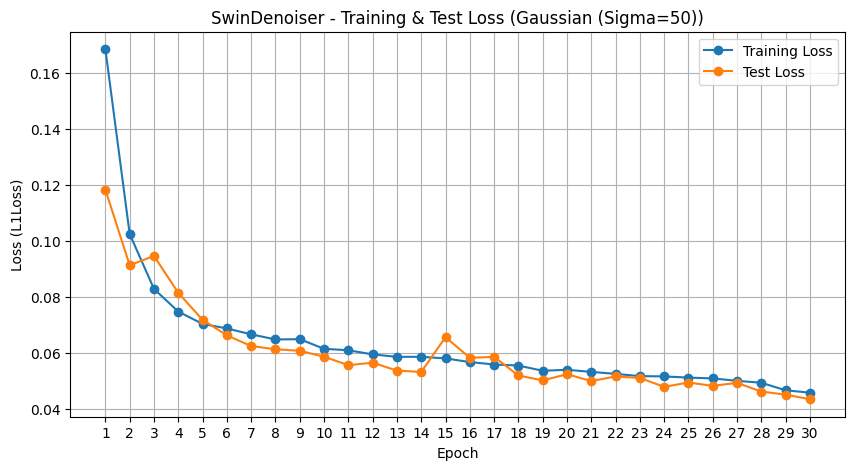


--- Final Test Set Metrics for SwinDenoiser on Gaussian (Sigma=50) ---
  Average MSE: 0.0047
  Average RMSE: 0.0688
  Average PSNR: 24.1450 dB
  Average SSIM: 0.6684
--------------------------------------------------

--- Visualizing SwinDenoiser Results on Gaussian (Sigma=50) ---

--- SwinDenoiser - Gaussian (Sigma=50) Visualization & Sample Metrics ---
  Img 1: MSE=0.0073, RMSE=0.0857, PSNR=21.34 dB, SSIM=0.7141
  Img 2: MSE=0.0056, RMSE=0.0750, PSNR=22.50 dB, SSIM=0.6850
  Img 3: MSE=0.0060, RMSE=0.0775, PSNR=22.21 dB, SSIM=0.6565
  Img 4: MSE=0.0036, RMSE=0.0604, PSNR=24.38 dB, SSIM=0.5880
  Img 5: MSE=0.0034, RMSE=0.0585, PSNR=24.66 dB, SSIM=0.6476


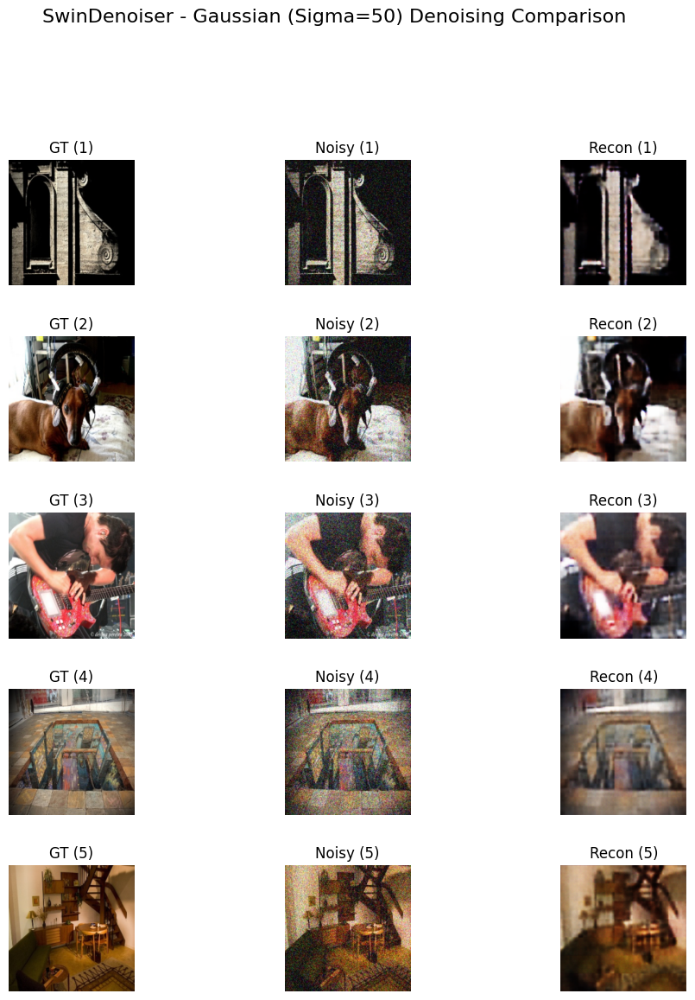


----------------------------------------
--- Task: SwinDenoiser on Salt & Pepper (Density=0.15) ---
Using loaders: saltpepper_015_train_loader, saltpepper_015_test_loader (5000 train, 1250 test)
Initializing fresh SwinDenoiser model (loads pretrained Swin)...
  Loaded Swin backbone 'swin_tiny_patch4_window7_224' (pretrained=True) for 224x224
  Swin features: Channels=768, Size=7x7
  Built CNN decoder with 5 upsampling stages.
Using Fine-tuning: Epochs=30, LR=0.0001

=== Fine-tuning/Training SwinDenoiser on Salt & Pepper (Density=0.15) ===
Starting run: Epochs=30, LR=0.0001, Optimizer=AdamW, Loss=L1

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.169731
Test Loss  (L1Loss): 0.105979
Epoch completed in 25.92s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.106134
Test Loss  (L1Loss): 0.093458
Epoch completed in 25.97s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.088437
Test Loss  (L1Loss): 0.079074
Epoch completed in 26.01s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.074474
Test Loss  (L1Loss): 0.074411
Epoch completed in 25.89s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.069862
Test Loss  (L1Loss): 0.064740
Epoch completed in 25.98s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.068554
Test Loss  (L1Loss): 0.069923
Epoch completed in 25.91s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.067793
Test Loss  (L1Loss): 0.062986
Epoch completed in 25.99s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.066666
Test Loss  (L1Loss): 0.062097
Epoch completed in 26.00s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.063706
Test Loss  (L1Loss): 0.067505
Epoch completed in 25.99s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.063401
Test Loss  (L1Loss): 0.061724
Epoch completed in 25.96s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.060548
Test Loss  (L1Loss): 0.057803
Epoch completed in 25.98s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.058063
Test Loss  (L1Loss): 0.053911
Epoch completed in 25.93s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.055902
Test Loss  (L1Loss): 0.053369
Epoch completed in 25.94s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.054414
Test Loss  (L1Loss): 0.049409
Epoch completed in 25.97s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.053080
Test Loss  (L1Loss): 0.054412
Epoch completed in 26.02s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.052619
Test Loss  (L1Loss): 0.047789
Epoch completed in 25.99s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.051143
Test Loss  (L1Loss): 0.047037
Epoch completed in 26.01s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.050877
Test Loss  (L1Loss): 0.045629
Epoch completed in 25.91s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.049960
Test Loss  (L1Loss): 0.045968
Epoch completed in 25.87s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048808
Test Loss  (L1Loss): 0.044539
Epoch completed in 25.91s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047627
Test Loss  (L1Loss): 0.044940
Epoch completed in 25.93s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047138
Test Loss  (L1Loss): 0.045774
Epoch completed in 25.85s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048353
Test Loss  (L1Loss): 0.043472
Epoch completed in 25.88s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046140
Test Loss  (L1Loss): 0.043412
Epoch completed in 25.89s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045976
Test Loss  (L1Loss): 0.042843
Epoch completed in 25.85s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046019
Test Loss  (L1Loss): 0.047296
Epoch completed in 25.97s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045779
Test Loss  (L1Loss): 0.042558
Epoch completed in 25.92s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045057
Test Loss  (L1Loss): 0.041179
Epoch completed in 25.96s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044308
Test Loss  (L1Loss): 0.043499
Epoch completed in 25.92s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044217
Test Loss  (L1Loss): 0.042827
Epoch completed in 26.01s

Training Finished! Total Time: 12.97 min.

--- Calculating Final Metrics on Test Set (Salt & Pepper (Density=0.15)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

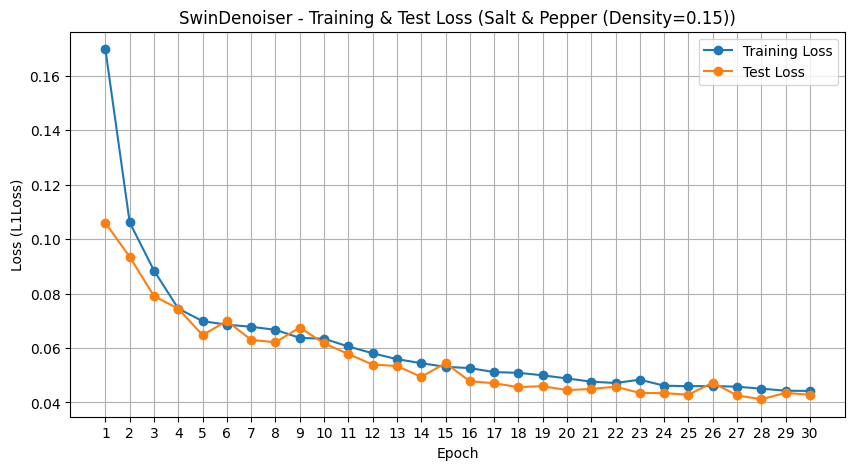


--- Final Test Set Metrics for SwinDenoiser on Salt & Pepper (Density=0.15) ---
  Average MSE: 0.0048
  Average RMSE: 0.0693
  Average PSNR: 24.1219 dB
  Average SSIM: 0.6861
--------------------------------------------------

--- Visualizing SwinDenoiser Results on Salt & Pepper (Density=0.15) ---

--- SwinDenoiser - Salt & Pepper (Density=0.15) Visualization & Sample Metrics ---
  Img 1: MSE=0.0078, RMSE=0.0886, PSNR=21.06 dB, SSIM=0.7005
  Img 2: MSE=0.0059, RMSE=0.0768, PSNR=22.30 dB, SSIM=0.6949
  Img 3: MSE=0.0060, RMSE=0.0773, PSNR=22.23 dB, SSIM=0.6681
  Img 4: MSE=0.0037, RMSE=0.0605, PSNR=24.36 dB, SSIM=0.5932
  Img 5: MSE=0.0032, RMSE=0.0569, PSNR=24.90 dB, SSIM=0.6877


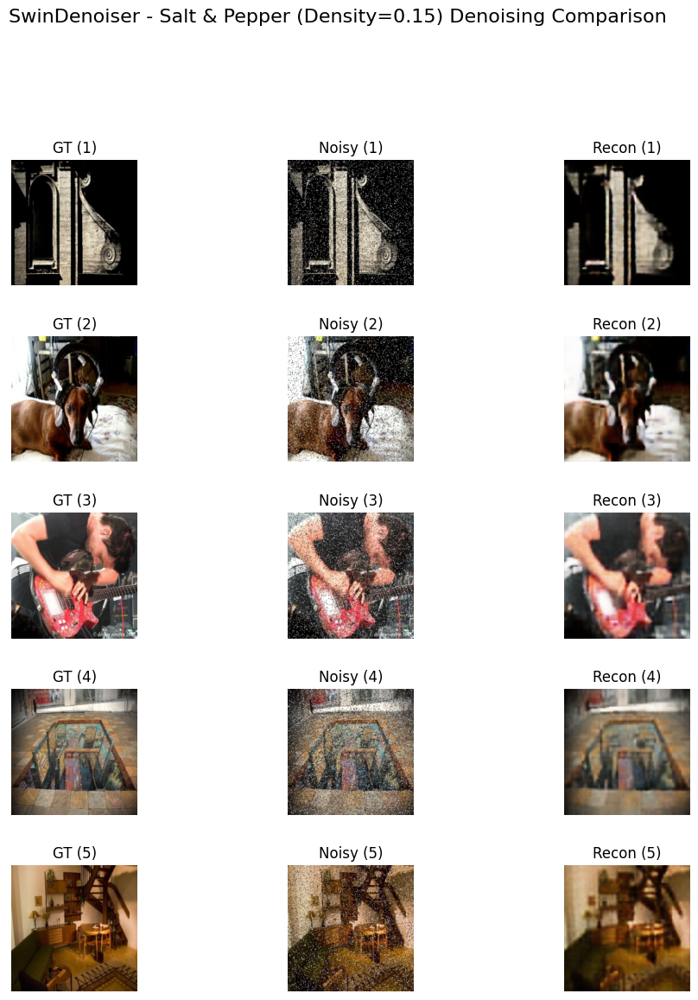


----------------------------------------
--- Task: SwinDenoiser on Speckle (Variance=0.1) ---
Using loaders: speckle_01_train_loader, speckle_01_test_loader (5000 train, 1250 test)
Initializing fresh SwinDenoiser model (loads pretrained Swin)...
  Loaded Swin backbone 'swin_tiny_patch4_window7_224' (pretrained=True) for 224x224
  Swin features: Channels=768, Size=7x7
  Built CNN decoder with 5 upsampling stages.
Using Fine-tuning: Epochs=30, LR=0.0001

=== Fine-tuning/Training SwinDenoiser on Speckle (Variance=0.1) ===
Starting run: Epochs=30, LR=0.0001, Optimizer=AdamW, Loss=L1

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.163082
Test Loss  (L1Loss): 0.112773
Epoch completed in 26.01s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.107178
Test Loss  (L1Loss): 0.095994
Epoch completed in 25.92s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.095611
Test Loss  (L1Loss): 0.091052
Epoch completed in 25.97s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.078067
Test Loss  (L1Loss): 0.074913
Epoch completed in 26.03s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.072138
Test Loss  (L1Loss): 0.069709
Epoch completed in 25.92s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.069678
Test Loss  (L1Loss): 0.070094
Epoch completed in 25.90s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.067203
Test Loss  (L1Loss): 0.062971
Epoch completed in 25.87s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.064905
Test Loss  (L1Loss): 0.066824
Epoch completed in 25.91s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.064946
Test Loss  (L1Loss): 0.069315
Epoch completed in 25.95s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.062757
Test Loss  (L1Loss): 0.065667
Epoch completed in 26.03s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.059785
Test Loss  (L1Loss): 0.062555
Epoch completed in 25.94s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.057131
Test Loss  (L1Loss): 0.066222
Epoch completed in 25.99s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.054870
Test Loss  (L1Loss): 0.050808
Epoch completed in 25.96s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.054798
Test Loss  (L1Loss): 0.051361
Epoch completed in 25.98s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.052521
Test Loss  (L1Loss): 0.049188
Epoch completed in 25.94s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.052022
Test Loss  (L1Loss): 0.048483
Epoch completed in 26.04s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.052033
Test Loss  (L1Loss): 0.053012
Epoch completed in 25.98s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.050578
Test Loss  (L1Loss): 0.048503
Epoch completed in 25.99s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.049269
Test Loss  (L1Loss): 0.049315
Epoch completed in 25.89s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.048304
Test Loss  (L1Loss): 0.043945
Epoch completed in 25.99s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047891
Test Loss  (L1Loss): 0.043663
Epoch completed in 25.94s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047417
Test Loss  (L1Loss): 0.046528
Epoch completed in 25.88s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.047586
Test Loss  (L1Loss): 0.045221
Epoch completed in 25.99s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046475
Test Loss  (L1Loss): 0.045155
Epoch completed in 25.94s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046698
Test Loss  (L1Loss): 0.041279
Epoch completed in 25.97s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045160
Test Loss  (L1Loss): 0.041102
Epoch completed in 25.92s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.045150
Test Loss  (L1Loss): 0.041522
Epoch completed in 25.90s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044620
Test Loss  (L1Loss): 0.041594
Epoch completed in 25.97s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043849
Test Loss  (L1Loss): 0.042494
Epoch completed in 25.94s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.044575
Test Loss  (L1Loss): 0.041659
Epoch completed in 25.98s

Training Finished! Total Time: 12.98 min.

--- Calculating Final Metrics on Test Set (Speckle (Variance=0.1)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

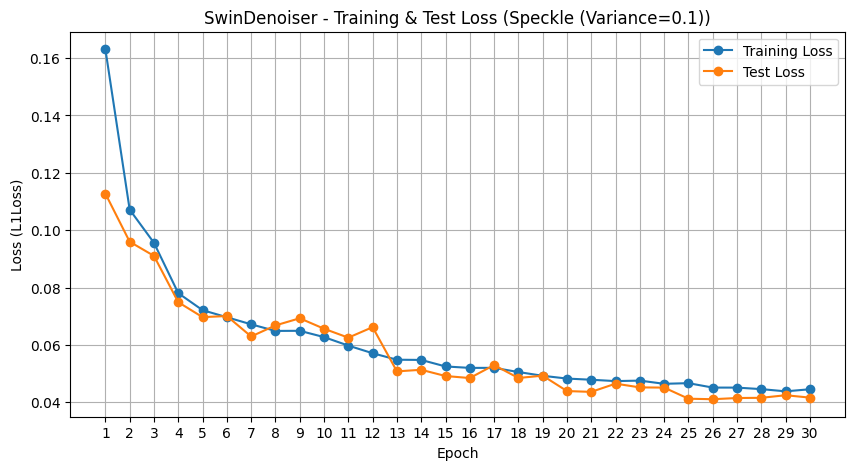


--- Final Test Set Metrics for SwinDenoiser on Speckle (Variance=0.1) ---
  Average MSE: 0.0045
  Average RMSE: 0.0673
  Average PSNR: 24.3539 dB
  Average SSIM: 0.6949
--------------------------------------------------

--- Visualizing SwinDenoiser Results on Speckle (Variance=0.1) ---

--- SwinDenoiser - Speckle (Variance=0.1) Visualization & Sample Metrics ---
  Img 1: MSE=0.0071, RMSE=0.0842, PSNR=21.49 dB, SSIM=0.7316
  Img 2: MSE=0.0056, RMSE=0.0749, PSNR=22.51 dB, SSIM=0.7107
  Img 3: MSE=0.0056, RMSE=0.0746, PSNR=22.55 dB, SSIM=0.6845
  Img 4: MSE=0.0034, RMSE=0.0584, PSNR=24.66 dB, SSIM=0.6193
  Img 5: MSE=0.0030, RMSE=0.0549, PSNR=25.21 dB, SSIM=0.6971


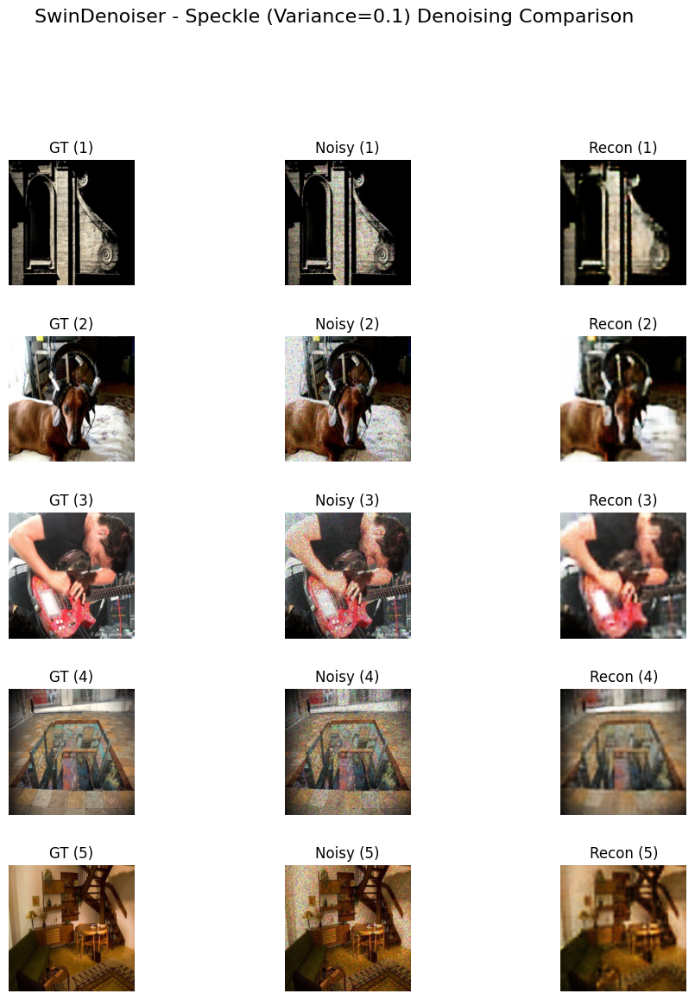


===== SWINDENOISER EXPERIMENT SUMMARY (HIGH NOISE) =====
       Model                   Noise Type     MSE   RMSE  PSNR   SSIM
SwinDenoiser          Gaussian (Sigma=50) 0.00473 0.0688 24.15 0.6684
SwinDenoiser Salt & Pepper (Density=0.15) 0.00480 0.0693 24.12 0.6861
SwinDenoiser       Speckle (Variance=0.1) 0.00453 0.0673 24.35 0.6949

===== End of SwinDenoiser Experiments =====


In [ ]:
# === CELL: SwinDenoiser Fine-tuning & Evaluation Across All High Noise Types ===

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader # If needed
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time
import math
import gc
import os # If needed for path checks
import torch.nn.functional as F # If needed by models
import pandas as pd # Optional: For table output
import json # For fallback output

# --- Ensure necessary libraries are installed ---
try:
    import timm
    from skimage.metrics import peak_signal_noise_ratio as psnr
    from skimage.metrics import structural_similarity as ssim
    from skimage.metrics import mean_squared_error as mse
    print(f"Required libraries found.")
    print(f"timm version: {timm.__version__}")
except ImportError as e:
    print(f"ERROR: Missing library - {e}. Please install required libraries (timm, scikit-image).")
    raise

print(f"PyTorch Version: {torch.__version__}")
# --- 1. Device Setup ---
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


# --- 2. Model Definition (SwinDenoiser) ---
class SwinDenoiser(nn.Module):
    """ Uses pre-trained Swin Transformer + CNN Decoder """
    def __init__(self, model_name='swin_tiny_patch4_window7_224', pretrained=True,
                 input_img_size=224, decoder_channels=[512, 256, 128, 64, 32], output_channels=3):
        super().__init__()
        self.input_img_size = input_img_size; self.model_name=model_name # Store model_name for info
        try:
            self.swin_backbone = timm.create_model(
                model_name, pretrained=pretrained, features_only=True, out_indices=(-1,), drop_path_rate=0.1
            )
            print(f"  Loaded Swin backbone '{model_name}' (pretrained={pretrained}) for {input_img_size}x{input_img_size}")
            dummy_input = torch.randn(2, 3, input_img_size, input_img_size)
            with torch.no_grad(): dummy_features = self.swin_backbone(dummy_input)
            swin_output_tensor = dummy_features[0]; self.swin_out_channels = swin_output_tensor.shape[-1]
            self.decoder_start_spatial_dim = swin_output_tensor.shape[1]
            print(f"  Swin features: Channels={self.swin_out_channels}, Size={self.decoder_start_spatial_dim}x{self.decoder_start_spatial_dim}")
        except Exception as e: print(f"ERROR loading timm model '{model_name}': {e}"); raise
        num_upsample_layers = int(math.log2(input_img_size / self.decoder_start_spatial_dim))
        decoder_layers = []; in_ch = self.swin_out_channels
        for i in range(num_upsample_layers):
            out_ch = decoder_channels[i] if i < len(decoder_channels) else decoder_channels[-1]
            decoder_layers.append(nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2))
            decoder_layers.append(nn.BatchNorm2d(out_ch)); decoder_layers.append(nn.ReLU(True)); in_ch = out_ch
        decoder_layers.append(nn.Conv2d(in_ch, output_channels, kernel_size=3, padding=1)); decoder_layers.append(nn.Sigmoid())
        self.decoder = nn.Sequential(*decoder_layers); print(f"  Built CNN decoder with {num_upsample_layers} upsampling stages.")

    def forward(self, x):
        B, C, H, W = x.shape
        if H != self.input_img_size or W != self.input_img_size:
             print(f"Warning: SwinDenoiser expecting {self.input_img_size} input, got {H}x{W}. Resizing may occur in transform.")
             # Ensure data comes in correct size from DataLoader's transform
        features = self.swin_backbone(x)[-1] # B, H, W, C
        if features.shape[-1] == self.swin_out_channels: features = features.permute(0, 3, 1, 2) # B, C, H, W
        else: print(f"Warning: Unexpected Swin feature shape {features.shape}")
        reconstructed_image = self.decoder(features); return reconstructed_image
print("Defined: SwinDenoiser")


# --- 3. Metrics Calculation Function ---
def calculate_metrics(clean_img_np, denoised_img_np):
    clean_img_np = np.clip(clean_img_np, 0, 1); denoised_img_np = np.clip(denoised_img_np, 0, 1)
    mse_val = mse(clean_img_np, denoised_img_np); rmse_val = math.sqrt(mse_val)
    psnr_val = psnr(clean_img_np, denoised_img_np, data_range=1.0)
    ssim_val = ssim(clean_img_np, denoised_img_np, channel_axis=-1, data_range=1.0)
    return mse_val, rmse_val, psnr_val, ssim_val
print("Defined: calculate_metrics")


# --- 4. Visualization Function ---
def visualize_denoising(model, dataloader, device, num_images=5, title_prefix=""):
    # (Using the same visualize_denoising function definition as provided before)
    model.eval(); num_images_found = 0; rows_plotted = 0; batch_num = 0; max_batches_to_check = 5
    fig, axes = plt.subplots(num_images, 3, figsize=(12, 2.5 * num_images)); fig.subplots_adjust(hspace=0.4, wspace=0.1)
    if num_images == 1: axes = [axes]
    print(f"\n--- {title_prefix} Visualization & Sample Metrics ---")
    with torch.no_grad():
        for noisy_images, clean_images in dataloader:
            batch_num += 1;
            if num_images_found >= num_images or batch_num > max_batches_to_check: break
            outputs = model(noisy_images.to(device)).cpu()
            noisy_plot = noisy_images.cpu().numpy(); clean_plot = clean_images.numpy(); recon_plot = outputs.numpy()
            for i in range(noisy_images.size(0)):
                if num_images_found >= num_images: break
                clean_img_np = np.clip(np.transpose(clean_plot[i], (1, 2, 0)), 0, 1); noisy_img_np = np.clip(np.transpose(noisy_plot[i], (1, 2, 0)), 0, 1); recon_img_np = np.clip(np.transpose(recon_plot[i], (1, 2, 0)), 0, 1)
                ax_row = axes[num_images_found]
                ax_row[0].imshow(clean_img_np); ax_row[0].set_title(f"GT ({num_images_found+1})"); ax_row[0].axis('off')
                ax_row[1].imshow(noisy_img_np); ax_row[1].set_title(f"Noisy ({num_images_found+1})"); ax_row[1].axis('off')
                ax_row[2].imshow(recon_img_np); ax_row[2].set_title(f"Recon ({num_images_found+1})"); ax_row[2].axis('off')
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_img_np, recon_img_np); print(f"  Img {num_images_found+1}: MSE={mse_val:.4f}, RMSE={rmse_val:.4f}, PSNR={psnr_val:.2f} dB, SSIM={ssim_val:.4f}")
                except Exception as e: print(f"  Img {num_images_found+1}: Metrics Error - {e}")
                num_images_found += 1
    for i in range(num_images_found, num_images): fig.delaxes(axes[i][0]); fig.delaxes(axes[i][1]); fig.delaxes(axes[i][2])
    fig.suptitle(f"{title_prefix} Denoising Comparison", fontsize=16, y=1.02 if num_images>1 else 1.08); plt.show()
print("Defined: visualize_denoising")


# --- 5. Standard Training and Evaluation Function ---
# (Using the same train_and_evaluate_model function definition)
def train_and_evaluate_model(model, model_name, noise_type_str, train_loader, test_loader, device, num_epochs=20, learning_rate=1e-3):
    print(f"\n=== Fine-tuning/Training {model_name} on {noise_type_str} ===")
    model.to(device); criterion = nn.L1Loss().to(device); optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
    start_time = time.time(); train_loss_history, test_loss_history = [], []
    if not train_loader or not test_loader: print("ERROR: Invalid dataloaders."); return model, [], [], None
    print(f"Starting run: Epochs={num_epochs}, LR={learning_rate}, Optimizer=AdamW, Loss=L1")
    for epoch in range(num_epochs):
        epoch_start_time = time.time(); print(f"\n--- Epoch {epoch+1}/{num_epochs} ---"); model.train(); running_train_loss = 0.0
        train_progress_bar = tqdm(train_loader, desc=f"E{epoch+1} Train", leave=False)
        for noisy_imgs, clean_imgs in train_progress_bar:
            noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = model(noisy_imgs); loss = criterion(outputs, clean_imgs)
            optimizer.zero_grad(); loss.backward(); optimizer.step(); running_train_loss += loss.item() * noisy_imgs.size(0)
            train_progress_bar.set_postfix({'L1': f'{loss.item():.6f}'})
        epoch_train_loss = running_train_loss / len(train_loader.dataset); train_loss_history.append(epoch_train_loss); print(f"Train Loss ({criterion.__class__.__name__}): {epoch_train_loss:.6f}")
        model.eval(); running_test_loss = 0.0
        with torch.no_grad():
            for noisy_imgs, clean_imgs in test_loader: noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device); outputs = model(noisy_imgs); loss = criterion(outputs, clean_imgs); running_test_loss += loss.item() * noisy_imgs.size(0)
        epoch_test_loss = running_test_loss / len(test_loader.dataset); test_loss_history.append(epoch_test_loss); print(f"Test Loss  ({criterion.__class__.__name__}): {epoch_test_loss:.6f}")
        print(f"Epoch completed in {time.time() - epoch_start_time:.2f}s")
    print(f"\nTraining Finished! Total Time: {(time.time() - start_time) / 60:.2f} min.")
    print(f"\n--- Calculating Final Metrics on Test Set ({noise_type_str}) ---"); model.eval()
    total_mse, total_rmse, total_psnr, total_ssim = 0.0, 0.0, 0.0, 0.0; num_samples = 0
    eval_progress_bar = tqdm(test_loader, desc="Final Eval", leave=False)
    with torch.no_grad():
        for noisy_imgs, clean_imgs in eval_progress_bar:
            batch_size = clean_imgs.size(0); outputs = model(noisy_imgs.to(device)).cpu(); clean_np = clean_imgs.numpy(); outputs_np = outputs.numpy(); actual_processed = 0
            for i in range(batch_size):
                clean_single = np.clip(np.transpose(clean_np[i], (1, 2, 0)), 0, 1); output_single = np.clip(np.transpose(outputs_np[i], (1, 2, 0)), 0, 1)
                try: mse_val, rmse_val, psnr_val, ssim_val = calculate_metrics(clean_single, output_single); total_mse += mse_val; total_rmse += rmse_val; total_psnr += psnr_val; total_ssim += ssim_val; actual_processed += 1
                except Exception as metric_e: print(f"Warn: Metric calc error: {metric_e}")
            num_samples += actual_processed
    avg_metrics = {};
    if num_samples > 0: avg_metrics["MSE"] = total_mse / num_samples; avg_metrics["RMSE"] = math.sqrt(avg_metrics["MSE"]); avg_metrics["PSNR"] = total_psnr / num_samples; avg_metrics["SSIM"] = total_ssim / num_samples
    else: avg_metrics = {"MSE": float('nan'),"RMSE": float('nan'),"PSNR": float('nan'),"SSIM": float('nan')}
    plt.figure(figsize=(10, 5)); plt.plot(range(1, num_epochs + 1), train_loss_history, marker='o', label='Training Loss'); plt.plot(range(1, num_epochs + 1), test_loss_history, marker='o', label='Test Loss'); plt.xlabel('Epoch'); plt.ylabel(f'Loss ({criterion.__class__.__name__})');
    plt.title(f'{model_name} - Training & Test Loss ({noise_type_str})'); plt.legend(); plt.grid(True); plt.xticks(range(1, num_epochs + 1)); plt.show()
    return model, train_loss_history, test_loss_history, avg_metrics
print("Defined: train_and_evaluate_model")

# --- 6. Main Execution Logic for SwinDenoiser across noises ---

# === Experiment Parameters ===
# Path for the HIGH noise dataset
NOISY_DATA_BASE_PATH = '/content/denoising_dataset_noisy_subset_single_g50'
# Assume CLEAN_DATA_BASE_PATH is defined from Cell 1

# Noise configurations to run (HIGH levels)
noise_configs_to_run = {
    'gaussian': {'level': 50, 'label': 'Gaussian (Sigma=50)'},
    'saltpepper': {'level': 0.15, 'label': 'Salt & Pepper (Density=0.15)'},
    'speckle': {'level': 0.1, 'label': 'Speckle (Variance=0.1)'}
}

# Model to run
model_name_to_run = "SwinDenoiser"
model_class_to_run = SwinDenoiser

# Fine-tuning hyperparameters
FINETUNE_EPOCHS = 30 # Adjust as needed
FINETUNE_LR = 1e-4   # Use a low LR for fine-tuning

# Results storage
results = {model_name_to_run: {}} # Initialize results dict for this model

print(f"\n{'='*60}\n===== STARTING SWINDENOISER EXPERIMENTS (HIGH NOISE) =====\n{'='*60}")

# --- Loop through noise types ---
for noise_type, config in noise_configs_to_run.items():
    noise_level = config['level']
    noise_label = config['label']
    print(f"\n{'-'*40}\n--- Task: {model_name_to_run} on {noise_label} ---")

    # 1. Select the correct DataLoaders for this high noise type
    train_loader, test_loader = None, None
    level_str = str(noise_level).replace('.', '')
    loader_suffix = f"{noise_type}_{level_str}"
    train_loader_var_name = f"{loader_suffix}_train_loader"
    test_loader_var_name = f"{loader_suffix}_test_loader"

    try: # Check if the required loader variables exist from Cell 3
        train_loader = globals()[train_loader_var_name]
        test_loader = globals()[test_loader_var_name]
        if train_loader is None or test_loader is None: raise ValueError(f"Loaders '{train_loader_var_name}/{test_loader_var_name}' are None.")
        print(f"Using loaders: {train_loader_var_name}, {test_loader_var_name} ({len(train_loader.dataset)} train, {len(test_loader.dataset)} test)")
    except Exception as e: print(f"ERROR selecting DataLoaders: {e}. Skipping task."); results[model_name_to_run][noise_label] = {"Status": "DataLoader Error"}; continue

    # 2. Initialize a FRESH SwinDenoiser model instance (loads pre-trained backbone)
    print(f"Initializing fresh {model_name_to_run} model (loads pretrained Swin)...")
    try:
        current_model = model_class_to_run(input_img_size=224).to(device) # Ensure 224x224
    except Exception as e: print(f"ERROR initializing {model_name_to_run}: {e}. Skipping task."); results[model_name_to_run][noise_label] = {"Status": "Model Init Error"}; continue

    # 3. Fine-tune and Evaluate
    trained_model = None; avg_metrics = None
    print(f"Using Fine-tuning: Epochs={FINETUNE_EPOCHS}, LR={FINETUNE_LR}")
    try:
         trained_model, _, _, avg_metrics = train_and_evaluate_model(
             model=current_model,
             model_name=model_name_to_run,
             noise_type_str=noise_label,
             train_loader=train_loader,
             test_loader=test_loader,
             device=device,
             num_epochs=FINETUNE_EPOCHS,   # Use fine-tune epochs
             learning_rate=FINETUNE_LR     # Use fine-tune LR
         )
    except NameError: print("ERROR: train_and_evaluate_model func not defined!"); raise
    except Exception as e: print(f"ERROR during fine-tuning: {e}"); trained_model = None; avg_metrics = {"Status": f"Runtime Error: {e}"}

    # 4. Store results
    if avg_metrics: results[model_name_to_run][noise_label] = avg_metrics
    elif "Status" not in results[model_name_to_run].get(noise_label, {}): results[model_name_to_run][noise_label] = {"Status": "Metrics Error"}
    # Print metrics immediately
    if avg_metrics and "Status" not in avg_metrics:
        print(f"\n--- Final Test Set Metrics for {model_name_to_run} on {noise_label} ---")
        for metric, value in avg_metrics.items(): print(f"  Average {metric}: {value:.4f}" + (" dB" if metric=="PSNR" else ""))
        print("-" * 50)

    # 5. Visualize Results
    if trained_model and 'visualize_denoising' in locals() and test_loader:
         print(f"\n--- Visualizing {model_name_to_run} Results on {noise_label} ---")
         try: visualize_denoising(trained_model, test_loader, device, num_images=5, title_prefix=f"{model_name_to_run} - {noise_label}")
         except NameError: print("ERROR: visualize_denoising func not defined.")
         except Exception as e: print(f"An error during visualization: {e}")
    elif not trained_model: print("Skipping visualization due to training error.")
    else: print("Skipping visualization.")

    # 6. Clean up memory
    del current_model, trained_model, train_loader, test_loader
    gc.collect();
    if torch.cuda.is_available(): torch.cuda.empty_cache()
    # --- End of noise type loop ---


print(f"\n{'='*60}\n===== SWINDENOISER EXPERIMENT SUMMARY (HIGH NOISE) =====\n{'='*60}")

# --- Print Results Table ---
try:
    df_results = []; sorted_models = sorted(results.keys()); sorted_noise_labels = sorted(noise_configs_to_run[key]['label'] for key in noise_configs_to_run)
    for model_name in sorted_models: # Only SwinDenoiser now
        for noise_label in sorted_noise_labels:
            metrics = results.get(model_name, {}).get(noise_label, {"Status": "Not Run"})
            if isinstance(metrics, dict) and "Status" not in metrics: row = {'Model': model_name, 'Noise Type': noise_label, **metrics}; df_results.append(row)
            else: status = metrics.get('Status', 'Unknown Error') if isinstance(metrics, dict) else 'Unknown Error'; row = {'Model': model_name, 'Noise Type': noise_label, 'MSE': status, 'RMSE': status, 'PSNR': status, 'SSIM': status}; df_results.append(row)
    if df_results:
         results_df = pd.DataFrame(df_results); float_format_map = {"MSE": "{:.5f}", "RMSE": "{:.4f}", "PSNR": "{:.2f}", "SSIM": "{:.4f}"}
         for col, fmt in float_format_map.items():
             if col in results_df.columns: results_df[col] = results_df[col].apply(lambda x: fmt.format(x) if isinstance(x, (int, float)) and pd.notna(x) else x)
         print(results_df.to_string(index=False))
    else: print("No results were successfully collected.")
except ImportError: print("Pandas not found. Raw results:\n", json.dumps(results, indent=2))
except Exception as e: print(f"Error formatting table: {e}\nRaw results:\n", json.dumps(results, indent=2))

print(f"\n{'='*60}\n===== End of SwinDenoiser Experiments =====\n{'='*60}")

In [ ]:
# === CELL: Save Best U-Net Model Weights ===



# Choose a filename for the saved weights
unet_weights_save_path = "unet_g50_trained_best.pth" # <<< CHOOSE a descriptive name

print(f"Saving U-Net model state dictionary to: {unet_weights_save_path}")
try:
    # Save only the state_dict
    torch.save(best_trained_unet.state_dict(), unet_weights_save_path)
    print("U-Net model weights saved successfully.")
except Exception as e:
    print(f"Error saving U-Net model weights: {e}")

Saving U-Net model state dictionary to: unet_g50_trained_best.pth
Error saving U-Net model weights: name 'best_trained_unet' is not defined


Target noisy dataset path: /content/denoising_dataset_noisy_subset_single_g50
Noise configurations to run: {'saltpepper': {'level': 0.15, 'label': 'Salt & Pepper (Density=0.15)'}}
Models to run: ['UNet']
Device for training: cuda

===== STARTING EXPERIMENTS (HIGH NOISE) =====

===== Testing Model: UNet =====

----------------------------------------
--- Task: UNet on Salt & Pepper (Density=0.15) ---
Using loaders: saltpepper_015_train_loader, saltpepper_015_test_loader
  Train loader: 5000 samples. Test loader: 1250 samples.
Initializing fresh UNet model...
Initialized UNet successfully.
Using Learning Rate: 0.0001, Epochs: 30

=== Fine-tuning/Training UNet on Salt & Pepper (Density=0.15) ===
Starting run: Epochs=30, LR=0.0001, Optimizer=AdamW, Loss=L1

--- Epoch 1/30 ---


E1 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.089317
Test Loss  (L1Loss): 0.055211
Epoch completed in 35.99s

--- Epoch 2/30 ---


E2 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.056803
Test Loss  (L1Loss): 0.046058
Epoch completed in 35.91s

--- Epoch 3/30 ---


E3 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.046778
Test Loss  (L1Loss): 0.035858
Epoch completed in 35.84s

--- Epoch 4/30 ---


E4 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.043138
Test Loss  (L1Loss): 0.034906
Epoch completed in 35.85s

--- Epoch 5/30 ---


E5 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.041387
Test Loss  (L1Loss): 0.033205
Epoch completed in 35.86s

--- Epoch 6/30 ---


E6 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.038261
Test Loss  (L1Loss): 0.031524
Epoch completed in 35.92s

--- Epoch 7/30 ---


E7 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.037062
Test Loss  (L1Loss): 0.030632
Epoch completed in 35.85s

--- Epoch 8/30 ---


E8 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.037435
Test Loss  (L1Loss): 0.031392
Epoch completed in 35.90s

--- Epoch 9/30 ---


E9 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.035109
Test Loss  (L1Loss): 0.033282
Epoch completed in 35.87s

--- Epoch 10/30 ---


E10 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.034407
Test Loss  (L1Loss): 0.031677
Epoch completed in 35.85s

--- Epoch 11/30 ---


E11 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.033771
Test Loss  (L1Loss): 0.029019
Epoch completed in 35.90s

--- Epoch 12/30 ---


E12 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.033716
Test Loss  (L1Loss): 0.028917
Epoch completed in 35.90s

--- Epoch 13/30 ---


E13 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.032471
Test Loss  (L1Loss): 0.027670
Epoch completed in 35.86s

--- Epoch 14/30 ---


E14 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.031141
Test Loss  (L1Loss): 0.028984
Epoch completed in 35.87s

--- Epoch 15/30 ---


E15 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.030853
Test Loss  (L1Loss): 0.026559
Epoch completed in 35.89s

--- Epoch 16/30 ---


E16 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.029791
Test Loss  (L1Loss): 0.028626
Epoch completed in 35.90s

--- Epoch 17/30 ---


E17 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.029602
Test Loss  (L1Loss): 0.028145
Epoch completed in 35.88s

--- Epoch 18/30 ---


E18 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.029121
Test Loss  (L1Loss): 0.026351
Epoch completed in 35.89s

--- Epoch 19/30 ---


E19 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.028834
Test Loss  (L1Loss): 0.026573
Epoch completed in 35.89s

--- Epoch 20/30 ---


E20 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027762
Test Loss  (L1Loss): 0.025850
Epoch completed in 35.92s

--- Epoch 21/30 ---


E21 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027126
Test Loss  (L1Loss): 0.025519
Epoch completed in 35.88s

--- Epoch 22/30 ---


E22 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027052
Test Loss  (L1Loss): 0.026739
Epoch completed in 35.88s

--- Epoch 23/30 ---


E23 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026428
Test Loss  (L1Loss): 0.024496
Epoch completed in 35.87s

--- Epoch 24/30 ---


E24 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.026665
Test Loss  (L1Loss): 0.025771
Epoch completed in 35.90s

--- Epoch 25/30 ---


E25 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.027156
Test Loss  (L1Loss): 0.023863
Epoch completed in 35.89s

--- Epoch 26/30 ---


E26 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025590
Test Loss  (L1Loss): 0.023735
Epoch completed in 35.91s

--- Epoch 27/30 ---


E27 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025518
Test Loss  (L1Loss): 0.025377
Epoch completed in 35.86s

--- Epoch 28/30 ---


E28 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025446
Test Loss  (L1Loss): 0.023768
Epoch completed in 35.86s

--- Epoch 29/30 ---


E29 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.024895
Test Loss  (L1Loss): 0.023268
Epoch completed in 35.86s

--- Epoch 30/30 ---


E30 Train:   0%|          | 0/157 [00:00<?, ?it/s]

Train Loss (L1Loss): 0.025498
Test Loss  (L1Loss): 0.023376
Epoch completed in 35.97s

Training Finished! Total Time: 17.94 min.

--- Calculating Final Metrics on Test Set (Salt & Pepper (Density=0.15)) ---


Final Eval:   0%|          | 0/40 [00:00<?, ?it/s]

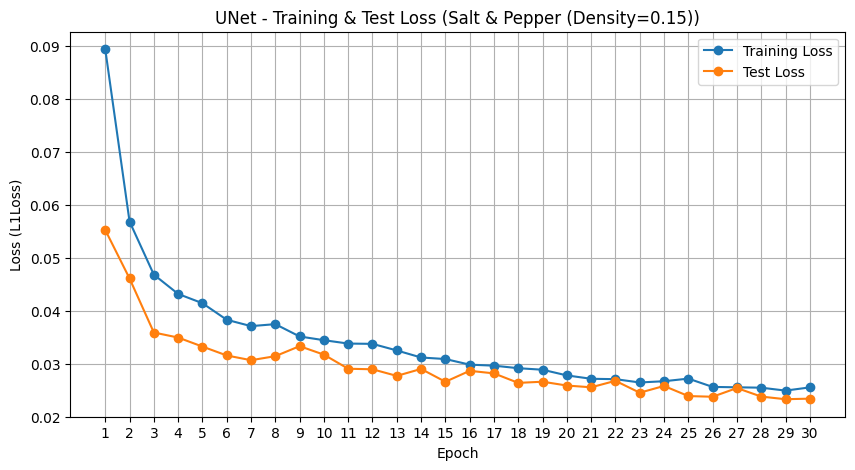


Saving weights for UNet trained on Salt & Pepper (Density=0.15)...
  Saving to: unet_saltpepper_015_weights.pth
  Weights saved successfully.


In [ ]:
# === CELL 5: Main Experiment Orchestration (High Noise: G50, S&P 0.15, Sp 0.1) ===

import torch
import pandas as pd # Optional: For nice table output
import gc # Garbage collector for potentially clearing memory
import matplotlib.pyplot as plt # Ensure plt is available
import time # Ensure time is available
import json # For printing results if pandas fails

# --- 1. Experiment Parameters ---

# --- Ensure these variables are correctly set from Cell 1 (Setup) ---
# Needs: CLEAN_DATA_BASE_PATH
# Path for the HIGH noise dataset generated earlier

NOISY_DATA_BASE_PATH = '/content/denoising_dataset_noisy_subset_single_g50' # HIGH NOISE PATH



# === Noise configurations to run (HIGH levels) ===
noise_configs_to_run = {
    #'gaussian': {'level': 50, 'label': 'Gaussian (Sigma=50)'},
    'saltpepper': {'level': 0.15, 'label': 'Salt & Pepper (Density=0.15)'},
    #'speckle': {'level': 0.1, 'label': 'Speckle (Variance=0.1)'}
}
print(f"Target noisy dataset path: {NOISY_DATA_BASE_PATH}")
print(f"Noise configurations to run: {noise_configs_to_run}")


# === Models to run ===
# Add/remove models as needed
models_to_run = {
    #"ConvAutoencoder": ConvAutoencoder,
    "UNet": UNet,
    # "GAN_Pix2Pix": (UNet, PatchGANDiscriminator) # Keep GAN commented out - requires separate train func
}
print(f"Models to run: {list(models_to_run.keys())}")


# --- Common training parameters ---
COMMON_NUM_EPOCHS = 30 # Number of epochs for each training run
COMMON_LEARNING_RATE = 1e-3 # Base LR
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device for training: {device}")


# --- Dictionary to store results ---
results = {}

# --- 2. Run Experiment Loop ---

print(f"\n{'='*60}\n===== STARTING EXPERIMENTS (HIGH NOISE) =====\n{'='*60}")

for model_name, model_info in models_to_run.items(): # Use model_info
    print(f"\n{'='*50}\n===== Testing Model: {model_name} =====\n{'='*50}")
    results[model_name] = {} # Initialize results for this model

    # --- Loop through noise types ---
    for noise_type, config in noise_configs_to_run.items():
        noise_level = config['level']
        noise_label = config['label']
        print(f"\n{'-'*40}\n--- Task: {model_name} on {noise_label} ---")

        # 1. Select the correct DataLoaders for this high noise type
        train_loader, test_loader = None, None
        level_str = str(noise_level).replace('.', '')
        loader_suffix = f"{noise_type}_{level_str}" # e.g., gaussian_50, saltpepper_015, speckle_01

        # Construct expected variable names
        train_loader_var_name = f"{loader_suffix}_train_loader" # e.g., sp_015_train_loader
        test_loader_var_name = f"{loader_suffix}_test_loader"   # e.g., sp_015_test_loader

        try: # Check if the required loader variables exist from Cell 3
            train_loader = globals()[train_loader_var_name]
            test_loader = globals()[test_loader_var_name]
            if train_loader is None or test_loader is None:
                 raise ValueError(f"Loaders '{train_loader_var_name}/{test_loader_var_name}' are None.")
            print(f"Using loaders: {train_loader_var_name}, {test_loader_var_name}")
            print(f"  Train loader: {len(train_loader.dataset)} samples. Test loader: {len(test_loader.dataset)} samples.")
        except KeyError:
             print(f"ERROR: DataLoader variables '{train_loader_var_name}' or '{test_loader_var_name}' not found.")
             print(f"--> Ensure Cell 3 created these loaders for the high noise dataset. Skipping this task.")
             results[model_name][noise_label] = {"Status": "DataLoader Missing"}
             continue # Skip to the next noise type
        except ValueError as e:
            print(f"ERROR: {e}. Skipping this task.")
            results[model_name][noise_label] = {"Status": "DataLoader None"}
            continue # Skip to the next noise type
        except Exception as e:
             print(f"An unexpected error occurred selecting DataLoaders: {e}. Skipping task.")
             results[model_name][noise_label] = {"Status": "DataLoader Selection Error"}
             continue # Skip to the next noise type


        # 2. Initialize a FRESH model instance for this specific task
        print(f"Initializing fresh {model_name} model...")
        model_instance = None
        try: # Wrap instantiation in try-except
            if model_name == "UNet": model_instance = model_info(n_channels=3, n_classes=3).to(device)
            elif model_name == "ConvAutoencoder": model_instance = model_info(input_channels=3).to(device)
            # Add elif for other models here if their __init__ differs
            else: print(f"WARNING: Default instantiation for {model_name}. Verify __init__ args."); model_instance = model_info().to(device) # Basic fallback
            print(f"Initialized {model_name} successfully.")
        except Exception as e: print(f"ERROR initializing {model_name}: {e}. Skipping task."); results[model_name][noise_label] = {"Status": "Model Init Error"}; continue


        # 3. Train and Evaluate
        trained_model = None
        avg_metrics = None
        # Use standard training function for AE/UNet
        lr = 1e-4 if model_name == "UNet" else COMMON_LEARNING_RATE # Example LR adjustment
        print(f"Using Learning Rate: {lr}, Epochs: {COMMON_NUM_EPOCHS}")
        try: # Wrap training call
             trained_model, _, _, avg_metrics = train_and_evaluate_model(
                 model=model_instance, model_name=model_name, noise_type_str=noise_label,
                 train_loader=train_loader, test_loader=test_loader, device=device,
                 num_epochs=COMMON_NUM_EPOCHS, learning_rate=lr
             )
        except NameError: print("ERROR: train_and_evaluate_model func not defined!"); raise # Stop if critical func missing
        except Exception as e: print(f"ERROR during training/evaluation: {e}"); trained_model = None; avg_metrics = {"Status": f"Runtime Error: {e}"}


        # 4. Store results
        if avg_metrics: results[model_name][noise_label] = avg_metrics
        elif "Status" not in results[model_name].get(noise_label, {}): results[model_name][noise_label] = {"Status": "Metrics Error"}

        if trained_model: # Check if training was successful
          try:
              # Create a descriptive filename including model and noise info
              level_str_save = str(noise_level).replace('.', '')
              weights_filename = f"{model_name.lower()}_{noise_type}_{level_str_save}_weights.pth"
              # Example filenames: unet_gaussian_50_weights.pth, unet_saltpepper_015_weights.pth

              print(f"\nSaving weights for {model_name} trained on {noise_label}...")
              print(f"  Saving to: {weights_filename}")
              torch.save(trained_model.state_dict(), weights_filename)
              print("  Weights saved successfully.")
          except Exception as e:
              print(f"  ERROR saving weights for {noise_label}: {e}")
        else:
            print("\nSkipping weight saving because training failed or produced no model.")
    # =====================================


    # --- End of model loop ---




**Model Deployement in Hugging face**

In [ ]:


%%writefile app.py
# Paste ALL your app.py code content below this line
# app.py

import gradio as gr
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
import math
import torch.nn.functional as F # Needed for UNet Up block
from torchvision import transforms
import os # For checking model path

print(f"PyTorch Version: {torch.__version__}")
print(f"Gradio Version: {gr.__version__}")

# --- Device Setup ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Gradio App - Using device: {device}")



class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__();
        if not mid_channels: mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(mid_channels), nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False), nn.BatchNorm2d(out_channels), nn.ReLU(inplace=True)
        );
    def forward(self, x): return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__(); self.maxpool_conv = nn.Sequential(nn.MaxPool2d(2), DoubleConv(in_channels, out_channels));
    def forward(self, x): return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__();
        conv_in_channels = out_channels + out_channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            conv_in_channels = in_channels + out_channels
        else:
            self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
            conv_in_channels = out_channels + out_channels
        self.conv = DoubleConv(conv_in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1); diffY = x2.size()[2] - x1.size()[2]; diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1); return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__(); self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1);
    def forward(self, x): return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=3, bilinear=True):
        super(UNet, self).__init__();
        self.n_channels, self.n_classes, self.bilinear = n_channels, n_classes, bilinear
        c1, c2, c3, c4, c5 = 64, 128, 256, 512, 512
        self.inc = DoubleConv(n_channels, c1)
        self.down1 = Down(c1, c2); self.down2 = Down(c2, c3); self.down3 = Down(c3, c4); self.down4 = Down(c4, c5)
        self.up1 = Up(c5, c4, bilinear); self.up2 = Up(c4, c3, bilinear); self.up3 = Up(c3, c2, bilinear); self.up4 = Up(c2, c1, bilinear)
        self.outc = OutConv(c1, n_classes); self.final_activation = nn.Sigmoid()
    def forward(self, x):
        x1=self.inc(x); x2=self.down1(x1); x3=self.down2(x2); x4=self.down3(x3); x5=self.down4(x4)
        x=self.up1(x5, x4); x=self.up2(x, x3); x=self.up3(x, x2); x=self.up4(x, x1)
        logits=self.outc(x); output=self.final_activation(logits); return output



# --- Load Model and Weights ---

MODEL_PATH = "unet_saltpepper_015_weights.pth"


model = None
if os.path.exists(MODEL_PATH):
    print(f"Loading model definition ({UNet.__name__})...")
    # === UPDATED: Instantiate UNet ===
    model = UNet(n_channels=3, n_classes=3).to(device)
    print(f"Loading weights from {MODEL_PATH}...")
    try:
        model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
        model.eval()
        print("Model weights loaded successfully.")
    except Exception as e:
         print(f"Error loading model weights: {e}"); model = None
else:
     print(f"ERROR: Weights file not found at {MODEL_PATH}.")

# --- Preprocessing and Postprocessing ---
# === UPDATED: Input size and transforms for U-Net ===
INPUT_SIZE = 128 # U-Net trained on 128x128
preprocess = transforms.Compose([
    transforms.Resize((INPUT_SIZE, INPUT_SIZE)),
    transforms.ToTensor() # Convert PIL [0,255] to Tensor [0,1]
])
print(f"Using preprocessing: Resize({INPUT_SIZE},{INPUT_SIZE}) -> ToTensor")

def postprocess(tensor):
    if tensor is None: return None
    img_np = tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()
    img_np = np.clip(img_np * 255, 0, 255).astype(np.uint8)
    return img_np

# --- Inference Function ---
def denoise_image(input_image_pil): # Input is PIL Image
    if model is None: raise gr.Error("Model weights not loaded.")
    if input_image_pil is None: raise gr.Error("No input image.")
    print(f"Received input: type={type(input_image_pil)}")
    try: # Preprocess
        input_tensor = preprocess(input_image_pil).unsqueeze(0).to(device)
        print(f"Input tensor shape: {input_tensor.shape}") # Should be [1, 3, 128, 128]
    except Exception as e: raise gr.Error(f"Preprocessing failed: {e}")
    model.eval()
    with torch.no_grad(): # Inference
        try: output_tensor = model(input_tensor); print(f"Output tensor shape: {output_tensor.shape}")
        except Exception as e: raise gr.Error(f"Model inference failed: {e}")
    try: # Postprocess
        denoised_image_np = postprocess(output_tensor); print(f"Output image shape: {denoised_image_np.shape}")
    except Exception as e: raise gr.Error(f"Postprocessing failed: {e}")
    return denoised_image_np

# --- Create Gradio Interface ---
print("\nCreating Gradio interface...")
# === UPDATED: Title and Description ===
iface = gr.Interface(
    fn=denoise_image,
    inputs=gr.Image(label="Upload Noisy Image", type="pil"), # Use PIL type for easy transform
    outputs=gr.Image(label="Denoised Image", type="numpy"), # Output NumPy for display
    title="Image Denoiser (U-Net)",
    description="Upload a noisy image (ideally with Salt & Pepper noise) to see the denoised version using a U-Net model trained on S&P noise (Density=0.15).",
    examples=[],
    allow_flagging='never'
)

# --- Launch the Interface ---
if __name__ == "__main__":
    print("Launching Gradio demo...")
    iface.launch()
import gradio as gr
import torch
import torch.nn as nn


# --- Load Model and Weights ---
MODEL_PATH = "unet_saltpepper_015_weights.pth" # <<<--- MAKE SURE THIS IS CORRECT

if __name__ == "__main__":
    print("Launching Gradio demo...")
    iface.launch()

Overwriting app.py


In [ ]:
%%writefile requirements.txt
torch>=1.10.0
torchvision>=0.11.1
gradio>=3.0.0
numpy>=1.20.0
Pillow>=9.0.0
scikit-image>=0.19.0

Writing requirements.txt


In [ ]:
!pip install huggingface_hub -q

In [ ]:
from huggingface_hub import login
login()

In [ ]:
from huggingface_hub import HfApi, upload_file

# --- Define your details ---
hf_space_id = "Abhishek4545/DIP_PROJECT"
weights_filename = "unet_saltpepper_015_weights.pth"
# --- ---

print(f"Uploading files to Space: {hf_space_id}")

try:
    # Upload app.py
    upload_file(
        path_or_fileobj="/content/app.py",
        path_in_repo="app.py", # Destination path in the Space repo
        repo_id=hf_space_id,
        repo_type="space"
    )
    print("Uploaded app.py")

    # Upload requirements.txt
    upload_file(
        path_or_fileobj="/content/requirements.txt",
        path_in_repo="requirements.txt",
        repo_id=hf_space_id,
        repo_type="space"
    )
    print("Uploaded requirements.txt")

    # Upload model weights (library should handle LFS automatically if file > 10MB)
    upload_file(
        path_or_fileobj=weights_filename,
        path_in_repo=weights_filename, # Upload to root of Space repo
        repo_id=hf_space_id,
        repo_type="space",
        commit_message=f"Upload model weights: {weights_filename}" # Optional commit message
    )
    print(f"Uploaded {weights_filename}")

    print("\nUpload complete! Check your Hugging Face Space.")
    print(f"URL: https://huggingface.co/spaces/{hf_space_id}")

except Exception as e:
    print(f"\nAn error occurred during upload: {e}")
    print("Please check your Space ID, filenames, and Hugging Face token permissions.")
    print("You might need to upload files manually via the Hugging Face website or Git.")

Uploading files to Space: Abhishek4545/DIP_PROJECT
Uploaded app.py


No files have been modified since last commit. Skipping to prevent empty commit.


Uploaded requirements.txt
Uploaded unet_saltpepper_015_weights.pth

Upload complete! Check your Hugging Face Space.
URL: https://huggingface.co/spaces/Abhishek4545/DIP_PROJECT
